# Imports

In [50]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, GroupShuffleSplit, train_test_split
from sklearn.metrics import mean_squared_error, r2_score, make_scorer, accuracy_score, confusion_matrix
from sklearn.linear_model import ElasticNet, LogisticRegression
from pyts.transformation import ShapeletTransform
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr
from scipy.interpolate import InterpolatedUnivariateSpline

# Create cell list

## Filter relevant cells and cycles

In [51]:
cell_test_per_cycle = pd.read_csv('cell_test_per_cycle_df.csv')

<AxesSubplot:>

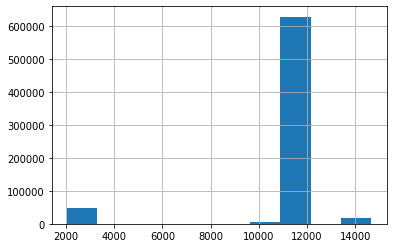

In [52]:
cell_test_per_cycle['curr_chg'].hist()

In [53]:
# filter table to include capacity check cycles only
cell_test_per_cycle_cap_check = cell_test_per_cycle.loc[(cell_test_per_cycle['curr_chg'] <= 4000) & (cell_test_per_cycle['cycle'] % 30 == 2)].copy()

# calculate normalize capacity - retention
cell_test_per_cycle_cap_check['retention'] = cell_test_per_cycle_cap_check['cap_dchg']/cell_test_per_cycle_cap_check['c_ref']

# # drop 2 last cycles for each cell (due to manual stop)
# cell_test_per_cycle_cap_check = cell_test_per_cycle_cap_check.drop(cell_test_per_cycle_cap_check.groupby(['cell_id']).tail(2).index, axis=0)

# drop cycles with retetnion < 85 - new EoL definision 
cell_test_per_cycle_cap_check = cell_test_per_cycle_cap_check.loc[cell_test_per_cycle_cap_check['retention'] >= 0.85]

# find cells that started at ~100% retention
cell_ids_valid_bol_retention = cell_test_per_cycle_cap_check.loc[cell_test_per_cycle_cap_check['retention'] >= 0.97]['cell_id']

# find cells that reached ~85% retention
cell_ids_valid_eol_retention = cell_test_per_cycle_cap_check.loc[cell_test_per_cycle_cap_check['retention'] <= 0.855]['cell_id']

# Filter only cells with bol retention >= 0.97 and 0.855 > eol retention > 0.85
cell_ids_valid_retention = list(set(cell_ids_valid_bol_retention).intersection(set(cell_ids_valid_eol_retention)))
cell_test_per_cycle_cap_check = cell_test_per_cycle_cap_check.loc[cell_test_per_cycle_cap_check['cell_id'].isin(cell_ids_valid_retention)]

print(cell_test_per_cycle_cap_check['cell_id'].unique())
cell_test_per_cycle_cap_check['cycle'].unique()

[16726 16762 16764 16766 16767 16794 16795 16796 16797 16820 16821 16822
 16823 16859 16905 16936 16937 16938 16939 16940 16958 16960 16972 16974
 16978 16995 17025 17026 17027 17028 17059 17060 17061 17062 17063 17074
 17075 17076 17077 17082 17083 17084 17085 17111 17112 17113 17114 17118
 17119 17150 17151 17157 17158 17159 17160 17169 17170 17241 17242 17308
 17311 17313 17368 17369 17404 17406 17407 17408 17445 17446 17447 17448
 17468 17478 17479 17480 17481 17482 17505 17507 17508 17509 17657 17659
 17660 17661 17663 17664 17665 17666 17705 17706 17707 17708 17737 17739
 17752 17753 17754 17755 17790 17827 17828 17829 17830 17879 17880 17881
 17882 17883 17886 17888 17889 17984 17985 17991 17992 18072 18155 18179
 18190 18191 18192 18196 18197 18198 18199 18200 18252 18253 18255 18256
 18270 18271 18272 18320 18371 18372 18397 18398 18399 18400 18402 18403
 18404 18405 18406 18465 18466 18467 18468 18470 18479 18480 18494 18495
 18496 18497 18499 18500 18501 18502 18561 18562 18

array([   2,   32,   62,   92,  122,  152,  182,  212,  242,  272,  302,
        332,  362,  392,  422,  452,  482,  512,  542,  572,  602,  632,
        662,  692,  722,  752,  782,  812,  842,  872,  902,  932,  962,
        992, 1022, 1052, 1082, 1112, 1142, 1172, 1202, 1232, 1262, 1292,
       1322, 1352, 1382, 1412, 1442, 1472, 1502, 1532, 1562, 1592])

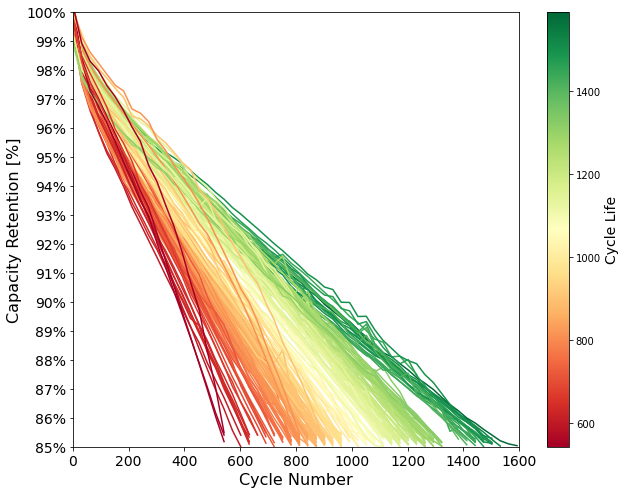

In [54]:
# Generate the plot with a gradient color map based on the final cycle number of each cell
fig, ax = plt.subplots(figsize=(10, 8))

# Calculate the final cycle number for each cell
final_cycle = cell_test_per_cycle_cap_check.groupby('cell_id')['cycle'].last()

# Normalize the final cycle values for the colormap (to range 0-1)
norm_final_cycle = (final_cycle - final_cycle.min()) / (final_cycle.max() - final_cycle.min())

# Create a normalization object for the color bar
norm = Normalize(vmin=final_cycle.min(), vmax=final_cycle.max())

# Map normalized values to colors in the colormap (using RdYlGn for red to green)
colors = [cm.RdYlGn(val) for val in norm_final_cycle]

# Plot each cell's retention curve with the corresponding color
for i, (key, grp) in enumerate(cell_test_per_cycle_cap_check.groupby(['cell_id'])):
    ax = grp.plot(ax=ax, x='cycle', y='retention', legend=False, color=colors[i])
    
# Set the y-axis limit to start at 85%
ax.set_ylim(0.85, 1.0)

# Set the y-axis limit to start at 85%
ax.set_xlim(0, 1600)

# Titles and labels
ax.set_xlabel('Cycle Number', fontsize=16)
ax.set_ylabel('Capacity Retention [%]', fontsize=16)

# Set custom ticks for the y-axis from 85% to 100% with 1% intervals
ax.set_yticks(np.arange(0.85, 1.00, 0.01))  # Setting ticks from 85% to 100%
ax.set_yticklabels([f'{int(ytick*100)}%' for ytick in np.arange(0.85, 1.00, 0.01)])  # Formatting as percentages

# Increase tick label size for better readability
ax.tick_params(axis='both', which='major', labelsize=14)

# Add colorbar to reflect the final cycle life
sm = plt.cm.ScalarMappable(cmap=cm.RdYlGn, norm=norm)
sm.set_array([])  # only needed for colorbar to work correctly
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Cycle Life', fontsize=14)

plt.show()

# Defining target variables

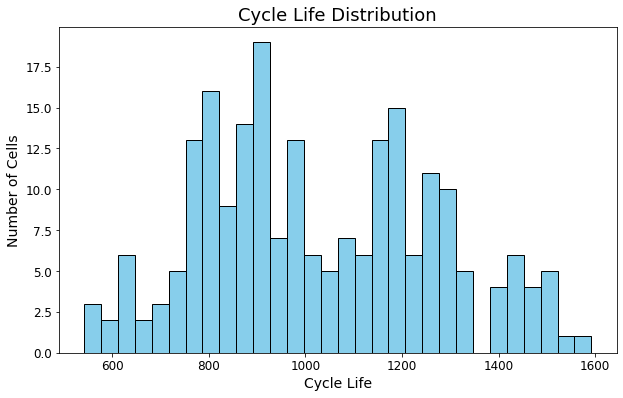

In [55]:
targets = cell_test_per_cycle_cap_check[['cell_id', 'cycle']].groupby(['cell_id']).tail(1).set_index('cell_id').sort_index()
targets.rename(columns={'cycle': 'cycle_life'}, inplace=True)

plt.figure(figsize=(10, 6))

# Plot histogram for cycle life distribution
plt.hist(targets['cycle_life'], bins=30, color='skyblue', edgecolor='black')

# Add titles and labels
plt.title('Cycle Life Distribution', fontsize=18)
plt.xlabel('Cycle Life', fontsize=14)
plt.ylabel('Number of Cells', fontsize=14)

# Adjust tick sizes for better readability
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.show()

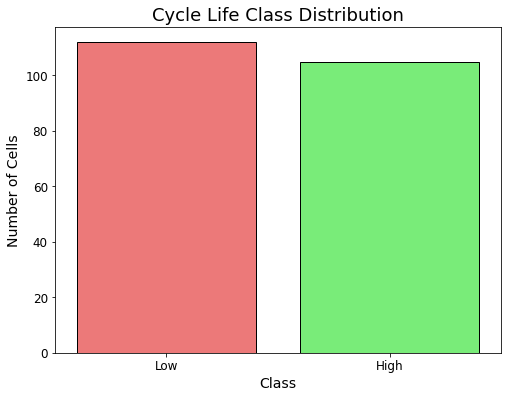

In [56]:
targets['class'] = targets['cycle_life'].apply(lambda x: "Low" if x < 1000 else "High")

plt.figure(figsize=(8, 6))

class_colors = ['#FF6666', '#66FF66']
# Create a count plot with custom colors for Low/High
sns.countplot(x='class', data=targets, palette=class_colors, edgecolor='black')

# Add titles and labels
plt.title('Cycle Life Class Distribution', fontsize=18)
plt.xlabel('Class', fontsize=14)
plt.ylabel('Number of Cells', fontsize=14)

# Adjust tick sizes for better readability
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.show()

In [57]:
targets

,cycle_life,class
cell_id,,
16726,812,Low
16762,782,Low
16764,632,Low
16766,602,Low
16767,632,Low
...,...,...
19783,692,Low
19787,662,Low
19794,902,Low


# Knowledge-Based Engineering Features

## Prep

In [58]:
# Filter put all data above 122 cycles
per_cycle_until_max_sampling_cycle = cell_test_per_cycle_cap_check.loc[cell_test_per_cycle_cap_check['cycle'] <= 122].copy()
per_cycle_until_max_sampling_cycle.groupby(['cell_id']).tail(1)

,cell_id,purpose,test_id,test_type_id,started_on,c_ref,machine,device,unit,channel,nw_test_id,ip,cycle,cap_chg,cap_dchg,engy_chg,engy_dchg,cc_ratio,cc_cap_ratio,ocv_drop_chg,ocv_drop_dchg,v_min,v_max,r_chg,r_dchg,duration,t1_max,t1_min,curr_chg,curr_dchg,r_chg_end,r_dchg_end,duration_chg,v_rest_before_dchg,v_rest_before_chg,retention
7681,16726,Control W24B - SDS02 - 24h wetting - 4.1ml - S...,75764,1133,2023-07-18 08:56:46,2736.221,NW,240098.0,3.0,5.0,2.818576e+09,109.0,122,2626.732122,2622.565872,9568.164594,8799.581542,86.214929,96.650349,-0.0270,0.1516,2.5000,4.1995,0.017108,0.011221,15451200,36.0,35.2,2736.85,-911.45,0.011730,0.018372,3863,4.1706,2.6680,0.958463
14875,16762,Control W25 - SDS02 - 72h wetting - 4.1ml - SF...,75895,1133,2023-07-19 13:20:22,2641.478,NW,240068.0,4.0,5.0,2.818580e+09,109.0,122,2521.647844,2521.488669,9201.988508,8457.769731,85.629053,96.309163,-0.0273,0.1509,2.5000,4.1998,0.022678,0.015127,15379000,38.2,34.9,2641.36,-880.45,0.016738,0.025022,3855,4.1703,2.6726,0.954575
16404,16764,Cycling EL2379 - SFF PA8\PC10,75845,1110,2023-07-19 08:11:12,2646.261,NW,240091.0,3.0,2.0,2.818576e+09,109.0,122,2525.549189,2526.232778,9201.686389,8481.049039,86.796299,96.861506,-0.0276,0.1584,2.5000,4.2001,0.015583,0.011732,15364700,35.8,35.1,2646.32,-880.45,0.006847,0.017629,3826,4.1713,2.6736,0.954642
17754,16766,Cycling EL2379 - SFF PA8\PC10,75847,1110,2023-07-19 08:12:54,2660.326,NW,240097.0,1.0,2.0,1.640000e+02,109.0,122,2531.259842,2530.706486,9216.417889,8499.636775,86.889204,96.881685,-0.0269,0.1600,2.5000,4.1998,0.014812,0.010548,15340900,37.1,36.6,2659.97,-882.93,0.012173,0.017102,3810,4.1713,2.6754,0.951277
18408,16767,Cycling EL2379 - SFF PA8\PC10,75848,1110,2023-07-19 08:13:49,2661.662,NW,240100.0,3.0,2.0,1.830000e+02,109.0,122,2530.304581,2534.261744,9215.093139,8507.828906,87.062845,96.923044,-0.0269,0.1571,2.5000,4.1995,0.015759,0.011989,15318400,36.5,35.5,2661.21,-886.65,0.007537,0.017845,3803,4.1713,2.6723,0.952135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685562,19783,C-One ETS validation FChg 35degC - SFF PA433/P...,92802,1110,2024-04-15 09:10:23,2741.769,NW,240092.0,5.0,2.0,5.940000e+02,109.0,122,2648.923981,2640.680944,9727.198097,8911.086058,87.548841,96.682919,-0.0248,0.1277,2.4996,4.2001,0.025040,0.012559,15500000,35.9,35.1,2736.85,-910.21,0.013930,0.029704,3839,4.1734,2.6550,0.963130
687660,19787,C-One ETS validation FChg 35degC - SFF PA433/P...,92806,1110,2024-04-15 09:12:51,2752.446,NW,240097.0,1.0,2.0,3.280000e+02,109.0,122,2668.560886,2662.000192,9799.539936,8986.476361,87.166757,96.759295,-0.0241,0.1299,2.5000,4.2001,0.020387,0.009861,15570800,36.2,35.6,2751.73,-913.93,0.011730,0.022382,3867,4.1741,2.6509,0.967140
691354,19794,Fchg 35degC - 9XX - calender exp EL2168-DW – 3...,92970,1110,2024-04-17 06:43:55,2619.653,NW,240097.0,4.0,1.0,3.300000e+02,109.0,122,2566.096856,2559.795131,9365.228444,8639.672903,88.574166,97.127102,-0.0288,0.1457,2.5000,4.1989,0.014950,0.009663,15654100,36.3,35.4,2617.80,-871.77,0.006912,0.016335,3862,4.1685,2.6596,0.977150
692343,19795,Fchg 35degC - 9XX - calender exp EL2168-DW – 3...,92971,1110,2024-04-17 06:44:44,2610.988,NW,240098.0,1.0,2.0,2.818576e+09,109.0,122,2561.469700,2554.838547,9353.204464,8620.374578,87.612051,96.754449,-0.0291,0.1454,2.5000,4.1992,0.014617,0.010398,15700500,37.1,36.1,2610.36,-869.29,0.010081,0.016728,3893,4.1685,2.6593,0.978495


In [59]:
cell_test_merged_identifier_columns = ['ip', 'device', 'unit', 'channel', 'nw_test_id']

In [60]:
# Drop irrelevant columns + pivot prep
drop_columns = cell_test_merged_identifier_columns + ['test_type_id', 'started_on' ,'c_ref', 'machine', 'duration', 'duration_chg'] # why drop duration?
features_per_cycle_df = per_cycle_until_max_sampling_cycle.drop(columns=drop_columns)
features_per_cycle_df['cycle_str'] = per_cycle_until_max_sampling_cycle['cycle'].apply(str)
features_per_cycle_df

,cell_id,purpose,test_id,cycle,cap_chg,cap_dchg,engy_chg,engy_dchg,cc_ratio,cc_cap_ratio,ocv_drop_chg,ocv_drop_dchg,v_min,v_max,r_chg,r_dchg,t1_max,t1_min,curr_chg,curr_dchg,r_chg_end,r_dchg_end,v_rest_before_dchg,v_rest_before_chg,retention,cycle_str
7561,16726,Control W24B - SDS02 - 24h wetting - 4.1ml - S...,75764,2,2764.750503,2723.984258,10092.032775,9124.164233,86.637878,96.772507,-0.0276,0.1485,2.5000,4.1995,0.022894,0.010891,36.1,35.1,2736.85,-910.21,0.011730,0.024203,4.1703,2.6590,0.995528,2
7591,16726,Control W24B - SDS02 - 24h wetting - 4.1ml - S...,75764,32,2684.354833,2677.673325,9775.541211,8978.457825,86.701235,96.832352,-0.0269,0.1507,2.5000,4.1995,0.018123,0.010231,36.2,35.2,2738.09,-910.21,0.009531,0.021453,4.1710,2.6689,0.978603,32
7621,16726,Control W24B - SDS02 - 24h wetting - 4.1ml - S...,75764,62,2659.662642,2656.085025,9684.850378,8909.069528,86.557966,96.609101,-0.0270,0.1507,2.5000,4.1995,0.018139,0.010231,36.2,35.3,2738.09,-910.21,0.011730,0.020023,4.1706,2.6680,0.970713,62
7651,16726,Control W24B - SDS02 - 24h wetting - 4.1ml - S...,75764,92,2641.918997,2637.576233,9621.605228,8849.116278,86.423892,96.668666,-0.0276,0.1516,2.5000,4.1992,0.017327,0.010590,36.0,35.1,2736.85,-910.21,0.009531,0.018754,4.1703,2.6680,0.963949,92
7681,16726,Control W24B - SDS02 - 24h wetting - 4.1ml - S...,75764,122,2626.732122,2622.565872,9568.164594,8799.581542,86.214929,96.650349,-0.0270,0.1516,2.5000,4.1995,0.017108,0.011221,36.0,35.2,2736.85,-911.45,0.011730,0.018372,4.1706,2.6680,0.958463,122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
696575,19801,Fchg 35degC - 9XX - calender exp EL2168-DW – 3...,93318,2,2665.075667,2615.358436,9753.840475,8816.956336,88.465371,96.907779,-0.0270,0.1417,2.5000,4.2004,0.025042,0.006433,35.9,35.4,2611.60,-870.53,0.047619,0.022056,4.1663,2.6618,1.001634,2
696605,19801,Fchg 35degC - 9XX - calender exp EL2168-DW – 3...,93318,32,2602.596911,2582.814258,9508.083831,8710.223608,87.909576,96.723566,-0.0270,0.1417,2.5000,4.2016,0.020754,0.006088,35.9,35.5,2611.60,-870.53,0.047619,0.020562,4.1663,2.6590,0.989170,32
696635,19801,Fchg 35degC - 9XX - calender exp EL2168-DW – 3...,93318,62,2585.507322,2566.612658,9451.536444,8655.573719,86.959837,96.225608,-0.0273,0.1417,2.5000,4.2016,0.019844,0.006777,35.9,35.5,2611.60,-870.53,0.049923,0.020218,4.1657,2.6590,0.982965,62
696665,19801,Fchg 35degC - 9XX - calender exp EL2168-DW – 3...,93318,92,2574.490078,2558.126981,9418.421308,8625.737547,86.079474,96.046578,-0.0273,0.1438,2.4996,4.2026,0.018427,0.007132,35.9,35.5,2611.60,-870.53,0.049923,0.018954,4.1657,2.6596,0.979715,92


## Pivot

In [61]:
# Pivot table
selected_columns = features_per_cycle_df.columns.difference(['cell_id', 'purpose', 'test_id','cycle', 'cycle_str'])
features_per_cycle_pivot = features_per_cycle_df.pivot_table(index='cell_id', columns='cycle_str', values=selected_columns)
features_per_cycle_pivot.columns = features_per_cycle_pivot.columns.map('_'.join)
features_per_cycle_pivot

,cap_chg_122,cap_chg_2,cap_chg_32,cap_chg_62,cap_chg_92,cap_dchg_122,cap_dchg_2,cap_dchg_32,cap_dchg_62,cap_dchg_92,cc_cap_ratio_122,cc_cap_ratio_2,cc_cap_ratio_32,cc_cap_ratio_62,cc_cap_ratio_92,cc_ratio_122,cc_ratio_2,cc_ratio_32,cc_ratio_62,cc_ratio_92,curr_chg_122,curr_chg_2,curr_chg_32,curr_chg_62,curr_chg_92,curr_dchg_122,curr_dchg_2,curr_dchg_32,curr_dchg_62,curr_dchg_92,engy_chg_122,engy_chg_2,engy_chg_32,engy_chg_62,engy_chg_92,engy_dchg_122,engy_dchg_2,engy_dchg_32,engy_dchg_62,engy_dchg_92,ocv_drop_chg_122,ocv_drop_chg_2,ocv_drop_chg_32,ocv_drop_chg_62,ocv_drop_chg_92,ocv_drop_dchg_122,ocv_drop_dchg_2,ocv_drop_dchg_32,ocv_drop_dchg_62,ocv_drop_dchg_92,r_chg_122,r_chg_2,r_chg_32,r_chg_62,r_chg_92,r_chg_end_122,r_chg_end_2,r_chg_end_32,r_chg_end_62,r_chg_end_92,r_dchg_122,r_dchg_2,r_dchg_32,r_dchg_62,r_dchg_92,r_dchg_end_122,r_dchg_end_2,r_dchg_end_32,r_dchg_end_62,r_dchg_end_92,retention_122,retention_2,retention_32,retention_62,retention_92,t1_max_122,t1_max_2,t1_max_32,t1_max_62,t1_max_92,t1_min_122,t1_min_2,t1_min_32,t1_min_62,t1_min_92,v_max_122,v_max_2,v_max_32,v_max_62,v_max_92,v_min_122,v_min_2,v_min_32,v_min_62,v_min_92,v_rest_before_chg_122,v_rest_before_chg_2,v_rest_before_chg_32,v_rest_before_chg_62,v_rest_before_chg_92,v_rest_before_dchg_122,v_rest_before_dchg_2,v_rest_before_dchg_32,v_rest_before_dchg_62,v_rest_before_dchg_92
cell_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
16726,2626.732122,2764.750503,2684.354833,2659.662642,2641.918997,2622.565872,2723.984258,2677.673325,2656.085025,2637.576233,96.650349,96.772507,96.832352,96.609101,96.668666,86.214929,86.637878,86.701235,86.557966,86.423892,2736.85,2736.85,2738.09,2738.09,2736.85,-911.45,-910.21,-910.21,-910.21,-910.21,9568.164594,10092.032775,9775.541211,9684.850378,9621.605228,8799.581542,9124.164233,8978.457825,8909.069528,8849.116278,-0.0270,-0.0276,-0.0269,-0.0270,-0.0276,0.1516,0.1485,0.1507,0.1507,0.1516,0.017108,0.022894,0.018123,0.018139,0.017327,0.011730,0.011730,0.009531,0.011730,0.009531,0.011221,0.010891,0.010231,0.010231,0.010590,0.018372,0.024203,0.021453,0.020023,0.018754,0.958463,0.995528,0.978603,0.970713,0.963949,36.0,36.1,36.2,36.2,36.0,35.2,35.1,35.2,35.3,35.1,4.1995,4.1995,4.1995,4.1995,4.1992,2.5000,2.5,2.5,2.5,2.5000,2.6680,2.6590,2.6689,2.6680,2.6680,4.1706,4.1703,4.1710,4.1706,4.1703
16762,2521.647844,2671.124833,2583.079311,2556.257267,2537.915044,2521.488669,2633.822703,2581.419514,2555.769203,2537.484569,96.309163,96.654678,96.552646,96.411485,96.532786,85.629053,86.222986,86.087840,85.857033,86.050116,2641.36,2641.36,2641.36,2641.36,2641.36,-880.45,-880.45,-880.45,-880.45,-880.45,9201.988508,9766.246950,9424.374297,9325.643542,9260.408447,8457.769731,8818.421264,8652.140794,8568.885256,8510.089886,-0.0273,-0.0273,-0.0266,-0.0266,-0.0273,0.1509,0.1426,0.1481,0.1509,0.1500,0.022678,0.032158,0.025366,0.023851,0.022186,0.016738,0.014455,0.014593,0.014455,0.014593,0.015127,0.014765,0.015241,0.015241,0.014765,0.025022,0.031733,0.028207,0.025022,0.025819,0.954575,0.997102,0.977263,0.967553,0.960631,38.2,38.3,38.2,35.0,38.1,34.9,35.0,34.8,34.5,34.7,4.1998,4.1998,4.1998,4.1998,4.2001,2.5000,2.5,2.5,2.5,2.4996,2.6726,2.6590,2.6723,2.6723,2.6720,4.1703,4.1706,4.1713,4.1710,4.1706
16764,2525.549189,2674.706478,2588.522236,2562.365328,2543.076261,2526.232778,2638.796403,2586.630461,2561.887603,2543.421211,96.861506,96.971338,97.064299,96.910438,96.784597,86.796299,87.400089,87.430153,87.054206,86.801767,2646.32,2646.32,2646.32,2645.08,2645.08,-880.45,-880.45,-880.45,-880.45,-881.69,9201.686389,9753.873150,9423.904919,9329.283850,9263.032069,8481.049039,8841.606386,8675.981369,8596.130878,8537.015844,-0.0276,-0.0273,-0.0260,-0.0270,-0.0270,0.1584,0.1488,0.1538,0.1559,0.1562,0.015583,0.021587,0.017702,0.016642,0.016302,0.006847,0.006847,0.009890,0.006847,0.006847,0.011732,0.010578,0.010578,0.010934,0.011601,0.017629,0.021126,0.020018,0.017971,0.018286,0.954642,0.997179,0.

In [62]:
# Clean pivot table
check_na = features_per_cycle_pivot.isna().sum()
if check_na.sum() > 0:
    print(check_na)
    features_per_cycle_pivot = features_per_cycle_pivot.dropna(axis=0).dropna().copy()
    features_per_cycle_pivot

# Experiment group categorization 

In [63]:
cells_id_purpose_group = cell_test_per_cycle_cap_check[['cell_id', 'test_id','purpose']].groupby(['cell_id']).head(1).set_index('cell_id').sort_index()
cells_id_purpose_group['group'] = pd.factorize(cells_id_purpose_group['purpose'])[0] + 1
cells_id_purpose_group

,test_id,purpose,group
cell_id,,,
16726,75764,Control W24B - SDS02 - 24h wetting - 4.1ml - S...,1
16762,75895,Control W25 - SDS02 - 72h wetting - 4.1ml - SF...,2
16764,75845,Cycling EL2379 - SFF PA8\PC10,3
16766,75847,Cycling EL2379 - SFF PA8\PC10,3
16767,75848,Cycling EL2379 - SFF PA8\PC10,3
...,...,...,...
19783,92802,C-One ETS validation FChg 35degC - SFF PA433/P...,84
19787,92806,C-One ETS validation FChg 35degC - SFF PA433/P...,84
19794,92970,Fchg 35degC - 9XX - calender exp EL2168-DW – 3...,85


# Initiate master table

In [64]:
# Merge cell id, test id & group with targets
cells_id_group = cells_id_purpose_group.drop(['purpose'], axis=1)
master_table = pd.merge(cells_id_group, features_per_cycle_pivot, on='cell_id')
master_table

,test_id,group,cap_chg_122,cap_chg_2,cap_chg_32,cap_chg_62,cap_chg_92,cap_dchg_122,cap_dchg_2,cap_dchg_32,cap_dchg_62,cap_dchg_92,cc_cap_ratio_122,cc_cap_ratio_2,cc_cap_ratio_32,cc_cap_ratio_62,cc_cap_ratio_92,cc_ratio_122,cc_ratio_2,cc_ratio_32,cc_ratio_62,cc_ratio_92,curr_chg_122,curr_chg_2,curr_chg_32,curr_chg_62,curr_chg_92,curr_dchg_122,curr_dchg_2,curr_dchg_32,curr_dchg_62,curr_dchg_92,engy_chg_122,engy_chg_2,engy_chg_32,engy_chg_62,engy_chg_92,engy_dchg_122,engy_dchg_2,engy_dchg_32,engy_dchg_62,engy_dchg_92,ocv_drop_chg_122,ocv_drop_chg_2,ocv_drop_chg_32,ocv_drop_chg_62,ocv_drop_chg_92,ocv_drop_dchg_122,ocv_drop_dchg_2,ocv_drop_dchg_32,ocv_drop_dchg_62,ocv_drop_dchg_92,r_chg_122,r_chg_2,r_chg_32,r_chg_62,r_chg_92,r_chg_end_122,r_chg_end_2,r_chg_end_32,r_chg_end_62,r_chg_end_92,r_dchg_122,r_dchg_2,r_dchg_32,r_dchg_62,r_dchg_92,r_dchg_end_122,r_dchg_end_2,r_dchg_end_32,r_dchg_end_62,r_dchg_end_92,retention_122,retention_2,retention_32,retention_62,retention_92,t1_max_122,t1_max_2,t1_max_32,t1_max_62,t1_max_92,t1_min_122,t1_min_2,t1_min_32,t1_min_62,t1_min_92,v_max_122,v_max_2,v_max_32,v_max_62,v_max_92,v_min_122,v_min_2,v_min_32,v_min_62,v_min_92,v_rest_before_chg_122,v_rest_before_chg_2,v_rest_before_chg_32,v_rest_before_chg_62,v_rest_before_chg_92,v_rest_before_dchg_122,v_rest_before_dchg_2,v_rest_before_dchg_32,v_rest_before_dchg_62,v_rest_before_dchg_92
cell_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
16726,75764,1,2626.732122,2764.750503,2684.354833,2659.662642,2641.918997,2622.565872,2723.984258,2677.673325,2656.085025,2637.576233,96.650349,96.772507,96.832352,96.609101,96.668666,86.214929,86.637878,86.701235,86.557966,86.423892,2736.85,2736.85,2738.09,2738.09,2736.85,-911.45,-910.21,-910.21,-910.21,-910.21,9568.164594,10092.032775,9775.541211,9684.850378,9621.605228,8799.581542,9124.164233,8978.457825,8909.069528,8849.116278,-0.0270,-0.0276,-0.0269,-0.0270,-0.0276,0.1516,0.1485,0.1507,0.1507,0.1516,0.017108,0.022894,0.018123,0.018139,0.017327,0.011730,0.011730,0.009531,0.011730,0.009531,0.011221,0.010891,0.010231,0.010231,0.010590,0.018372,0.024203,0.021453,0.020023,0.018754,0.958463,0.995528,0.978603,0.970713,0.963949,36.0,36.1,36.2,36.2,36.0,35.2,35.1,35.2,35.3,35.1,4.1995,4.1995,4.1995,4.1995,4.1992,2.5000,2.5,2.5,2.5,2.5000,2.6680,2.6590,2.6689,2.6680,2.6680,4.1706,4.1703,4.1710,4.1706,4.1703
16762,75895,2,2521.647844,2671.124833,2583.079311,2556.257267,2537.915044,2521.488669,2633.822703,2581.419514,2555.769203,2537.484569,96.309163,96.654678,96.552646,96.411485,96.532786,85.629053,86.222986,86.087840,85.857033,86.050116,2641.36,2641.36,2641.36,2641.36,2641.36,-880.45,-880.45,-880.45,-880.45,-880.45,9201.988508,9766.246950,9424.374297,9325.643542,9260.408447,8457.769731,8818.421264,8652.140794,8568.885256,8510.089886,-0.0273,-0.0273,-0.0266,-0.0266,-0.0273,0.1509,0.1426,0.1481,0.1509,0.1500,0.022678,0.032158,0.025366,0.023851,0.022186,0.016738,0.014455,0.014593,0.014455,0.014593,0.015127,0.014765,0.015241,0.015241,0.014765,0.025022,0.031733,0.028207,0.025022,0.025819,0.954575,0.997102,0.977263,0.967553,0.960631,38.2,38.3,38.2,35.0,38.1,34.9,35.0,34.8,34.5,34.7,4.1998,4.1998,4.1998,4.1998,4.2001,2.5000,2.5,2.5,2.5,2.4996,2.6726,2.6590,2.6723,2.6723,2.6720,4.1703,4.1706,4.1713,4.1710,4.1706
16764,75845,3,2525.549189,2674.706478,2588.522236,2562.365328,2543.076261,2526.232778,2638.796403,2586.630461,2561.887603,2543.421211,96.861506,96.971338,97.064299,96.910438,96.784597,86.796299,87.400089,87.430153,87.054206,86.801767,2646.32,2646.32,2646.32,2645.08,2645.08,-880.45,-880.45,-880.45,-880.45,-881.69,9201.686389,9753.873150,9423.904919,9329.283850,9263.032069,8481.049039,8841.606386,8675.981369,8596.130878,8537.015844,-0.0276,-0.0273,-0.0260,-0.0270,-0.0270,0.1584,0.1488,0.1538,0.1559,0.1562,0.015583,0.021587,0.017702,0.016642,0.016302,0.006847,0.006847,0.009890,0.006847,0.006847,0.011732,0.010578,0.010578,0.010934,0.011601,0.017629,0.021126,0.02001

In [65]:
# Merge targets with features per cycle
master_table = pd.merge(
    left = targets,
    right = master_table,
    left_on = 'cell_id',
    right_on = 'cell_id',
    how = 'inner',
)

master_table

,cycle_life,class,test_id,group,cap_chg_122,cap_chg_2,cap_chg_32,cap_chg_62,cap_chg_92,cap_dchg_122,cap_dchg_2,cap_dchg_32,cap_dchg_62,cap_dchg_92,cc_cap_ratio_122,cc_cap_ratio_2,cc_cap_ratio_32,cc_cap_ratio_62,cc_cap_ratio_92,cc_ratio_122,cc_ratio_2,cc_ratio_32,cc_ratio_62,cc_ratio_92,curr_chg_122,curr_chg_2,curr_chg_32,curr_chg_62,curr_chg_92,curr_dchg_122,curr_dchg_2,curr_dchg_32,curr_dchg_62,curr_dchg_92,engy_chg_122,engy_chg_2,engy_chg_32,engy_chg_62,engy_chg_92,engy_dchg_122,engy_dchg_2,engy_dchg_32,engy_dchg_62,engy_dchg_92,ocv_drop_chg_122,ocv_drop_chg_2,ocv_drop_chg_32,ocv_drop_chg_62,ocv_drop_chg_92,ocv_drop_dchg_122,ocv_drop_dchg_2,ocv_drop_dchg_32,ocv_drop_dchg_62,ocv_drop_dchg_92,r_chg_122,r_chg_2,r_chg_32,r_chg_62,r_chg_92,r_chg_end_122,r_chg_end_2,r_chg_end_32,r_chg_end_62,r_chg_end_92,r_dchg_122,r_dchg_2,r_dchg_32,r_dchg_62,r_dchg_92,r_dchg_end_122,r_dchg_end_2,r_dchg_end_32,r_dchg_end_62,r_dchg_end_92,retention_122,retention_2,retention_32,retention_62,retention_92,t1_max_122,t1_max_2,t1_max_32,t1_max_62,t1_max_92,t1_min_122,t1_min_2,t1_min_32,t1_min_62,t1_min_92,v_max_122,v_max_2,v_max_32,v_max_62,v_max_92,v_min_122,v_min_2,v_min_32,v_min_62,v_min_92,v_rest_before_chg_122,v_rest_before_chg_2,v_rest_before_chg_32,v_rest_before_chg_62,v_rest_before_chg_92,v_rest_before_dchg_122,v_rest_before_dchg_2,v_rest_before_dchg_32,v_rest_before_dchg_62,v_rest_before_dchg_92
cell_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
16726,812,Low,75764,1,2626.732122,2764.750503,2684.354833,2659.662642,2641.918997,2622.565872,2723.984258,2677.673325,2656.085025,2637.576233,96.650349,96.772507,96.832352,96.609101,96.668666,86.214929,86.637878,86.701235,86.557966,86.423892,2736.85,2736.85,2738.09,2738.09,2736.85,-911.45,-910.21,-910.21,-910.21,-910.21,9568.164594,10092.032775,9775.541211,9684.850378,9621.605228,8799.581542,9124.164233,8978.457825,8909.069528,8849.116278,-0.0270,-0.0276,-0.0269,-0.0270,-0.0276,0.1516,0.1485,0.1507,0.1507,0.1516,0.017108,0.022894,0.018123,0.018139,0.017327,0.011730,0.011730,0.009531,0.011730,0.009531,0.011221,0.010891,0.010231,0.010231,0.010590,0.018372,0.024203,0.021453,0.020023,0.018754,0.958463,0.995528,0.978603,0.970713,0.963949,36.0,36.1,36.2,36.2,36.0,35.2,35.1,35.2,35.3,35.1,4.1995,4.1995,4.1995,4.1995,4.1992,2.5000,2.5,2.5,2.5,2.5000,2.6680,2.6590,2.6689,2.6680,2.6680,4.1706,4.1703,4.1710,4.1706,4.1703
16762,782,Low,75895,2,2521.647844,2671.124833,2583.079311,2556.257267,2537.915044,2521.488669,2633.822703,2581.419514,2555.769203,2537.484569,96.309163,96.654678,96.552646,96.411485,96.532786,85.629053,86.222986,86.087840,85.857033,86.050116,2641.36,2641.36,2641.36,2641.36,2641.36,-880.45,-880.45,-880.45,-880.45,-880.45,9201.988508,9766.246950,9424.374297,9325.643542,9260.408447,8457.769731,8818.421264,8652.140794,8568.885256,8510.089886,-0.0273,-0.0273,-0.0266,-0.0266,-0.0273,0.1509,0.1426,0.1481,0.1509,0.1500,0.022678,0.032158,0.025366,0.023851,0.022186,0.016738,0.014455,0.014593,0.014455,0.014593,0.015127,0.014765,0.015241,0.015241,0.014765,0.025022,0.031733,0.028207,0.025022,0.025819,0.954575,0.997102,0.977263,0.967553,0.960631,38.2,38.3,38.2,35.0,38.1,34.9,35.0,34.8,34.5,34.7,4.1998,4.1998,4.1998,4.1998,4.2001,2.5000,2.5,2.5,2.5,2.4996,2.6726,2.6590,2.6723,2.6723,2.6720,4.1703,4.1706,4.1713,4.1710,4.1706
16764,632,Low,75845,3,2525.549189,2674.706478,2588.522236,2562.365328,2543.076261,2526.232778,2638.796403,2586.630461,2561.887603,2543.421211,96.861506,96.971338,97.064299,96.910438,96.784597,86.796299,87.400089,87.430153,87.054206,86.801767,2646.32,2646.32,2646.32,2645.08,2645.08,-880.45,-880.45,-880.45,-880.45,-881.69,9201.686389,9753.873150,9423.904919,9329.283850,9263.032069,8481.049039,8841.606386,8675.981369,8596.130878,8537.015844,-0.0276,-0.0273,-0.0260,-0.0270,-0.0270,0.1584,0.1488,0.1538,0.1559,0.1562,0.015583,0.021587,0.017702,0.016642,0.016302,0.006847,0.006847,0.009890,0.006847,0.006847,0.011732,0.010578,0.010578,

# Train test split

In [66]:
# Create GroupShuffleSplit
group_shuffle_split = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=3)

cell_ids = master_table.index
groups = master_table['group']

# Split the data into train and test sets
for train_index, test_index in group_shuffle_split.split(cell_ids, groups=groups):
    cell_ids_train, cell_ids_test = cell_ids[train_index], cell_ids[test_index]
    group_ids_train, group_ids_test = groups.iloc[train_index], groups.iloc[test_index]
    cycle_life_train = master_table.loc[cell_ids_train, 'cycle_life']
    cycle_life_test = master_table.loc[cell_ids_test, 'cycle_life']

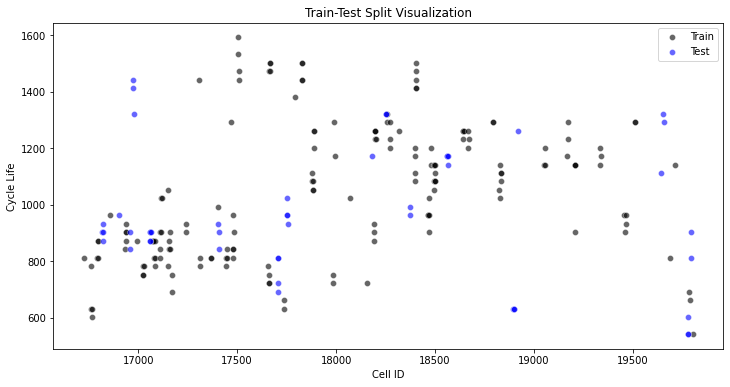

In [67]:
# Plotting the data
plt.figure(figsize=(12, 6))
plt.scatter(cell_ids_train, cycle_life_train, label='Train', color='black', alpha=0.6, edgecolor='w', linewidth=0.5)
plt.scatter(cell_ids_test, cycle_life_test, label='Test', color='blue', alpha=0.6, edgecolor='w', linewidth=0.5)
plt.xlabel('Cell ID')
plt.ylabel('Cycle Life')
plt.title('Train-Test Split Visualization')
plt.legend()
plt.show()

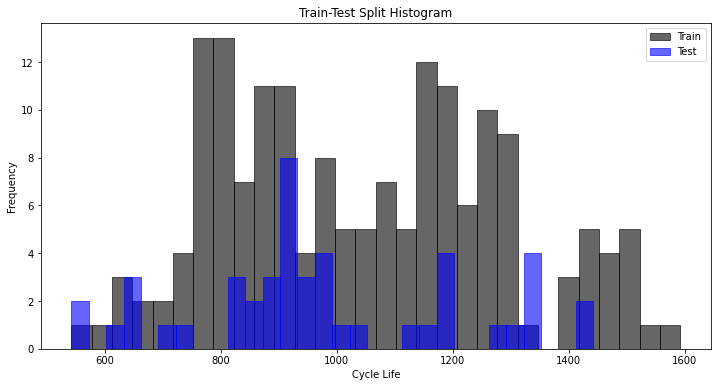

In [68]:
# Plotting the histograms
plt.figure(figsize=(12, 6))
plt.hist(cycle_life_train, bins=30, alpha=0.6, label='Train', color='black', edgecolor='black')
plt.hist(cycle_life_test, bins=30, alpha=0.6, label='Test', color='blue', edgecolor='blue')
plt.xlabel('Cycle Life')
plt.ylabel('Frequency')
plt.title('Train-Test Split Histogram')
plt.legend()
plt.show()

# Preprocessing & Advanced Feature Extraction

## Helper functions

### Common

In [69]:
threshold = 100 # mA

def cycle_sub_sequence(cycle_time_series_df):
    sub_seq_1 = pd.DataFrame()
    sub_seq_2 = pd.DataFrame()
    sub_seq_3 = pd.DataFrame()
    sub_seq_4 = pd.DataFrame()
    sub_seq_5 = pd.DataFrame()

    cell_ids = cycle_time_series_df['cell_id'].unique()
    for cell_id in cell_ids:
        cell_rows = cycle_time_series_df.loc[cycle_time_series_df['cell_id'] == cell_id]
        cell_curr_rows = cell_rows['test_cur']
        indicators = {}
        indicators['max_chg_curr'] = cell_curr_rows.max()
        indicators['max_dchg_curr'] = cell_curr_rows.min()
        indicators['max_chg_curr_idx'] = cell_curr_rows.idxmax()
        indicators['max_dchg_curr_idx'] = cell_curr_rows.idxmin()

        # sub_seq 1 prep
        max_chg_curr_idx = indicators['max_chg_curr_idx']
        max_chg_curr_threshold = indicators['max_chg_curr'] - threshold
        cell_rows_trimmed = cell_rows.loc[max_chg_curr_idx:]

        # get first index where current is lower than the max (within threshold)
        sub_seq_1_max_idx = cell_rows_trimmed.index[(cell_rows_trimmed['test_cur'] < max_chg_curr_threshold).argmax()]
        sub_seq_1_rows = cell_rows.loc[:sub_seq_1_max_idx - 1] # select only rows between indexes

        sub_seq_1 = pd.concat([sub_seq_1, sub_seq_1_rows])

        # sub_seq 2
        sub_seq_2_max_idx = cell_rows.index[(cell_rows['test_cur'] < threshold).argmax()]
        sub_seq_2_rows = cell_rows.loc[sub_seq_1_max_idx:sub_seq_2_max_idx - 1] # select only rows between indexes

        sub_seq_2 = pd.concat([sub_seq_2, sub_seq_2_rows])

         # sub_seq 3
        sub_seq_3_max_idx = cell_rows.index[(cell_rows['test_cur'] < -threshold).argmax()]
        sub_seq_3_rows = cell_rows.loc[sub_seq_2_max_idx:sub_seq_3_max_idx - 1] # select only rows between indexes

        sub_seq_3 = pd.concat([sub_seq_3, sub_seq_3_rows])

        # sub_seq 4 prep
        max_dchg_curr_idx = indicators['max_dchg_curr_idx']
        max_dchg_curr_threshold = indicators['max_dchg_curr'] + threshold
        cell_rows_trimmed = cell_rows.loc[max_dchg_curr_idx:]

        # get first index where current is lower than the max (within threshold)
        sub_seq_4_max_idx = cell_rows_trimmed.index[(cell_rows_trimmed['test_cur'] > max_dchg_curr_threshold).argmax()]
        sub_seq_4_rows = cell_rows.loc[sub_seq_3_max_idx:sub_seq_4_max_idx - 1] # select only rows between indexes

        sub_seq_4 = pd.concat([sub_seq_4, sub_seq_4_rows])

        # sub_seq 5
        sub_seq_5_rows = cell_rows.loc[sub_seq_4_max_idx:] # select only rows between indexes

        sub_seq_5 = pd.concat([sub_seq_5, sub_seq_5_rows])
        
    print(sub_seq_4)
    
    sub_sequences = [sub_seq_1, sub_seq_2, sub_seq_3, sub_seq_4, sub_seq_5]

    cell_ids_set = set(cell_ids)
    for idx, sub_sequence in enumerate(sub_sequences):
        sub_sequence_cell_ids = sub_sequence['cell_id'].unique()
        if sub_sequence_cell_ids.size < cell_ids.size:
            # print the missing cells, to be added as rotten cells
            print(f'seg_{idx+1} missing cell ids: {cell_ids_set - set(sub_sequence_cell_ids)}')

    return sub_sequences

In [70]:
def normalize_sub_sequence_time(sub_sequence):
    sub_sequence_trimmed = sub_sequence[['test_vol','test_cur','test_time','cell_id']].reset_index(drop=True)
    start_times = sub_sequence_trimmed[['cell_id', 'test_time']].groupby(['cell_id']).head(1)
    # print(start_times)
    norm_sub_sequence = sub_sequence_trimmed.copy()
    norm_sub_sequence['test_time_norm'] = np.nan
    for _, row in start_times.iterrows():
        cell_rows = norm_sub_sequence.loc[norm_sub_sequence['cell_id'] == row['cell_id']]
        norm_sub_sequence.loc[cell_rows.index, 'test_time_norm'] = cell_rows.apply(lambda x: x['test_time'] - row['test_time'], axis=1)
    
    # print(norm_sub_sequence)  
    return norm_sub_sequence

In [71]:
def check_rotten_cells_by_min_duration(norm_sub_sequence):
    min_duration = norm_sub_sequence.groupby('cell_id').tail(1)['test_time_norm'].min()
    min_durations = norm_sub_sequence.groupby('cell_id').tail(1)
    min_duration_cell_ids = min_durations.loc[min_durations['test_time_norm'] == min_duration]['cell_id']
    # print('min_duration:', min_duration)
    # print('min_duration cells:\n', min_duration_cell_ids)

    filtered_norm_sub_sequence = norm_sub_sequence.drop(norm_sub_sequence.loc[norm_sub_sequence['test_time_norm'] > min_duration].index, axis=0)
    trimmed_min_durations = filtered_norm_sub_sequence.groupby('cell_id').tail(1)
    # print(trimmed_min_durations[['cell_id','test_time_norm']])
    drop_candidates = trimmed_min_durations.loc[(trimmed_min_durations['test_time_norm'] % 1000) != 0][['cell_id', 'test_time_norm' ]]
    
    return drop_candidates

### Shapelets

In [72]:
# Revised shapelet transform
"""Code for Shapelet transform algorithm."""

from itertools import chain
from joblib import delayed, Parallel
from numba import njit, prange
from numba.typed import List
import numpy as np
from numpy.lib.stride_tricks import as_strided
from sklearn.base import BaseEstimator
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.utils.validation import (check_array, check_is_fitted,
                                      check_random_state, check_X_y)
# from ..base import UnivariateTransformerMixin
# from ..utils.utils import _windowed_view


@njit()
def _windowed_view(X, n_samples, n_timestamps, window_size, window_step):
    overlap = window_size - window_step
    shape_new = (n_samples,
                 (n_timestamps - overlap) // window_step,
                 window_size // 1)
    s0, s1 = X.strides
    strides_new = (s0, window_step * s1, s1)
    return as_strided(X, shape=shape_new, strides=strides_new)


@njit()
def _extract_all_shapelets(x, window_sizes, window_steps, n_timestamps):
    """Extract all the shapelets from a single time series."""
    shapelets = List()  # shapelets
    lengths = List()  # lengths of shapelets
    start_idx = List()  # start index of shapelets (included)
    end_idx = List()  # end index of shapelets (excluded)

    for window_size, window_step in zip(window_sizes, window_steps):
        # Derive the new shape and strides
        overlap = window_size - window_step
        shape_new = ((n_timestamps - overlap) // window_step, window_size // 1)
        strides = x.strides[0]
        strides_new = (window_step * strides, strides)

        # Derive strided view of x
        x_strided = as_strided(x, shape=shape_new, strides=strides_new)
        x_strided = np.copy(x_strided)

        # Add shapelets, lengths, start indices and end indices
        shapelets.append(x_strided)
        lengths.append([x_strided.shape[1]] * x_strided.shape[0])
        start_idx.append(np.arange(0, n_timestamps - window_size + 1,
                                   window_step))
        end_idx.append(np.arange(window_size, n_timestamps + 1, window_step))

    return shapelets, lengths, start_idx, end_idx


@njit()
def _derive_shapelet_distances(X, shapelet):
    """Derive the distance between a shapelet and all the time series."""
    n_samples, n_windows, _ = X.shape
    mean = np.empty((n_samples, n_windows))
    for i in prange(n_samples):
        for j in prange(n_windows):
            mean[i, j] = np.mean((X[i, j] - shapelet) ** 2)
            # mean[i, j] = np.mean.abs((X[i, j] - shapelet))
    dist = np.empty(n_samples)
    for i in prange(n_samples):
        dist[i] = np.min(mean[i])
    return dist


@njit()
def _derive_all_squared_distances_fit(
    X, n_samples, n_timestamps, start_idx, end_idx, shapelets, lengths
):
    """Derive the squared distances between all shapelets and time series."""
    distances = []  # save the distances in a list

    for i in prange(len(lengths)):
        window_size = lengths[i][0]
        # X_window = _windowed_view(X, n_samples, n_timestamps,
        #                           window_size, window_step=1)
        for j in prange(shapelets[i].shape[0]):
            X_window = _windowed_view(X[:, start_idx[i][j]:end_idx[i][j]], n_samples, 
                                      end_idx[i][j]-start_idx[i][j], end_idx[i][j]-start_idx[i][j], window_step=1)
            dist = _derive_shapelet_distances(X_window, shapelets[i][j])
            distances.append(dist)

    return distances


@njit()
def _derive_all_squared_distances_transform(
    X, n_samples, n_timestamps, window_sizes, start_idx, end_idx, shapelets, lengths
):
    """Derive the squared distances between all shapelets and time series."""
    distances = []  # save the distances in a list
    permutation = []  # save the permutation of the indices    
    
    for shapelet, window_size in zip(shapelets, window_sizes):
        indices = np.where(lengths == window_size)[0]
        permutation.append(indices)

        for idx in indices:
            X_window = _windowed_view(X[:, start_idx[idx]:end_idx[idx]], n_samples,
                                      end_idx[idx] - start_idx[idx], end_idx[idx] - start_idx[idx],
                                      window_step=1)
            dist = _derive_shapelet_distances(X_window, shapelets[idx])
            distances.append(dist)

    return distances, permutation


def _derive_all_distances(X, window_sizes, start_idx, end_idx, shapelets, lengths, fit):
    """Derive the distances between all the shapelets and the time series."""
    n_samples, n_timestamps = X.shape
    # print("start_idx[0]:", start_idx[0])
    # print("end_idx[0]:", end_idx[0])
    # print("X:", X[0])
    if fit:
        distances = _derive_all_squared_distances_fit(
            X, n_samples, n_timestamps, start_idx, end_idx, shapelets, lengths
        )
        return np.sqrt(np.asarray(distances)).T
        # return np.asarray(distances).T
    else:
        distances, permutation = _derive_all_squared_distances_transform(
            X, n_samples, n_timestamps, window_sizes, start_idx, end_idx, shapelets, lengths
        )
        # Compute the inverse permutation of the indices
        permutation = np.concatenate(permutation)
        inverse_perm = np.arange(permutation.size)[np.argsort(permutation)]

        return np.sqrt(np.asarray(distances))[inverse_perm].T
        # return np.asarray(distances)[inverse_perm].T


@njit()
def _remove_similar_shapelets(scores, start_idx, end_idx):
    """Remove self-similar shapelets."""

    kept_idx = []
    remaining_idx = np.full(scores.size, True)

    # Sort the indices by scores
    argsorted_scores = np.argsort(scores)
    sorted_start_idx = start_idx[argsorted_scores]
    sorted_end_idx = end_idx[argsorted_scores]

    # While there are non-similar shapelets remaining
    while np.any(remaining_idx):
        idx = argsorted_scores[remaining_idx][-1]  # Find the best shapelet
        kept_idx.append(idx)

        start, end = start_idx[idx], end_idx[idx]  # Find start and end indices

        # Find non-similar shapelets
        remaining_idx = np.logical_and(
            np.logical_or(sorted_start_idx >= end, sorted_end_idx <= start),
            remaining_idx
        )

    return np.array(kept_idx)


class ShapeletTransformRevised(BaseEstimator):
# class ShapeletTransformRevised(BaseEstimator, UnivariateTransformerMixin):
    """Shapelet Transform Algorithm.

    The Shapelet Transform algorithm extracts the most discriminative
    shapelets from a data set of time series. A shapelet is defined as
    a subset of consecutive points from a time series. Two criteria are
    made available: mutual information and F-scores.

    Parameters
    ----------
    n_shapelets : int or 'auto' (default = 'auto')
        The number of shapelets to keep. If 'auto', `n_timestamps // 2`
        shapelets are considered, where `n_timestamps` is the number of
        time points in the dataset. Note that there might be a smaller
        number of shapelets if fewer than ``n_shapelets`` shapelets have been
        extracted during the search.

    criterion : 'mutual_info' or 'anova' (default = 'mutual_info')
        Criterion to perform the selection of the shapelets.
        'mutual_info' uses the mutual information, while 'anova' use
        the ANOVA F-value.

    window_sizes : array-like or 'auto '(default = 'auto')
        Size of the sliding windows. If 'auto', the range for the
        window sizes is determined automatically.
        Otherwise, all the elements must be either integers or floats.
        In the latter case, each element represents the percentage
        of the size of each time series and must be between 0 and 1; the size
        of the sliding windows will be computed as
        ``np.ceil(window_sizes * n_timestamps)``.

    window_steps : None or array-like (default = None)
        Step of the sliding windows. If None, each ``window_step`` is equal
        to 1. Otherwise, all the elements must be either integers or floats.
        In the latter case, each element represents the percentage of the size
        of each time series and must be between 0 and 1; the step of the
        sliding windows will be computed as
        ``np.ceil(window_steps * n_timestamps)``.
        Must be None if ``window_sizes='auto'``.

    remove_similar : bool (default = True)
        If True, self-similar shapelets are removed, keeping only
        the non-self-similar shapelets with the highest scores. Two
        shapelets are considered to be self-similar if they are
        taken from the the same time series and have at least one
        overlapping index.

    sort : bool (default = False)
        If True, shapelets are sorted in descending order according to
        their associated scores. If False, the order is undefined.

    verbose : int (default = 0)
        Verbosity level when fitting: if non zero, progress messages are
        printed. Above 50, the output is sent to stdout.
        The frequency of the messages increases with the verbosity level.

    random_state : int, RandomState instance or None (default = None)
        If int, random_state is the seed used by the random number generator;
        If RandomState instance, random_state is the random number generator;
        If None, the random number generator is the RandomState instance used
        by ``np.random``. Only used if ``window_sizes='auto'`` in order to
        subsample the dataset to find the best range or if
        ``criterion=='mutual_info'`` to add small noise to the data.

    n_jobs : None or int (default = None)
        The number of jobs to run in parallel for ``fit``.
        If -1, then the number of jobs is set to the number of cores.

    Attributes
    ----------
    shapelets_ : array, shape = (n_shapelets,)
        The array with the selected shapelets.

    indices_ : array, shape = (n_shapelets, 3)
        The indices for the corresponding shapelets in the training set.
        The first column consists of the indices of the samples.
        The second column consists of the starting indices (included)
        of the shapelets. The third column consists of the ending indices
        (excluded) of the shapelets.

    scores_ : array, shape = (n_shapelets,)
        The scores associated to the shapelets. The higher, the more
        discriminant.
        If ``criterion='mutual_info'``, mutual information scores are reported.
        If ``criterion='anova'``, F-scores are reported.

    window_range_ : None or tuple
        Range of the window sizes if ``window_sizes='auto'``. None otherwise.

    References
    ----------
    .. [1] J. Lines, L. M. Davis, J. Hills and A. Bagnall, "A Shapelet
           Transform for Time Series Classification". Data Mining and Knowledge
           Discovery, 289-297 (2012).

    Examples
    --------
    >>> from pyts.transformation import ShapeletTransform
    >>> X = [[0, 2, 3, 4, 3, 2, 1],
    ...      [0, 1, 3, 4, 3, 4, 5],
    ...      [2, 1, 0, 2, 1, 5, 4],
    ...      [1, 2, 2, 1, 0, 3, 5]]
    >>> y = [0, 0, 1, 1]
    >>> st = ShapeletTransform(n_shapelets=2, window_sizes=[3])
    >>> st.fit(X, y)
    ShapeletTransform(...)
    >>> len(st.shapelets_)
    2
    >>> st.indices_.shape
    (2, 3)

    """

    def __init__(self, n_shapelets='auto', criterion='mutual_info',
                 window_sizes='auto', window_steps=None,
                 remove_similar=True, sort=False, verbose=0, random_state=None,
                 n_jobs=None):
        self.n_shapelets = n_shapelets
        self.criterion = criterion
        self.window_sizes = window_sizes
        self.window_steps = window_steps
        self.remove_similar = remove_similar
        self.sort = sort
        self.verbose = verbose
        self.random_state = random_state
        self.n_jobs = n_jobs


    def fit(self, X, y):
        """Fit the model according to the given training data.

        It finds the ``n_shapelets`` best shapelets in the training set.

        Parameters
        ----------
        X : array-like, shape = (n_samples, n_timestamps)
            Univariate time series.

        y : array-like, shape = (n_samples,)
            Class labels for each data sample.

        Returns
        -------
        self : object

        """
        X, y = check_X_y(X, y, dtype='float64')
        (n_shapelets, window_sizes,
         window_steps, n_jobs, rng) = self._check_params(X, y)

        X_new, scores, shapelets, indices = self._fit(
            X, y, n_shapelets, window_sizes, window_steps,
            self.remove_similar, n_jobs, rng
        )

        if self.sort:
            idx_sorted = np.argsort(scores)[::-1]
            self.scores_ = scores[idx_sorted]
            self.shapelets_ = shapelets[idx_sorted]
            self.indices_ = indices[idx_sorted]
        else:
            self.scores_ = scores
            self.shapelets_ = shapelets
            self.indices_ = indices

        return self


    def transform(self, X):
        """Transform the provided data.

        It computes the distances between the selected shapelets
        and the samples.

        Parameters
        ----------
        X : array-like, shape = (n_samples, n_timestamps)
            Univariate time series.

        Returns
        -------
        X_new : array, shape = (n_samples, n_shapelets)
            Distances between the selected shapelets and the samples.

        """
        check_is_fitted(self, ['shapelets_', 'indices_', 'scores_'])
        X = check_array(X, dtype='float64')
        return self._transform(X)


    def fit_transform(self, X, y):
        """Fit the model than transform the given training data.

        It finds the ``n_shapelets`` best shapelets in the training set
        and computes the distances between them and the training set.

        Parameters
        ----------
        X : array-like, shape = (n_samples, n_timestamps)
            Univariate time series.

        y : array-like, shape = (n_samples,)
            Class labels for each data sample.

        Returns
        -------
        X_new : array, shape = (n_samples, n_shapelets)
            Distances between the selected shapelets and the samples.

        """
        X, y = check_X_y(X, y, dtype='float64')
        (n_shapelets, window_sizes, window_steps,
         n_jobs, rng) = self._check_params(X, y)

        X_new, scores, shapelets, indices = self._fit(
            X, y, n_shapelets, window_sizes, window_steps,
            self.remove_similar, n_jobs, rng
        )

        if self.sort:
            idx_sorted = np.argsort(scores)[::-1]
            self.scores_ = scores[idx_sorted]
            self.shapelets_ = shapelets[idx_sorted]
            self.indices_ = indices[idx_sorted]
            X_new = X_new[:, idx_sorted]
        else:
            self.scores_ = scores
            self.shapelets_ = shapelets
            self.indices_ = indices
        return X_new


    def _check_params(self, X, y):
        n_timestamps = X.shape[1]

        # Checking for 'n_shapelets'
        n_shapelets_int = isinstance(self.n_shapelets, (int, np.integer))
        if not (self.n_shapelets == 'auto' or n_shapelets_int):
            raise TypeError("'n_shapelets' must be 'auto' or an integer.")
        if (n_shapelets_int and not self.n_shapelets > 0):
            raise ValueError("If 'n_shapelets' is an integer, it must be a "
                             "positive integer (got {})."
                             .format(self.n_shapelets))

        # Checking for 'criterion'
        if self.criterion not in ('mutual_info', 'anova'):
            raise ValueError("'criterion' must be either 'mutual_info' or "
                             "'anova' (got {}).".format(self.criterion))

        # Checking for 'window_sizes'
        window_sizes_auto = (isinstance(self.window_sizes, str) and
                             self.window_sizes == 'auto')
        window_sizes_array = isinstance(self.window_sizes,
                                        (list, tuple, np.ndarray))
        if not (window_sizes_auto or window_sizes_array):
            raise TypeError("'window_sizes' must be 'auto', a list, a tuple "
                            "or a numpy.ndarray.")
        if window_sizes_array:
            window_sizes = np.asarray(self.window_sizes)
            if window_sizes.ndim != 1:
                raise ValueError("'window_sizes' must be one-dimensional.")
            if not issubclass(window_sizes.dtype.type,
                              (np.integer, np.floating)):
                raise ValueError("The elements of 'window_sizes' must be "
                                 "integers or floats.")
            if issubclass(window_sizes.dtype.type, np.floating):
                if not (np.min(window_sizes) > 0 and
                        np.max(window_sizes) <= 1):
                    raise ValueError(
                        "If the elements of 'window_sizes' are floats, they "
                        "all must be greater than 0 and lower than or equal "
                        "to 1."
                    )
                window_sizes = np.ceil(
                    window_sizes * n_timestamps).astype('int64')
            else:
                if not (np.min(window_sizes) > 0 and
                        np.max(window_sizes) <= n_timestamps):
                    raise ValueError(
                        "If the elements of 'window_sizes' are integers, they "
                        "all must be greater than 0 and lower than or equal "
                        "to n_timestamps."
                    )

        # Checking for 'window_steps'
        if not ((self.window_steps is None)
                or isinstance(self.window_steps, (list, tuple, np.ndarray))):
            raise TypeError("'window_steps' must be None or array-like.")
        if self.window_steps is not None:
            if window_sizes_auto:
                raise ValueError(
                    "'window_steps' must be None if window_sizes='auto'."
                )
            window_steps = np.asarray(self.window_steps)
            if window_steps.ndim != 1:
                raise ValueError("'window_steps' must be one-dimensional.")
            if window_steps.size != window_sizes.size:
                raise ValueError("If 'window_steps' is not None, it must have "
                                 "the same size as 'window_sizes'.")
            if not issubclass(window_steps.dtype.type,
                              (np.integer, np.floating)):
                raise ValueError(
                    "If 'window_steps' is not None, the elements of "
                    "'window_steps' must be integers or floats."
                )
            if issubclass(window_steps.dtype.type, np.floating):
                if not ((np.min(window_steps) > 0
                         and np.max(window_steps) <= 1)):
                    raise ValueError(
                        "If the elements of 'window_steps' are floats, they "
                        "all must be greater than 0 and lower than or equal "
                        "to 1."
                    )
                window_steps = np.ceil(
                    window_steps * n_timestamps).astype('int64')
            else:
                if not ((np.min(window_steps) > 0)
                        and (np.max(window_steps) <= n_timestamps)):
                    raise ValueError(
                        "If the elements of 'window_steps' are integers, they "
                        "all must be greater than 0 and lower than or equal "
                        "to n_timestamps."
                    )

        # Checking for 'verbose'
        if not (isinstance(self.verbose, (int, np.integer))
                and self.verbose >= 0):
            raise ValueError("'verbose' must be a positive integer (got {})."
                             .format(self.verbose))

        # Checking for 'n_jobs'
        if not (self.n_jobs is None or isinstance(self.n_jobs, int)):
            raise TypeError("'n_jobs' must be None or an integer.")

        # Derive 'n_jobs' and 'random_state'
        n_jobs = 1 if self.n_jobs is None else self.n_jobs
        rng = check_random_state(self.random_state)

        # Derive parameter values for 'auto' cases
        if self.n_shapelets == 'auto':
            n_shapelets = X.shape[1] // 2
        else:
            n_shapelets = self.n_shapelets

        if isinstance(self.window_sizes, str):
            if self.window_sizes == 'auto':
                window_sizes = self._auto_length_computation(X, y, rng, n_jobs)
                self.window_range_ = (window_sizes[0], window_sizes[-1])
        else:
            self.window_range_ = None

        if self.window_steps is None:
            window_steps = np.ones_like(window_sizes)

        return n_shapelets, window_sizes, window_steps, n_jobs, rng

    def _fit_one_time_series(
        self, x, X, y, n_timestamps, n_shapelets, window_sizes,
        window_steps, remove_similar, i, rng
    ):
        """Fit one time series."""
        # Extract all shapelets
        shapelets, lengths, start_idx, end_idx = _extract_all_shapelets(
            x, window_sizes, window_steps, n_timestamps)

        # Derive distances between shapelets and time series
        X_dist = _derive_all_distances(X, window_sizes, start_idx, end_idx, shapelets, lengths, fit=True)

        if self.criterion == 'mutual_info':
            scores = mutual_info_classif(X_dist, y, discrete_features=False,
                                         random_state=rng)
        else:
            scores, _ = f_classif(X_dist, y)

        # Flatten the list of 2D arrays into an array of 1D arrays
        shapelets = [list(shapelet) for shapelet in shapelets]
        shapelets = np.asarray(list(chain.from_iterable(shapelets)),
                               dtype='object')

        # Concatenate the list/tuple of 1D arrays into one 1D array
        start_idx = np.concatenate(start_idx)
        end_idx = np.concatenate(end_idx)

        # Remove similar shapelets
        if remove_similar:
            idx = _remove_similar_shapelets(scores.copy(), start_idx, end_idx)
            scores = scores[idx]
            shapelets = shapelets[idx]
            start_idx = start_idx[idx]
            end_idx = end_idx[idx]
            X_dist = X_dist[:, idx]

        # Keep at most 'n_shapelets'
        if scores.size > n_shapelets - 1:
            idx = np.argpartition(
                scores, scores.size - n_shapelets)[-n_shapelets:]
            scores = scores[idx]
            shapelets = shapelets[idx]
            start_idx = start_idx[idx]
            end_idx = end_idx[idx]
            X_dist = X_dist[:, idx]

        time_series_idx = np.full(scores.size, i)
        return X_dist, scores, shapelets, start_idx, end_idx, time_series_idx

    def _fit(self, X, y, n_shapelets, window_sizes, window_steps,
             remove_similar, n_jobs, rng):
        """Fit all the time series"""
        n_samples, n_timestamps = X.shape

        res = Parallel(n_jobs=n_jobs, verbose=self.verbose)(
            delayed(self._fit_one_time_series)(
                X[i], X, y, n_timestamps, n_shapelets, window_sizes,
                window_steps, remove_similar, i, rng
            )
            for i in range(n_samples))

        (X_dist, scores, shapelets,
         start_idx, end_idx, time_series_idx) = zip(*res)

        # Concatenate the results
        X_dist = np.hstack(X_dist)
        scores = np.concatenate(scores)
        shapelets = np.concatenate(shapelets)
        if shapelets.ndim > 1:
            shapelets = shapelets.astype('float64')
        start_idx = np.concatenate(start_idx)
        end_idx = np.concatenate(end_idx)
        time_series_idx = np.concatenate(time_series_idx)

        # Keep at most 'n_shapelets'
        if scores.size > n_shapelets - 1:
            idx = np.argpartition(
                scores, scores.size - n_shapelets)[-n_shapelets:]
            X_dist = X_dist[:, idx]
            scores = scores[idx]
            shapelets = shapelets[idx]
            start_idx = start_idx[idx]
            end_idx = end_idx[idx]
            time_series_idx = time_series_idx[idx]

        # Derive the 'indices' attributes
        indices = np.empty((scores.size, 3), dtype='int64')
        indices[:, 0] = time_series_idx
        indices[:, 1] = start_idx
        indices[:, 2] = end_idx

        return X_dist, scores, shapelets, indices

    def _transform(self, X):
        lengths = self.indices_[:, 2] - self.indices_[:, 1]
        window_sizes = np.unique(lengths)

        # Convert the array of arrays of shapelets to a numba.typed.List object
        shapelets_list = List()
        for x in self.shapelets_:
            shapelets_list.append(x.astype('float64'))

        start_idx = List()
        end_idx = List()
        for _, start, end in self.indices_:
            start_idx.append(start)
            end_idx.append(end)

        X_new = _derive_all_distances(
            X, window_sizes, start_idx, end_idx, shapelets_list, lengths, fit=False)
        return X_new

    def _auto_length_computation(self, X, y, rng, n_jobs):
        """Derive the window sizes automatically."""
        n_samples, n_timestamps = X.shape
        window_sizes = np.arange(1, n_timestamps + 1)
        window_steps = np.ones_like(window_sizes)

        if n_samples > 10:
            shapelet_lengths = []
            for i in range(10):
                idx = rng.choice(n_samples, size=10, replace=False)
                X_small, y_small = X[idx], y[idx]
                _, _, shapelets, _ = self._fit(
                    X_small, y_small, 10, window_sizes, window_steps,
                    self.remove_similar, n_jobs, rng
                )
                shapelet_lengths.extend(
                    [len(shapelet) for shapelet in shapelets])

            window_range = np.percentile(
                shapelet_lengths, [25, 75], method='lower'
            ).astype('int64')
            window_sizes = np.arange(window_range[0], window_range[1] + 1)

        else:
            _, _, shapelets, _ = self._fit(
                X, y, 100, window_sizes, window_steps,
                self.remove_similar, n_jobs, rng
            )
            shapelet_lengths = [len(shapelet) for shapelet in shapelets]
            window_range = np.percentile(
                shapelet_lengths, [25, 75], method='lower'
            ).astype('int64')
            window_sizes = np.arange(window_range[0], window_range[1] + 1)

        return window_sizes

In [73]:
def pivot_sub_sequence(norm_sub_sequence, sub_sequence_measured_param_label):
    min_duration = norm_sub_sequence.groupby('cell_id').tail(1)['test_time_norm'].min()    
    filtered_norm_sub_sequence = norm_sub_sequence.drop(norm_sub_sequence.loc[norm_sub_sequence['test_time_norm'] > min_duration].index, axis=0)
    # print(filtered_norm_sub_sequence.groupby('cell_id').tail(1)['test_time_norm'])
    # print(filtered_norm_sub_sequence.isna().sum())

    filtered_norm_sub_sequence_pivot = filtered_norm_sub_sequence.pivot_table(index='cell_id', columns='test_time_norm', values=[sub_sequence_measured_param_label])

    # with pd.option_context('display.max_rows', None):  # more options can be specified also
        # print(filtered_norm_sub_sequence_pivot.iloc[:,-5:])

    filtered_norm_sub_sequence_pivot = filtered_norm_sub_sequence_pivot.dropna(axis=1)

    # for i in (16726 , 19801):
    #     plt.plot(filtered_norm_sub_sequence_pivot.loc[i][sub_sequence_measured_param_label])
    #     plt.ylabel(sub_sequence_measured_param_label)
    # plt.show()

    return filtered_norm_sub_sequence_pivot

In [74]:
def shapelets_transform(pivoted_sub_sequence, cycle_num, sub_sequence_num):
    shapelet_features_df = pd.DataFrame(index=pivoted_sub_sequence.index)
    # print(pivoted_sub_sequence.shape)
    sub_sequence_time_samples = pivoted_sub_sequence.shape[1]

    X_shapelets = pivoted_sub_sequence
    y_shapelets = master_table['class']

    X_shapelets_train_prep = X_shapelets.loc[cell_ids_train]
    X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()

    y_shapelets_train = y_shapelets.loc[cell_ids_train]

    # print(X_shapelets_train.shape, y_shapelets_train.shape)

    st = ShapeletTransform(
        window_sizes=[round(sub_sequence_time_samples/8), round(sub_sequence_time_samples/4), round(sub_sequence_time_samples/2)],
        window_steps=[round(sub_sequence_time_samples/16),round(sub_sequence_time_samples/16), round(sub_sequence_time_samples/16)],
        random_state=1, n_shapelets=10, sort=True
    )

    shapelet_features_train = st.fit_transform(X_shapelets_train, y_shapelets_train)

#     print(shapelet_features_train)
#     print(shapelet_features_train.shape)

    plt.figure(figsize=(10, 10))
    for i, index in enumerate(st.indices_[:5]):
        idx, start, end = index
        plt.plot(X_shapelets_train[idx], color='C{}'.format(i), label='Sample {}'.format(idx))
        plt.plot(np.arange(start, end), X_shapelets_train[idx, start:end], lw=5, color='C{}'.format(i))

    plt.xlabel('Time Samples', fontsize=12)
    plt.ylabel('Voltage', fontsize=12)
    plt.title('The 5 most discriminative shapelets', fontsize=14)
    plt.legend(loc='best', fontsize=8)
    plt.show()

    X_shapelets_test_prep = X_shapelets.loc[cell_ids_test]
    X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
    shapelet_features_test = st.transform(X_shapelets_test)

    shapelets_features_column = pd.concat([
        pd.Series(data=list(shapelet_features_train), index=X_shapelets_train_prep.index.values),
        pd.Series(data=list(shapelet_features_test), index=X_shapelets_test_prep.index.values)
    ])
    # shapelet_features_df["shapelets_{}_sub_sequence_{}".format(cycle_num, sub_sequence_num)] = shapelets_features_column
    
    shapelets_array = np.array([row for row in shapelets_features_column.values])
    for i in range(shapelets_array.shape[-1]):
        shapelets_column = pd.Series(
            data=shapelets_array[:,i],
            index=pivoted_sub_sequence.index.values,
            name="std_shapelets_{}_sub_sequence_{}_{}".format(cycle_num, sub_sequence_num, i)
        )
        shapelet_features_df = shapelet_features_df.join(shapelets_column)
    
    # print(shapelet_features_df)
    return shapelet_features_df

In [75]:
def revised_shapelets_transform(pivoted_sub_sequence, cycle_num, sub_sequence_num):
    shapelet_features_df = pd.DataFrame(index=pivoted_sub_sequence.index)
    # print(pivoted_sub_sequence.shape)
    sub_sequence_time_samples = pivoted_sub_sequence.shape[1]

    X_shapelets = pivoted_sub_sequence
    y_shapelets = master_table['class']

    X_shapelets_train_prep = X_shapelets.loc[cell_ids_train]
    X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()

    y_shapelets_train = y_shapelets.loc[cell_ids_train]

    # print(X_shapelets_train.shape, y_shapelets_train.shape)
    
    st = ShapeletTransformRevised(
            window_sizes=[round(sub_sequence_time_samples/8), round(sub_sequence_time_samples/4), round(sub_sequence_time_samples/2)],
            window_steps=[round(sub_sequence_time_samples/16), round(sub_sequence_time_samples/16), round(sub_sequence_time_samples/16)],
            random_state=1, n_shapelets=10, sort=True
        )

    shapelet_features_train = st.fit_transform(X_shapelets_train, y_shapelets_train)

    # print(shapelet_features_train)
    # print(shapelet_features_train.shape)

    plt.figure(figsize=(10, 10))
    for i, index in enumerate(st.indices_[:5]):
        idx, start, end = index
        plt.plot(X_shapelets_train[idx], color='C{}'.format(i), label='Sample {}'.format(idx))
        plt.plot(np.arange(start, end), X_shapelets_train[idx, start:end], lw=5, color='C{}'.format(i))

    plt.xlabel('Time Samples', fontsize=12)
    plt.ylabel('Voltage', fontsize=12)
    plt.title('The 5 most discriminative shapelets', fontsize=14)
    plt.legend(loc='best', fontsize=8)
    plt.show()

    X_shapelets_test_prep = X_shapelets.loc[cell_ids_test]
    X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
    shapelet_features_test = st.transform(X_shapelets_test)

    shapelets_features_column = pd.concat([
        pd.Series(data=list(shapelet_features_train), index=X_shapelets_train_prep.index.values),
        pd.Series(data=list(shapelet_features_test), index=X_shapelets_test_prep.index.values)
    ])
    # shapelet_features_df["shapelets_{}_sub_sequence_{}".format(cycle_num, sub_sequence_num)] = shapelets_features_column
    
    shapelets_array = np.array([row for row in shapelets_features_column.values])
    for i in range(shapelets_array.shape[-1]):
        shapelets_column = pd.Series(
            data=shapelets_array[:,i],
            index=pivoted_sub_sequence.index.values,
            name="revised_shapelets_{}_sub_sequence_{}_{}".format(cycle_num, sub_sequence_num, i)
        )
        shapelet_features_df = shapelet_features_df.join(shapelets_column)
    
    # print(shapelet_features_df)
    return shapelet_features_df

In [76]:
sub_sequence_measured_param_labels = [
    'test_vol', 
    'test_cur', 
    'test_vol', 
    'test_vol', 
    'test_vol'
]

def extract_shapelets_features(sub_sequences_dfs, cycle_num):    
    shapelets_features = pd.DataFrame(index=cell_ids)
    
    for sub_sequence_num, (sub_sequence, sub_sequence_measured_param_label) in enumerate(zip(sub_sequences_dfs, sub_sequence_measured_param_labels), start=1):
        pivoted_sub_sequence = pivot_sub_sequence(sub_sequence, sub_sequence_measured_param_label)
        sub_sequence_shapelets_features = shapelets_transform(pivoted_sub_sequence, cycle_num, sub_sequence_num)
        
        shapelets_features = shapelets_features.join(sub_sequence_shapelets_features)
        
    return shapelets_features

In [77]:
sub_sequence_measured_param_labels = [
    'test_vol', 
    'test_cur', 
    'test_vol', 
    'test_vol', 
    'test_vol'
]

def extract_revised_shapelets_features(sub_sequences_dfs, cycle_num):    
    shapelets_features = pd.DataFrame(index=cell_ids)
    
    for sub_sequence_num, (sub_sequence, sub_sequence_measured_param_label) in enumerate(zip(sub_sequences_dfs, sub_sequence_measured_param_labels), start=1):
        pivoted_sub_sequence = pivot_sub_sequence(sub_sequence, sub_sequence_measured_param_label)
        sub_sequence_shapelets_features = revised_shapelets_transform(pivoted_sub_sequence, cycle_num, sub_sequence_num)
        
        shapelets_features = shapelets_features.join(sub_sequence_shapelets_features)
        
    return shapelets_features

### Delta Q

In [78]:
def calc_average_current(norm_sub_sequence):
    avg_cur_df = pd.DataFrame()
    avg_cur_df['cell_id'] = norm_sub_sequence['cell_id'].unique()
    avg_cur_df['avg_cur'] = np.nan
    for _, row in avg_cur_df.iterrows():
        cell_rows = norm_sub_sequence.loc[norm_sub_sequence['cell_id'] == row['cell_id']]
        cell_avg_cur = cell_rows['test_cur'].mean()
        avg_cur_df.loc[avg_cur_df['cell_id']== row['cell_id'], 'avg_cur'] = cell_avg_cur
        
    # print(avg_cur_df)
    return avg_cur_df

In [79]:
def calc_capacity(norm_sub_sequence, avg_cur_df):
    norm_sub_sequence_w_cap = norm_sub_sequence.copy()
    norm_sub_sequence_w_cap['capacity'] = np.nan
    for _, row in avg_cur_df.iterrows():
        cell_rows = norm_sub_sequence_w_cap.loc[norm_sub_sequence_w_cap['cell_id'] == row['cell_id']]
        norm_sub_sequence_w_cap.loc[cell_rows.index, 'capacity'] = cell_rows.apply(lambda x: abs(x['test_time_norm'] / 1000 / 3600 * row['avg_cur']), axis=1)

    # print(norm_sub_sequence_w_cap)
    return norm_sub_sequence_w_cap

In [80]:
def identify_voltage_jumps(norm_sub_sequence, ignor_points, threshold):
    
    problematic_cells = []
    norm_sub_sequence_w_cap = calc_capacity(norm_sub_sequence, calc_average_current(norm_sub_sequence))

    for cell_id in norm_sub_sequence['cell_id'].unique():
        cell_data = norm_sub_sequence_w_cap[norm_sub_sequence_w_cap['cell_id'] == cell_id]

        # Ignore the first x points before calculating the voltage differences
        cell_data = cell_data.iloc[ignor_points:]
        voltage_diff = cell_data['test_vol'].diff().abs()

        # Find indices where the voltage difference exceeds the threshold
        jump_indices = voltage_diff[voltage_diff > threshold].index

        if not jump_indices.empty:
            print(f"Cell ID {cell_id} has potential voltage jumps at indices {jump_indices.tolist()}")
            problematic_cells.append(cell_id)

            # plot the identified jump for further inspection
            plt.figure(figsize=(8, 6))
            plt.plot(cell_data['capacity'], cell_data['test_vol'], '-o', label=f'Cell ID {cell_id}')
            plt.scatter(cell_data.loc[jump_indices, 'capacity'], cell_data.loc[jump_indices, 'test_vol'],
                        color='red', label='Identified Jumps', zorder=5)
            plt.xlabel('Capacity (mAh)')
            plt.ylabel('Voltage (V)')
            plt.title(f'Voltage vs. Capacity with Jumps for Cell ID {cell_id}')
            plt.grid(True)
            plt.legend()
            plt.show()

    return problematic_cells

In [81]:
def analyze_voltage_jumps(norm_sub_sequence, problematic_cells, ignor_points, threshold, window):

    norm_sub_sequence_w_cap = calc_capacity(norm_sub_sequence, calc_average_current(norm_sub_sequence))

    for cell_id in problematic_cells:
        cell_data = norm_sub_sequence_w_cap[norm_sub_sequence_w_cap['cell_id'] == cell_id]
        cell_data = cell_data.iloc[ignor_points:]
        voltage_diff = cell_data['test_vol'].diff().abs()

        # Find indices where the voltage difference exceeds the threshold
        jump_indices = voltage_diff[voltage_diff > threshold].index

        if not jump_indices.empty:
            for jump_index in jump_indices:
                # Define a window around the jump to inspect
                start_index = max(jump_index - window, cell_data.index.min())
                end_index = min(jump_index + window, cell_data.index.max())

                jump_region_data = cell_data.loc[start_index:end_index]

                # Print details of the region for analysis
                print(f"Zoomed-in view around jump for Cell ID {cell_id}, Index {jump_index}:")
                print(jump_region_data[['test_vol', 'capacity']])

                # Plot the zoomed-in region
                plt.figure(figsize=(8, 6))
                plt.plot(jump_region_data['capacity'], jump_region_data['test_vol'], '-o', label=f'Cell ID {cell_id}')
                plt.axvline(jump_region_data.loc[jump_index, 'capacity'], color='red', linestyle='--', label='Jump Point')
                plt.xlabel('Capacity (mAh)')
                plt.ylabel('Voltage (V)')
                plt.title(f'Voltage vs. Capacity Zoomed-In Around Jump for Cell ID {cell_id}')
                plt.grid(True)
                plt.legend()
                plt.show()

    return

In [82]:
def smooth_voltage_jumps(norm_sub_sequence_w_cap, problematic_cells, ignor_points, threshold, points_before, points_after):
  
    for cell_id in problematic_cells:
        cell_data = norm_sub_sequence_w_cap[norm_sub_sequence_w_cap['cell_id'] == cell_id].copy()
        cell_data = cell_data.iloc[ignor_points:]
        voltage_diff = cell_data['test_vol'].diff().abs()

        # Find indices where the voltage difference exceeds the threshold
        jump_indices = voltage_diff[voltage_diff > threshold].index

        if not jump_indices.empty:
            for jump_index in jump_indices:
                # Define the start and end of the interpolation range
                start_index = max(jump_index - points_before, cell_data.index.min())
                end_index = min(jump_index + points_after, cell_data.index.max())

                if start_index < end_index:
                    start_vol = cell_data.loc[start_index, 'test_vol']
                    end_vol = cell_data.loc[end_index, 'test_vol']

                    # Create a linearly interpolated voltage between the two points
                    interpolated_vol = np.linspace(start_vol, end_vol, end_index - start_index + 1)

                    # Update the smoothed data back to the main DataFrame using the actual indices
                    norm_sub_sequence_w_cap.loc[start_index:end_index, 'test_vol'] = interpolated_vol

    return norm_sub_sequence_w_cap

In [83]:
def interpulate_voltage_to_capacity(norm_sub_sequence_w_cap, avg_cur_df):
    interp_volt_cap = pd.DataFrame()
    for _, row in avg_cur_df.iterrows():
        cell_rows = norm_sub_sequence_w_cap.loc[norm_sub_sequence_w_cap['cell_id'] == row['cell_id']]
        x = cell_rows['test_vol'].iloc[::-1]
        y = cell_rows['capacity'].iloc[::-1]
        data = list(zip(x, y))
        # Convert the list of tuples to a set to remove duplicates based on x
        unique_x_data = {xy[0]: xy[1] for xy in data}
        # Separate the sorted tuples back into x and y arrays
        x, y = zip(*sorted(unique_x_data.items()))
        # Now you can use InterpolatedUnivariateSpline with the cleaned data
        ius = InterpolatedUnivariateSpline(x, y)
        xi = np.linspace(4.1, 2.5, 1000)
        yi = ius(xi)
        cell_interp_volt_cap = pd.DataFrame.from_dict({'test_vol': xi})
        cell_interp_volt_cap['capacity'] = yi
        cell_interp_volt_cap['cell_id'] = row['cell_id']
        # print(cell_interp_volt_cap)
        interp_volt_cap = pd.concat([interp_volt_cap, cell_interp_volt_cap])
        
    return interp_volt_cap

In [84]:
def interpulate_voltage_to_chg_capacity(norm_sub_sequence_w_cap, avg_cur_df):
    interp_volt_cap = pd.DataFrame()
    for _, row in avg_cur_df.iterrows():
        cell_rows = norm_sub_sequence_w_cap.loc[norm_sub_sequence_w_cap['cell_id'] == row['cell_id']]
        x = cell_rows['test_vol'].iloc[::-1]
        y = cell_rows['capacity'].iloc[::-1]
        data = list(zip(x, y))
        # Convert the list of tuples to a set to remove duplicates based on x
        unique_x_data = {xy[0]: xy[1] for xy in data}
        # Separate the sorted tuples back into x and y arrays
        x, y = zip(*sorted(unique_x_data.items()))
        # Now you can use InterpolatedUnivariateSpline with the cleaned data
        ius = InterpolatedUnivariateSpline(x, y)
        xi = np.linspace(2.8, 4.19, 1000)
        yi = ius(xi)
        cell_interp_volt_cap = pd.DataFrame.from_dict({'test_vol': xi})
        cell_interp_volt_cap['capacity'] = yi
        cell_interp_volt_cap['cell_id'] = row['cell_id']
        # print(cell_interp_volt_cap)
        interp_volt_cap = pd.concat([interp_volt_cap, cell_interp_volt_cap])
        
    return interp_volt_cap

In [85]:
def create_voltage_to_capacity_df(norm_sub_sequence):
    # Step 1: Calculate average current
    avg_cur_df = calc_average_current(norm_sub_sequence)
    
    # Step 2: Calculate capacity
    norm_sub_sequence_w_cap = calc_capacity(norm_sub_sequence, avg_cur_df)

    # Step 3: Identify cells with voltage jumps
    print("Identifying voltage jumps in cells...")
    problematic_cells = identify_voltage_jumps(norm_sub_sequence_w_cap, ignor_points=10, threshold=0.02)
    print(f"Cells with identified voltage jumps: {problematic_cells}")

    # Select a subset of cells for analysis (e.g., first 3)
    selected_cells = problematic_cells[:3]
    print(f"Selected cells for detailed analysis: {selected_cells}")

    # Step 4: Analyze and plot jumps before smoothing for the selected cells
    print("Analyzing voltage jumps before smoothing...")
    for cell_id in selected_cells:
        analyze_voltage_jumps(norm_sub_sequence_w_cap, [cell_id],  ignor_points=10, threshold=0.02, window=50)

    # Step 5: Smooth the regions with voltage jumps using linear interpolation
    norm_sub_sequence_w_cap = smooth_voltage_jumps(
        norm_sub_sequence_w_cap, 
        problematic_cells, 
        ignor_points=10,
        threshold=0.02, 
        points_before=1, 
        points_after=40
    )
   
    # Step 7: Proceed to interpolate the voltage to capacity for all cells
    sub_sequence_volt_cap_df = interpulate_voltage_to_capacity(norm_sub_sequence_w_cap, avg_cur_df)
    
    return sub_sequence_volt_cap_df


In [86]:
def create_voltage_to_chg_capacity_df(norm_sub_sequence):
    # Step 1: Calculate average current
    avg_cur_df = calc_average_current(norm_sub_sequence)
    
    # Step 2: Calculate capacity
    norm_sub_sequence_w_cap = calc_capacity(norm_sub_sequence, avg_cur_df)

    # Step 3: Identify cells with voltage jumps
    print("Identifying voltage jumps in cells...")
    problematic_cells = identify_voltage_jumps(norm_sub_sequence_w_cap, ignor_points=20, threshold=0.05)
    print(f"Cells with identified voltage jumps: {problematic_cells}")

    # Select a subset of cells for analysis (e.g., first 3)
    selected_cells = problematic_cells[:3]
    print(f"Selected cells for detailed analysis: {selected_cells}")

    # Step 4: Analyze and plot jumps before smoothing for the selected cells
    print("Analyzing voltage jumps before smoothing...")
    for cell_id in selected_cells:
        analyze_voltage_jumps(norm_sub_sequence_w_cap, [cell_id],  ignor_points=20, threshold=0.05, window=50)

    # Step 5: Smooth the regions with voltage jumps using linear interpolation
    norm_sub_sequence_w_cap = smooth_voltage_jumps(
        norm_sub_sequence_w_cap, 
        problematic_cells, 
        ignor_points=20,
        threshold=0.05, 
        points_before=1, 
        points_after=40
    )
   
    # Step 7: Proceed to interpolate the voltage to capacity for all cells
    sub_sequence_volt_cap_df = interpulate_voltage_to_chg_capacity(norm_sub_sequence_w_cap, avg_cur_df)
    
    return sub_sequence_volt_cap_df


In [87]:
def plot_enhanced_example(reference_cycle_volt_cap_df, cycle_volt_cap_df, reference_cycle, exp_cycle, cell_id=17663): 
    fig, ax = plt.subplots(figsize=(10, 10))  
    #cell_id=19801
    
   # Plot the reference cycle with a solid black line
    exp_cell_reference_cycle = reference_cycle_volt_cap_df.loc[reference_cycle_volt_cap_df['cell_id'] == cell_id]
    ax = exp_cell_reference_cycle.plot(ax=ax, x='capacity', y='test_vol', label=f'Reference cycle ({reference_cycle})', linestyle='-', color='black', linewidth=3)
    
    # Plot the comparison cycle with a dashed black line
    exp_cell_cycle_for_delta_q = cycle_volt_cap_df.loc[cycle_volt_cap_df['cell_id'] == cell_id]
    ax = exp_cell_cycle_for_delta_q.plot(ax=ax, x='capacity', y='test_vol', label=f'Comparison cycle ({exp_cycle})', linestyle='--', color='black', linewidth=3)
    
    # Set titles and labels
    ax.set_xlabel("Capacity (mAh)", fontsize=16)
    ax.set_ylabel("Voltage (V)", fontsize=16)

    ax.tick_params(axis='both', which='major', labelsize=14)
 
    plt.legend(fontsize=16)
    
    plt.tight_layout()  
    
    plt.show()

In [88]:
def create_delta_q(reference_cycle_for_delta_q, cycle_for_delta_q, all_volt_cap_dfs):
    delta_q = all_volt_cap_dfs[reference_cycle_for_delta_q].copy()
    delta_q['delta_q'] = all_volt_cap_dfs[cycle_for_delta_q]['capacity'] - all_volt_cap_dfs[reference_cycle_for_delta_q]['capacity']
    return delta_q

In [89]:
def plot_separately_all_delta_q(all_delta_q_dfs):
    for (cycle, delta_q_df) in all_delta_q_dfs.items():
        for key, grp in delta_q_df.groupby(['cell_id']):
            ax = grp.plot(x='delta_q', y='test_vol', label=key)
            plt.show()
        plt.show()

In [90]:
def plot_together_all_delta_q(all_delta_q_dfs, cycle, master_table):
    fig, ax = plt.subplots(figsize=(10, 10))

    # Extract cycle life data from the master table
    cycle_lives = master_table['cycle_life']

    # Normalize cycle life for color mapping
    norm_cycle_lives = (cycle_lives - cycle_lives.min()) / (cycle_lives.max() - cycle_lives.min())

    # Create color map
    color_map = cm.get_cmap('RdYlGn')

    # Plot each cell's delta Q curve
    for key, grp in all_delta_q_dfs.groupby(['cell_id']):
        if key in norm_cycle_lives.index:
            color = color_map(norm_cycle_lives.loc[key])
            ax = grp.plot(ax=ax, x='delta_q', y='test_vol', color=color, linewidth=1)

    ax.legend().remove()
    ax.set_xlabel("DeltaQ (mAh)", fontsize=16)
    ax.set_ylabel("Voltage (V)", fontsize=16)

    ax.tick_params(axis='both', which='major', labelsize=14)
    
       # Add color bar
    sm = plt.cm.ScalarMappable(cmap=color_map, norm=plt.Normalize(vmin=cycle_lives.min(), vmax=cycle_lives.max()))
    sm.set_array([])  # Only necessary to add the color bar
    cbar = plt.colorbar(sm)
    cbar.set_label('Cycle Life', fontsize=16)
    cbar.ax.tick_params(labelsize=14)

    plt.tight_layout()
    plt.show()

In [91]:
def create_delta_q_features_df(delta_q_df, cycle_for_delta_q, reference_cycle_for_delta_q):
    delta_q_features_dfs = pd.DataFrame()
    cells_delta_q_df = delta_q_df.groupby('cell_id')['delta_q']
    column_prefix = "{}-{}_dchg_delta_q".format(cycle_for_delta_q, reference_cycle_for_delta_q)
    delta_q_features_dfs[f'{column_prefix}_var'] = cells_delta_q_df.var()
    delta_q_features_dfs[f'{column_prefix}_min'] = cells_delta_q_df.min()
    
    return delta_q_features_dfs

In [92]:
def create_chg_delta_q_features_df(delta_q_df, cycle_for_delta_q, reference_cycle_for_delta_q):
    delta_q_features_dfs = pd.DataFrame()
    cells_delta_q_df = delta_q_df.groupby('cell_id')['delta_q']
    column_prefix = "{}-{}_chg_delta_q".format(cycle_for_delta_q, reference_cycle_for_delta_q)
    delta_q_features_dfs[f'{column_prefix}_var'] = cells_delta_q_df.var()
    delta_q_features_dfs[f'{column_prefix}_min'] = cells_delta_q_df.min()
    
    return delta_q_features_dfs

In [93]:
def plot_dchg_delta_q_features_vs_cycle_life(master_table, cycle_for_delta_q, reference_cycle_for_delta_q):
    # Remove the outlier (cell_id 19801)
    filtered_master_table = master_table[master_table.index != 19801]

    # Extract features and cycle life from the filtered master table
    var_column = f'{cycle_for_delta_q}-{reference_cycle_for_delta_q}_dchg_delta_q_var'
    min_column = f'{cycle_for_delta_q}-{reference_cycle_for_delta_q}_dchg_delta_q_min'
    
    var_data = filtered_master_table[var_column]
    min_data = filtered_master_table[min_column]
    cycle_life_data = filtered_master_table['cycle_life']

    # Normalize cycle life for color mapping (but use actual values for color bar)
    norm_cycle_life = (cycle_life_data - cycle_life_data.min()) / (cycle_life_data.max() - cycle_life_data.min())
    norm_cycle_life = np.asarray(norm_cycle_life, dtype=float)  # Ensure it's a numpy array

    # Create color map
    colors = cm.get_cmap('RdYlGn')(norm_cycle_life)

    # Calculate correlation coefficients
    corr_var_reg, _ = pearsonr(var_data, cycle_life_data)  # Regular correlation (Var vs Cycle Life)
    corr_var_log, _ = pearsonr(np.log10(var_data), np.log10(cycle_life_data))  # Log-Log correlation (Var vs Cycle Life)
    corr_min, _ = pearsonr(min_data, cycle_life_data)  # Regular correlation (Min vs Cycle Life)

    print(f"Correlation (Var vs. Cycle Life): {corr_var_reg}")
    print(f"Correlation (Log(Var) vs. Log(Cycle Life)): {corr_var_log}")
    print(f"Correlation (Min vs. Cycle Life): {corr_min}")

    # Create figure and subplots (3 subplots only)
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Plot Var vs. Cycle Life (Regular Scale)
    scatter1 = axes[0].scatter(var_data, cycle_life_data, c=colors)
    axes[0].set_xlabel('Var(ΔQ(V))')
    axes[0].set_ylabel('Cycle Life')
    sm1 = plt.cm.ScalarMappable(cmap=cm.get_cmap('RdYlGn'), norm=plt.Normalize(vmin=cycle_life_data.min(), vmax=cycle_life_data.max()))
    sm1.set_array([])
    fig.colorbar(sm1, ax=axes[0], label='Cycle Life')
    axes[0].text(0.05, 0.95, f'ρ = {corr_var_reg:.2f}', transform=axes[0].transAxes, fontsize=12, verticalalignment='top')

    # Plot Var vs. Cycle Life (Log-Log Scale)
    scatter2 = axes[1].scatter(np.log10(var_data), np.log10(cycle_life_data), c=colors)
    axes[1].set_xlabel('log(Var(ΔQ(V)))')
    axes[1].set_ylabel('log(Cycle Life)')
    sm2 = plt.cm.ScalarMappable(cmap=cm.get_cmap('RdYlGn'), norm=plt.Normalize(vmin=cycle_life_data.min(), vmax=cycle_life_data.max()))
    sm2.set_array([])
    fig.colorbar(sm2, ax=axes[1], label='Cycle Life')
    axes[1].text(0.05, 0.95, f'ρ = {corr_var_log:.2f}', transform=axes[1].transAxes, fontsize=12, verticalalignment='top')

    # Plot Min vs. Cycle Life (Regular Scale)
    scatter3 = axes[2].scatter(min_data, cycle_life_data, c=colors)
    axes[2].set_xlabel('Min(ΔQ(V))')
    axes[2].set_ylabel('Cycle Life')
    sm3 = plt.cm.ScalarMappable(cmap=cm.get_cmap('RdYlGn'), norm=plt.Normalize(vmin=cycle_life_data.min(), vmax=cycle_life_data.max()))
    sm3.set_array([])
    fig.colorbar(sm3, ax=axes[2], label='Cycle Life')
    axes[2].text(0.05, 0.95, f'ρ = {corr_min:.2f}', transform=axes[2].transAxes, fontsize=12, verticalalignment='top')

    plt.tight_layout()
    plt.show()


In [94]:
def plot_chg_delta_q_features_vs_cycle_life(master_table, cycle_for_delta_q, reference_cycle_for_delta_q):
    # Remove the outlier (cell_id 19801)
    filtered_master_table = master_table[master_table.index != 19801]

    # Extract features and cycle life from the filtered master table
    var_column = f'{cycle_for_delta_q}-{reference_cycle_for_delta_q}_chg_delta_q_var'
    min_column = f'{cycle_for_delta_q}-{reference_cycle_for_delta_q}_chg_delta_q_min'
    
    var_data = filtered_master_table[var_column]
    min_data = filtered_master_table[min_column]
    cycle_life_data = filtered_master_table['cycle_life']

    # Normalize cycle life for color mapping (but use actual values for color bar)
    norm_cycle_life = (cycle_life_data - cycle_life_data.min()) / (cycle_life_data.max() - cycle_life_data.min())
    norm_cycle_life = np.asarray(norm_cycle_life, dtype=float)  # Ensure it's a numpy array

    # Create color map
    colors = cm.get_cmap('RdYlGn')(norm_cycle_life)

    # Calculate correlation coefficients
    corr_var_reg, _ = pearsonr(var_data, cycle_life_data)  # Regular correlation (Var vs Cycle Life)
    corr_var_log, _ = pearsonr(np.log10(var_data), np.log10(cycle_life_data))  # Log-Log correlation (Var vs Cycle Life)
    corr_min, _ = pearsonr(min_data, cycle_life_data)  # Regular correlation (Min vs Cycle Life)

    print(f"Correlation (Var vs. Cycle Life): {corr_var_reg}")
    print(f"Correlation (Log(Var) vs. Log(Cycle Life)): {corr_var_log}")
    print(f"Correlation (Min vs. Cycle Life): {corr_min}")

    # Create figure and subplots (3 subplots only)
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Plot Var vs. Cycle Life (Regular Scale)
    scatter1 = axes[0].scatter(var_data, cycle_life_data, c=colors)
    axes[0].set_xlabel('Var(ΔQ(V))')
    axes[0].set_ylabel('Cycle Life')
    sm1 = plt.cm.ScalarMappable(cmap=cm.get_cmap('RdYlGn'), norm=plt.Normalize(vmin=cycle_life_data.min(), vmax=cycle_life_data.max()))
    sm1.set_array([])
    fig.colorbar(sm1, ax=axes[0], label='Cycle Life')
    axes[0].text(0.05, 0.95, f'ρ = {corr_var_reg:.2f}', transform=axes[0].transAxes, fontsize=12, verticalalignment='top')

    # Plot Var vs. Cycle Life (Log-Log Scale)
    scatter2 = axes[1].scatter(np.log10(var_data), np.log10(cycle_life_data), c=colors)
    axes[1].set_xlabel('log(Var(ΔQ(V)))')
    axes[1].set_ylabel('log(Cycle Life)')
    sm2 = plt.cm.ScalarMappable(cmap=cm.get_cmap('RdYlGn'), norm=plt.Normalize(vmin=cycle_life_data.min(), vmax=cycle_life_data.max()))
    sm2.set_array([])
    fig.colorbar(sm2, ax=axes[1], label='Cycle Life')
    axes[1].text(0.05, 0.95, f'ρ = {corr_var_log:.2f}', transform=axes[1].transAxes, fontsize=12, verticalalignment='top')

    # Plot Min vs. Cycle Life (Regular Scale)
    scatter3 = axes[2].scatter(min_data, cycle_life_data, c=colors)
    axes[2].set_xlabel('Min(ΔQ(V))')
    axes[2].set_ylabel('Cycle Life')
    sm3 = plt.cm.ScalarMappable(cmap=cm.get_cmap('RdYlGn'), norm=plt.Normalize(vmin=cycle_life_data.min(), vmax=cycle_life_data.max()))
    sm3.set_array([])
    fig.colorbar(sm3, ax=axes[2], label='Cycle Life')
    axes[2].text(0.05, 0.95, f'ρ = {corr_min:.2f}', transform=axes[2].transAxes, fontsize=12, verticalalignment='top')

    plt.tight_layout()
    plt.show()


## Execution

### Cycles to query & sub_sequences

In [95]:
# Load time series from csv

cycles_to_query = [2, 32, 62, 92, 122]
all_cycles_time_series_dfs = {}  # { cycle_num: time_series_df }

for cycle in cycles_to_query:
    # Load each cycle's data from a CSV file
    time_series_df = pd.read_csv(f'cycle_{cycle}_time_series.csv')
    all_cycles_time_series_dfs[cycle] = time_series_df

In [96]:
all_cycles_sub_sequences_dfs = {} # { cycle_num: [array of sub_sequence dfs] }

for cycle in cycles_to_query:
    sub_sequences_dfs = cycle_sub_sequence(all_cycles_time_series_dfs[cycle])
    all_cycles_sub_sequences_dfs[cycle] = sub_sequences_dfs

        test_vol  test_cur               test_atime  test_time  test_tmp1  \
534       4.1604   -908.97  2023-07-18 11:05:36.200    7727200       35.4   
535       4.1601   -908.97  2023-07-18 11:05:36.400    7727400       35.4   
536       4.1595   -908.97  2023-07-18 11:05:36.600    7727600       35.4   
537       4.1589   -908.97  2023-07-18 11:05:36.800    7727800       35.4   
538       4.1586   -908.97  2023-07-18 11:05:36.000    7728000       35.4   
...          ...       ...                      ...        ...        ...   
611466    2.5093   -870.53  2024-04-24 17:26:18.000   18481000       35.6   
611467    2.5071   -870.53  2024-04-24 17:26:23.000   18486000       35.6   
611468    2.5046   -870.53  2024-04-24 17:26:28.000   18491000       35.6   
611469    2.5021   -870.53  2024-04-24 17:26:33.000   18496000       35.6   
611470    2.5000   -870.53  2024-04-24 17:26:38.000   18501000       35.6   

        cycle  cell_id  test_id  
534         2  16726.0    75764  
535    

### Normalize sub sequences

In [97]:
# normalize sub sequences
all_cycles_sub_sequences_norm_dfs = {} # { cycle_num: [array of normalized sub_sequence dfs] }

for (cycle, sub_sequence_dfs) in all_cycles_sub_sequences_dfs.items():
    norm_dfs = []
    for idx, sub_sequence in enumerate(sub_sequence_dfs, start=1):
        # print(f'\ncycle: {cycle}, seg: {idx}')
        norm_sub_sequence = normalize_sub_sequence_time(sub_sequence)
        drop_candidates = check_rotten_cells_by_min_duration(norm_sub_sequence)
        # print('drop candiates:\n', drop_candidates)
        norm_dfs.append(norm_sub_sequence)
    
    all_cycles_sub_sequences_norm_dfs[cycle] = norm_dfs

### Cycles for shapelets

/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


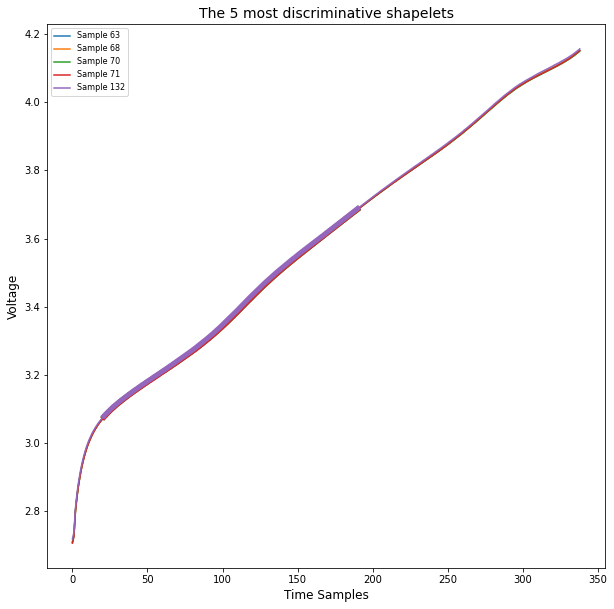

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


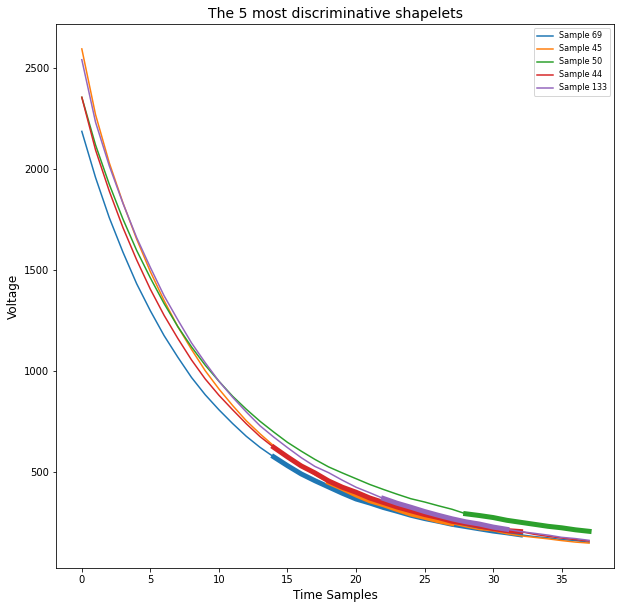

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


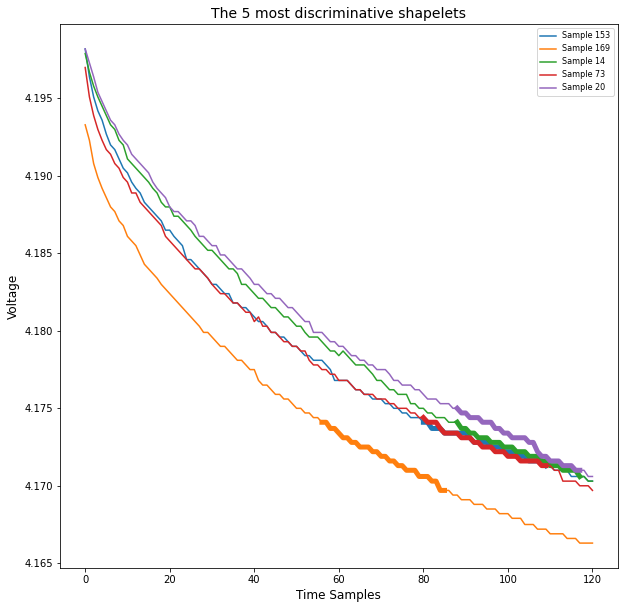

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


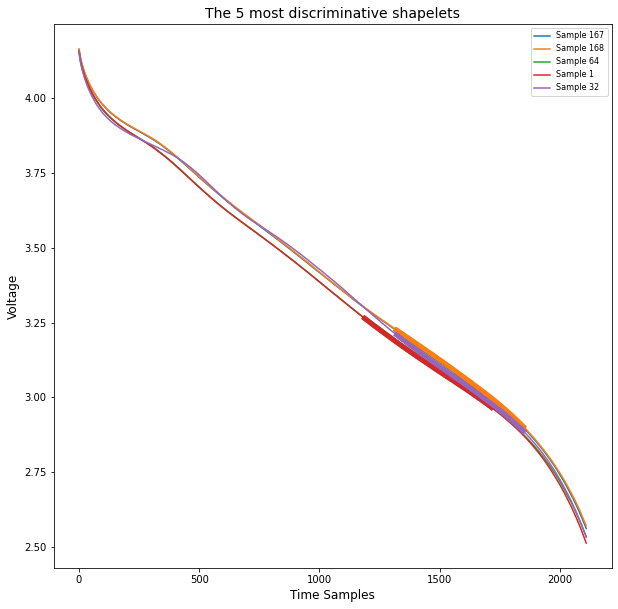

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


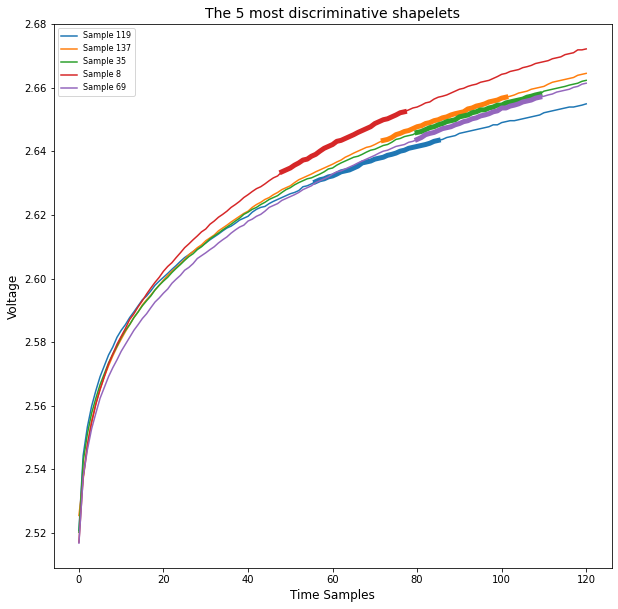

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


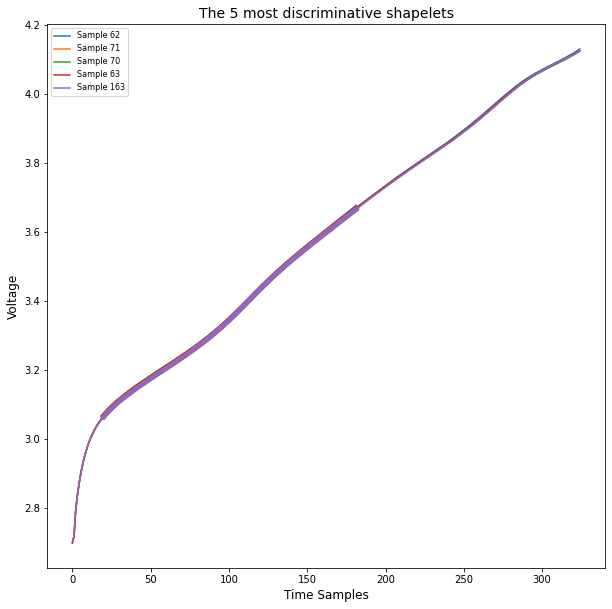

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


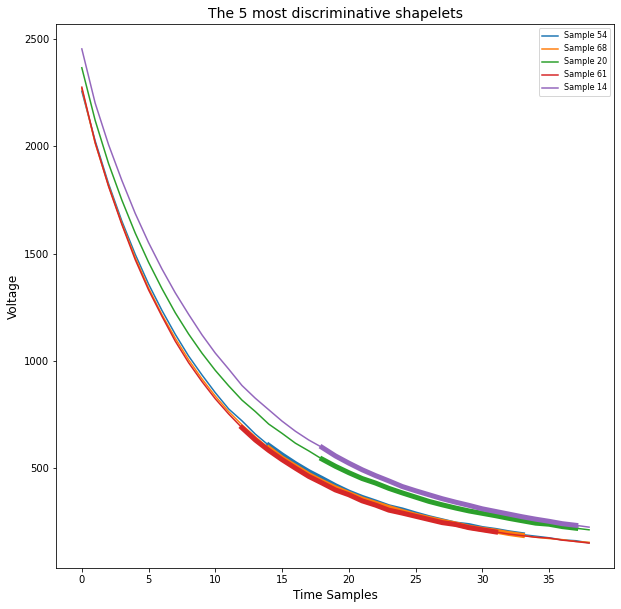

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


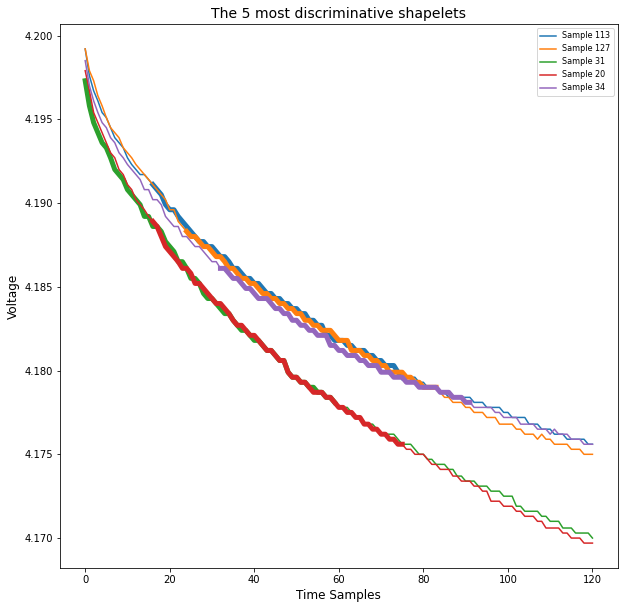

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


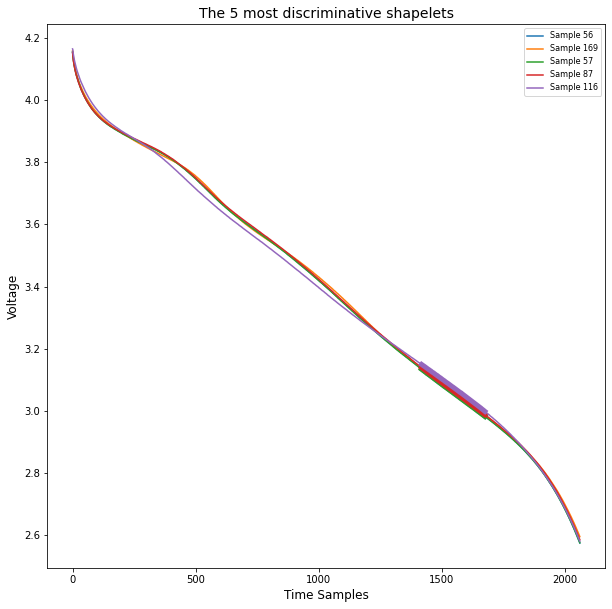

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/3583066626.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


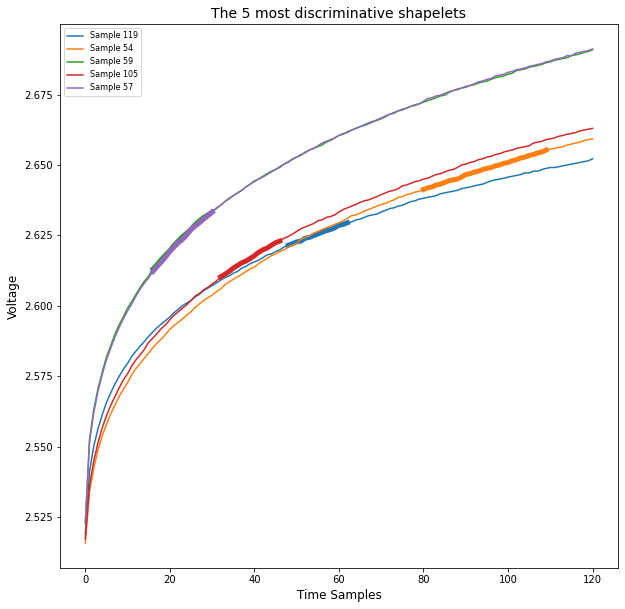

/tmp/ipykernel_1436962/3583066626.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()


{32:          std_shapelets_32_sub_sequence_1_0  std_shapelets_32_sub_sequence_1_1  \
 cell_id                                                                         
 16726.0                           0.008392                           0.008671   
 16762.0                           0.008784                           0.009022   
 16764.0                           0.007947                           0.008189   
 16766.0                           0.008410                           0.008769   
 16767.0                           0.008275                           0.008616   
 ...                                    ...                                ...   
 19783.0                           0.018404                           0.018512   
 19787.0                           0.018089                           0.018159   
 19794.0                           0.018138                           0.018205   
 19795.0                           0.015814                           0.015869   
 19801.0    

In [98]:
cycles_for_shapelets = [32, 122]

all_cycles_shapelets_features_dfs = {} # { cycle_num: shapelets features df }

for cycle in cycles_for_shapelets:
    shapelets_features_df = extract_shapelets_features(all_cycles_sub_sequences_norm_dfs[cycle], cycle)
    all_cycles_shapelets_features_dfs[cycle] = shapelets_features_df
    
all_cycles_shapelets_features_dfs

In [99]:
for shapelets_features in all_cycles_shapelets_features_dfs.values():
    master_table = master_table.join(shapelets_features)
    
master_table

,cycle_life,class,test_id,group,cap_chg_122,cap_chg_2,cap_chg_32,cap_chg_62,cap_chg_92,cap_dchg_122,cap_dchg_2,cap_dchg_32,cap_dchg_62,cap_dchg_92,cc_cap_ratio_122,cc_cap_ratio_2,cc_cap_ratio_32,cc_cap_ratio_62,cc_cap_ratio_92,cc_ratio_122,cc_ratio_2,cc_ratio_32,cc_ratio_62,cc_ratio_92,curr_chg_122,curr_chg_2,curr_chg_32,curr_chg_62,curr_chg_92,curr_dchg_122,curr_dchg_2,curr_dchg_32,curr_dchg_62,curr_dchg_92,engy_chg_122,engy_chg_2,engy_chg_32,engy_chg_62,engy_chg_92,engy_dchg_122,engy_dchg_2,engy_dchg_32,engy_dchg_62,engy_dchg_92,ocv_drop_chg_122,ocv_drop_chg_2,ocv_drop_chg_32,ocv_drop_chg_62,ocv_drop_chg_92,ocv_drop_dchg_122,ocv_drop_dchg_2,ocv_drop_dchg_32,ocv_drop_dchg_62,ocv_drop_dchg_92,r_chg_122,r_chg_2,r_chg_32,r_chg_62,r_chg_92,r_chg_end_122,r_chg_end_2,r_chg_end_32,r_chg_end_62,r_chg_end_92,r_dchg_122,r_dchg_2,r_dchg_32,r_dchg_62,r_dchg_92,r_dchg_end_122,r_dchg_end_2,r_dchg_end_32,r_dchg_end_62,r_dchg_end_92,retention_122,retention_2,retention_32,retention_62,retention_92,t1_max_122,t1_max_2,t1_max_32,t1_max_62,t1_max_92,t1_min_122,t1_min_2,t1_min_32,t1_min_62,t1_min_92,v_max_122,v_max_2,v_max_32,v_max_62,v_max_92,v_min_122,v_min_2,v_min_32,v_min_62,v_min_92,v_rest_before_chg_122,v_rest_before_chg_2,v_rest_before_chg_32,v_rest_before_chg_62,v_rest_before_chg_92,v_rest_before_dchg_122,v_rest_before_dchg_2,v_rest_before_dchg_32,v_rest_before_dchg_62,v_rest_before_dchg_92,std_shapelets_32_sub_sequence_1_0,std_shapelets_32_sub_sequence_1_1,std_shapelets_32_sub_sequence_1_2,std_shapelets_32_sub_sequence_1_3,std_shapelets_32_sub_sequence_1_4,std_shapelets_32_sub_sequence_1_5,std_shapelets_32_sub_sequence_1_6,std_shapelets_32_sub_sequence_1_7,std_shapelets_32_sub_sequence_1_8,std_shapelets_32_sub_sequence_1_9,std_shapelets_32_sub_sequence_2_0,std_shapelets_32_sub_sequence_2_1,std_shapelets_32_sub_sequence_2_2,std_shapelets_32_sub_sequence_2_3,std_shapelets_32_sub_sequence_2_4,std_shapelets_32_sub_sequence_2_5,std_shapelets_32_sub_sequence_2_6,std_shapelets_32_sub_sequence_2_7,std_shapelets_32_sub_sequence_2_8,std_shapelets_32_sub_sequence_2_9,std_shapelets_32_sub_sequence_3_0,std_shapelets_32_sub_sequence_3_1,std_shapelets_32_sub_sequence_3_2,std_shapelets_32_sub_sequence_3_3,std_shapelets_32_sub_sequence_3_4,std_shapelets_32_sub_sequence_3_5,std_shapelets_32_sub_sequence_3_6,std_shapelets_32_sub_sequence_3_7,std_shapelets_32_sub_sequence_3_8,std_shapelets_32_sub_sequence_3_9,std_shapelets_32_sub_sequence_4_0,std_shapelets_32_sub_sequence_4_1,std_shapelets_32_sub_sequence_4_2,std_shapelets_32_sub_sequence_4_3,std_shapelets_32_sub_sequence_4_4,std_shapelets_32_sub_sequence_4_5,std_shapelets_32_sub_sequence_4_6,std_shapelets_32_sub_sequence_4_7,std_shapelets_32_sub_sequence_4_8,std_shapelets_32_sub_sequence_4_9,std_shapelets_32_sub_sequence_5_0,std_shapelets_32_sub_sequence_5_1,std_shapelets_32_sub_sequence_5_2,std_shapelets_32_sub_sequence_5_3,std_shapelets_32_sub_sequence_5_4,std_shapelets_32_sub_sequence_5_5,std_shapelets_32_sub_sequence_5_6,std_shapelets_32_sub_sequence_5_7,std_shapelets_32_sub_sequence_5_8,std_shapelets_32_sub_sequence_5_9,std_shapelets_122_sub_sequence_1_0,std_shapelets_122_sub_sequence_1_1,std_shapelets_122_sub_sequence_1_2,std_shapelets_122_sub_sequence_1_3,std_shapelets_122_sub_sequence_1_4,std_shapelets_122_sub_sequence_1_5,std_shapelets_122_sub_sequence_1_6,std_shapelets_122_sub_sequence_1_7,std_shapelets_122_sub_sequence_1_8,std_shapelets_122_sub_sequence_1_9,std_shapelets_122_sub_sequence_2_0,std_shapelets_122_sub_sequence_2_1,std_shapelets_122_sub_sequence_2_2,std_shapelets_122_sub_sequence_2_3,std_shapelets_122_sub_sequence_2_4,std_shapelets_122_sub_sequence_2_5,std_shapelets_122_sub_sequence_2_6,std_shapelets_122_sub_sequence_2_7,std_shapelets_122_sub_sequence_2_8,std_shapelets_122_sub_sequence_2_9,std_shapelets_122_sub_sequence_3_0,std_shapelets_122_sub_sequence_3_1,std_shapelets_122_sub_sequence_3_2,std_shapelets_122_sub_sequence_3_3,std_shapelets_122_sub_sequence_3_4,std_shapelets_122_sub_s

/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


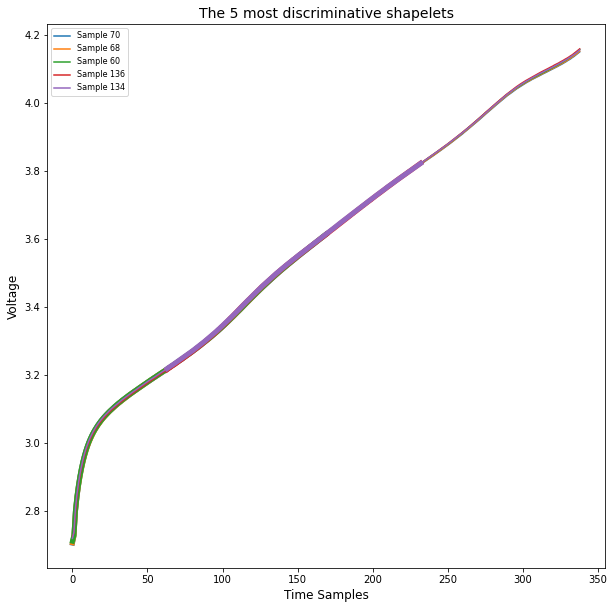

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


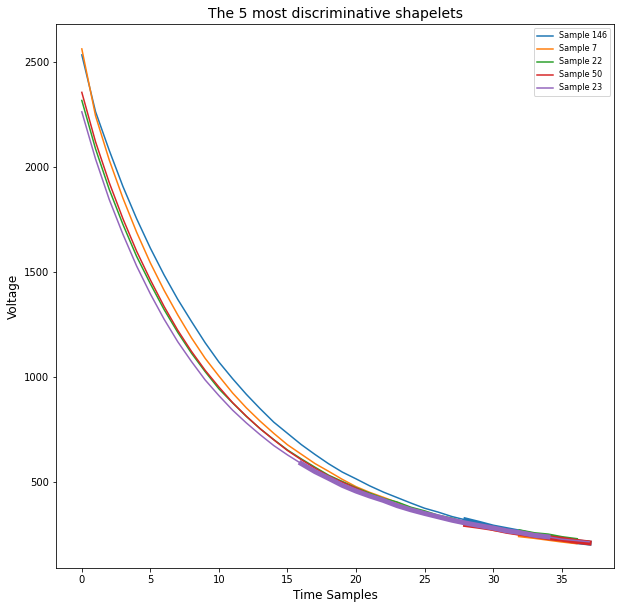

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


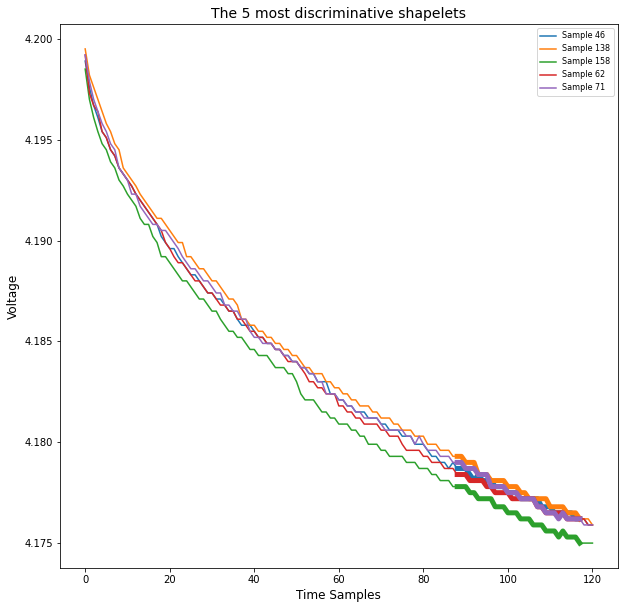

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


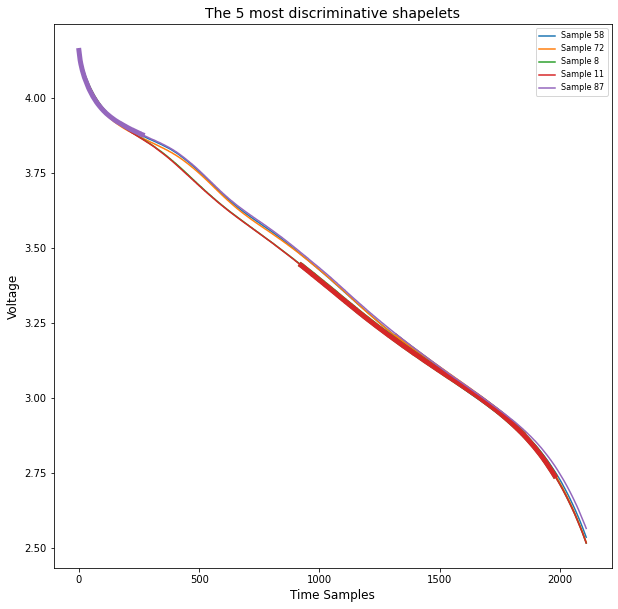

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


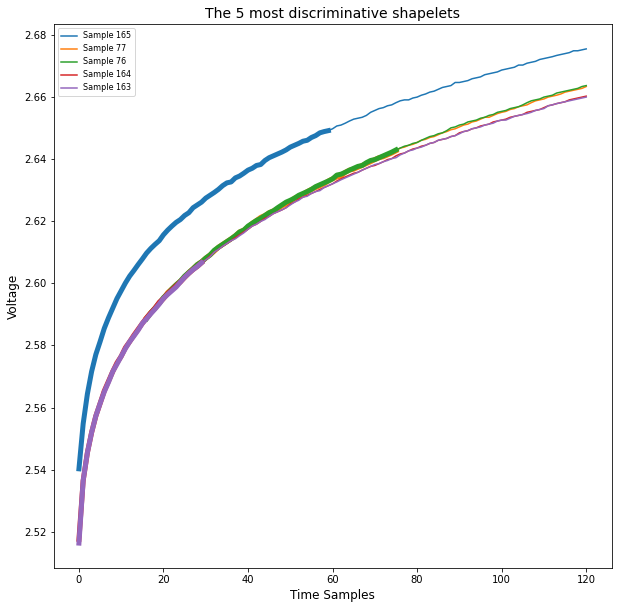

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


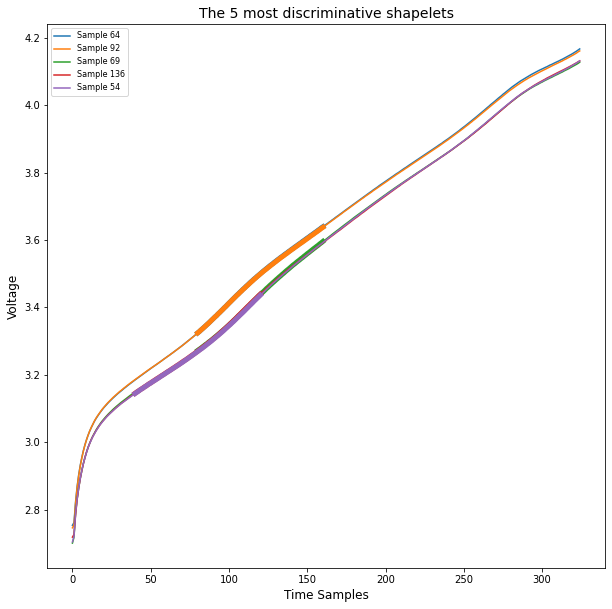

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


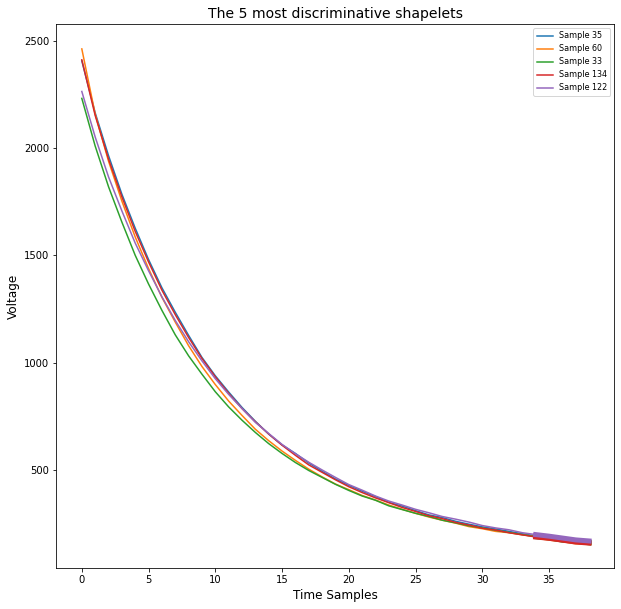

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


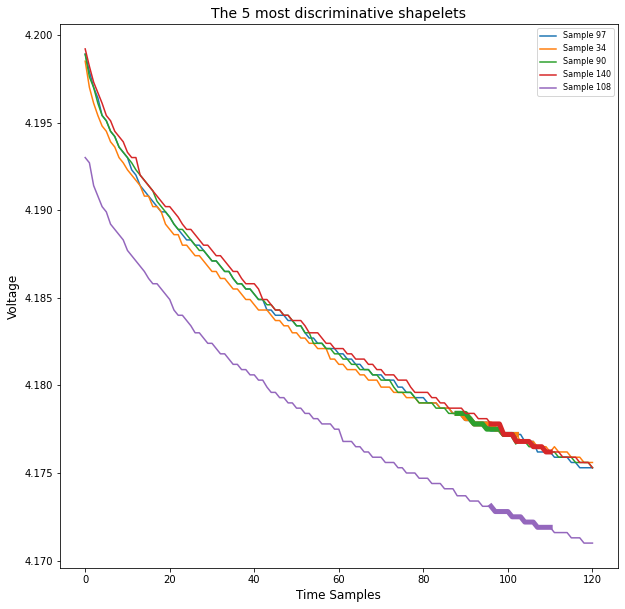

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


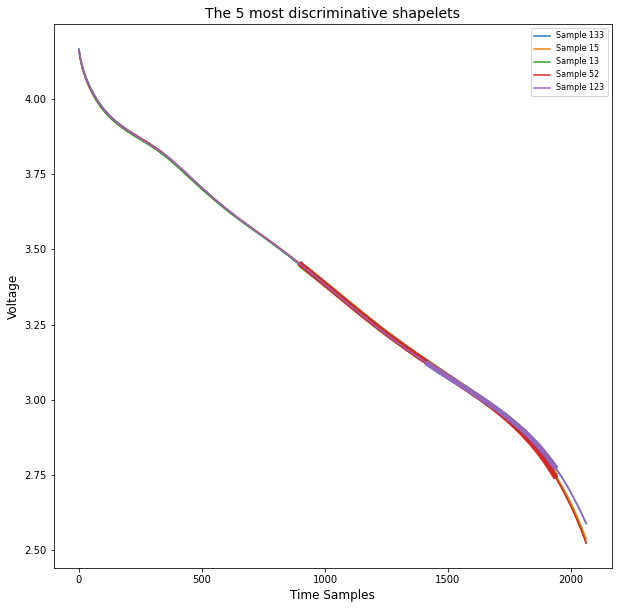

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()
/tmp/ipykernel_1436962/1120112635.py:10: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_train = X_shapelets_train_prep.reset_index().drop(columns=['cell_id']).to_numpy()


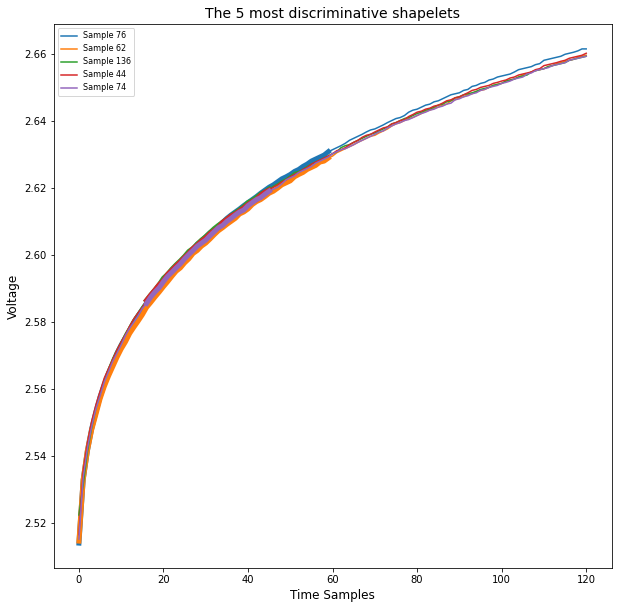

/tmp/ipykernel_1436962/1120112635.py:40: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_shapelets_test = X_shapelets_test_prep.reset_index().drop(columns=['cell_id']).to_numpy()


{32:          revised_shapelets_32_sub_sequence_1_0  \
 cell_id                                          
 16726.0                               0.025201   
 16762.0                               0.033909   
 16764.0                               0.024900   
 16766.0                               0.022800   
 16767.0                               0.025664   
 ...                                        ...   
 19783.0                               0.030437   
 19787.0                               0.032550   
 19794.0                               0.037282   
 19795.0                               0.017738   
 19801.0                               0.016572   
 
          revised_shapelets_32_sub_sequence_1_1  \
 cell_id                                          
 16726.0                               0.024966   
 16762.0                               0.033677   
 16764.0                               0.024650   
 16766.0                               0.022533   
 16767.0                 

In [100]:
cycles_for_revised_shapelets = [32, 122]

all_cycles_revised_shapelets_features_dfs = {} # { cycle_num: shapelets features df }

for cycle in cycles_for_revised_shapelets:
    revised_shapelets_features_df = extract_revised_shapelets_features(all_cycles_sub_sequences_norm_dfs[cycle], cycle)
    all_cycles_revised_shapelets_features_dfs[cycle] = revised_shapelets_features_df
    
all_cycles_revised_shapelets_features_dfs

In [101]:
for revised_shapelets_features in all_cycles_revised_shapelets_features_dfs.values():
    master_table = master_table.join(revised_shapelets_features)
    
master_table

,cycle_life,class,test_id,group,cap_chg_122,cap_chg_2,cap_chg_32,cap_chg_62,cap_chg_92,cap_dchg_122,cap_dchg_2,cap_dchg_32,cap_dchg_62,cap_dchg_92,cc_cap_ratio_122,cc_cap_ratio_2,cc_cap_ratio_32,cc_cap_ratio_62,cc_cap_ratio_92,cc_ratio_122,cc_ratio_2,cc_ratio_32,cc_ratio_62,cc_ratio_92,curr_chg_122,curr_chg_2,curr_chg_32,curr_chg_62,curr_chg_92,curr_dchg_122,curr_dchg_2,curr_dchg_32,curr_dchg_62,curr_dchg_92,engy_chg_122,engy_chg_2,engy_chg_32,engy_chg_62,engy_chg_92,engy_dchg_122,engy_dchg_2,engy_dchg_32,engy_dchg_62,engy_dchg_92,ocv_drop_chg_122,ocv_drop_chg_2,ocv_drop_chg_32,ocv_drop_chg_62,ocv_drop_chg_92,ocv_drop_dchg_122,ocv_drop_dchg_2,ocv_drop_dchg_32,ocv_drop_dchg_62,ocv_drop_dchg_92,r_chg_122,r_chg_2,r_chg_32,r_chg_62,r_chg_92,r_chg_end_122,r_chg_end_2,r_chg_end_32,r_chg_end_62,r_chg_end_92,r_dchg_122,r_dchg_2,r_dchg_32,r_dchg_62,r_dchg_92,r_dchg_end_122,r_dchg_end_2,r_dchg_end_32,r_dchg_end_62,r_dchg_end_92,retention_122,retention_2,retention_32,retention_62,retention_92,t1_max_122,t1_max_2,t1_max_32,t1_max_62,t1_max_92,t1_min_122,t1_min_2,t1_min_32,t1_min_62,t1_min_92,v_max_122,v_max_2,v_max_32,v_max_62,v_max_92,v_min_122,v_min_2,v_min_32,v_min_62,v_min_92,v_rest_before_chg_122,v_rest_before_chg_2,v_rest_before_chg_32,v_rest_before_chg_62,v_rest_before_chg_92,v_rest_before_dchg_122,v_rest_before_dchg_2,v_rest_before_dchg_32,v_rest_before_dchg_62,v_rest_before_dchg_92,std_shapelets_32_sub_sequence_1_0,std_shapelets_32_sub_sequence_1_1,std_shapelets_32_sub_sequence_1_2,std_shapelets_32_sub_sequence_1_3,std_shapelets_32_sub_sequence_1_4,std_shapelets_32_sub_sequence_1_5,std_shapelets_32_sub_sequence_1_6,std_shapelets_32_sub_sequence_1_7,std_shapelets_32_sub_sequence_1_8,std_shapelets_32_sub_sequence_1_9,std_shapelets_32_sub_sequence_2_0,std_shapelets_32_sub_sequence_2_1,std_shapelets_32_sub_sequence_2_2,std_shapelets_32_sub_sequence_2_3,std_shapelets_32_sub_sequence_2_4,std_shapelets_32_sub_sequence_2_5,std_shapelets_32_sub_sequence_2_6,std_shapelets_32_sub_sequence_2_7,std_shapelets_32_sub_sequence_2_8,std_shapelets_32_sub_sequence_2_9,std_shapelets_32_sub_sequence_3_0,std_shapelets_32_sub_sequence_3_1,std_shapelets_32_sub_sequence_3_2,std_shapelets_32_sub_sequence_3_3,std_shapelets_32_sub_sequence_3_4,std_shapelets_32_sub_sequence_3_5,std_shapelets_32_sub_sequence_3_6,std_shapelets_32_sub_sequence_3_7,std_shapelets_32_sub_sequence_3_8,std_shapelets_32_sub_sequence_3_9,std_shapelets_32_sub_sequence_4_0,std_shapelets_32_sub_sequence_4_1,std_shapelets_32_sub_sequence_4_2,std_shapelets_32_sub_sequence_4_3,std_shapelets_32_sub_sequence_4_4,std_shapelets_32_sub_sequence_4_5,std_shapelets_32_sub_sequence_4_6,std_shapelets_32_sub_sequence_4_7,std_shapelets_32_sub_sequence_4_8,std_shapelets_32_sub_sequence_4_9,std_shapelets_32_sub_sequence_5_0,std_shapelets_32_sub_sequence_5_1,std_shapelets_32_sub_sequence_5_2,std_shapelets_32_sub_sequence_5_3,std_shapelets_32_sub_sequence_5_4,std_shapelets_32_sub_sequence_5_5,std_shapelets_32_sub_sequence_5_6,std_shapelets_32_sub_sequence_5_7,std_shapelets_32_sub_sequence_5_8,std_shapelets_32_sub_sequence_5_9,std_shapelets_122_sub_sequence_1_0,std_shapelets_122_sub_sequence_1_1,std_shapelets_122_sub_sequence_1_2,std_shapelets_122_sub_sequence_1_3,std_shapelets_122_sub_sequence_1_4,std_shapelets_122_sub_sequence_1_5,std_shapelets_122_sub_sequence_1_6,std_shapelets_122_sub_sequence_1_7,std_shapelets_122_sub_sequence_1_8,std_shapelets_122_sub_sequence_1_9,std_shapelets_122_sub_sequence_2_0,std_shapelets_122_sub_sequence_2_1,std_shapelets_122_sub_sequence_2_2,std_shapelets_122_sub_sequence_2_3,std_shapelets_122_sub_sequence_2_4,std_shapelets_122_sub_sequence_2_5,std_shapelets_122_sub_sequence_2_6,std_shapelets_122_sub_sequence_2_7,std_shapelets_122_sub_sequence_2_8,std_shapelets_122_sub_sequence_2_9,std_shapelets_122_sub_sequence_3_0,std_shapelets_122_sub_sequence_3_1,std_shapelets_122_sub_sequence_3_2,std_shapelets_122_sub_sequence_3_3,std_shapelets_122_sub_sequence_3_4,std_shapelets_122_sub_s

### Cycles for delta q

Identifying voltage jumps in cells...
Cells with identified voltage jumps: []
Selected cells for detailed analysis: []
Analyzing voltage jumps before smoothing...


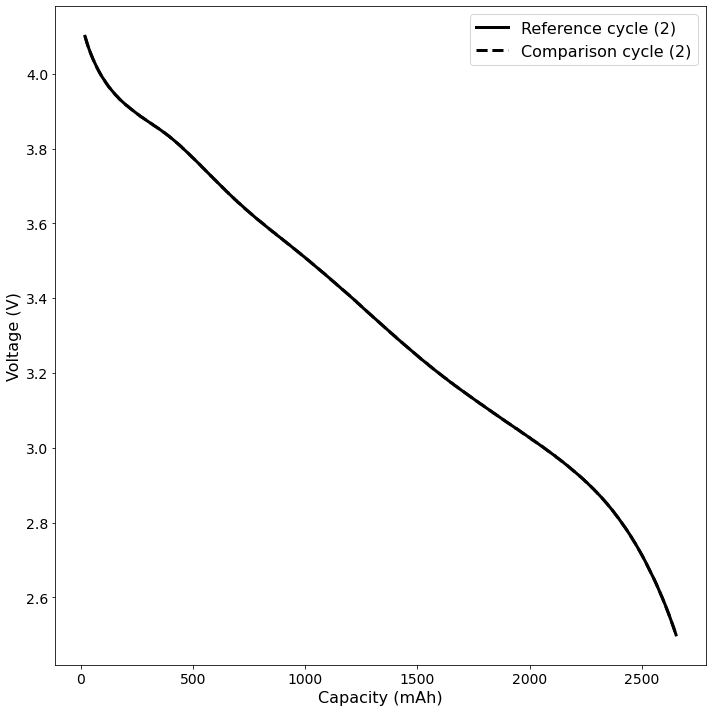

Identifying voltage jumps in cells...
Cells with identified voltage jumps: []
Selected cells for detailed analysis: []
Analyzing voltage jumps before smoothing...


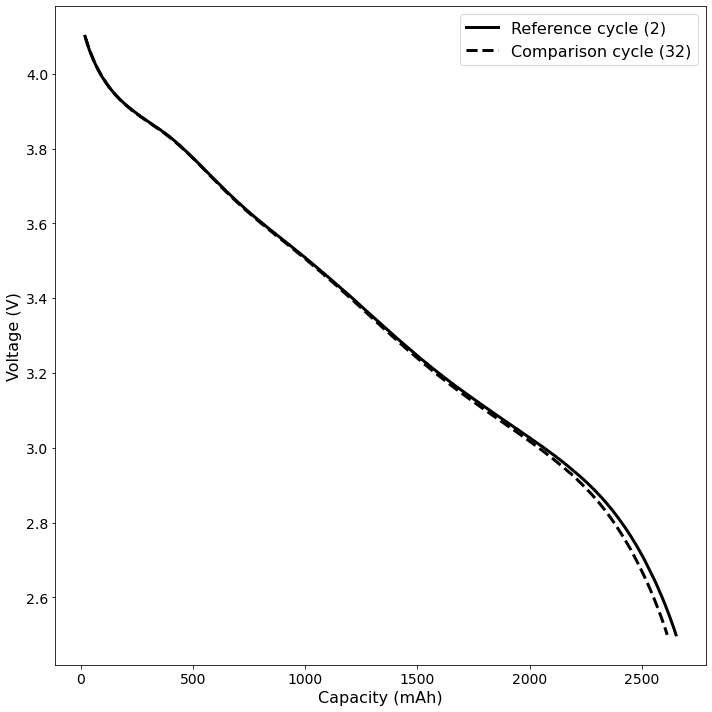

Identifying voltage jumps in cells...
Cell ID 16972.0 has potential voltage jumps at indices [48130]


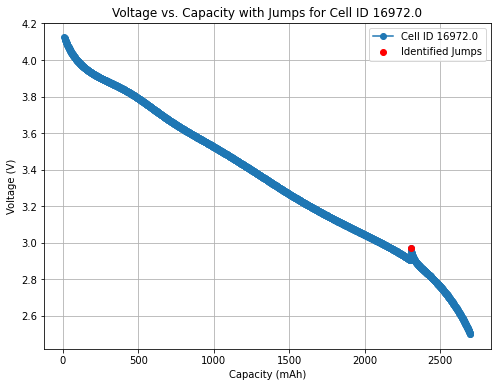

Cell ID 16974.0 has potential voltage jumps at indices [49987, 50451]


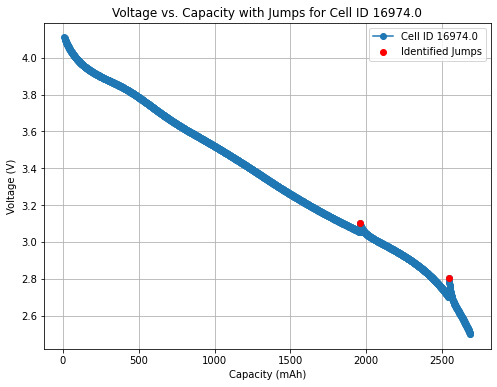

Cell ID 16978.0 has potential voltage jumps at indices [52141]


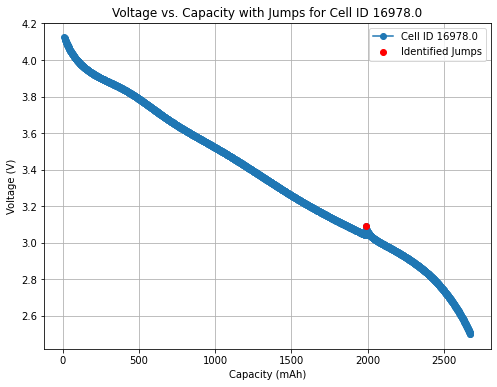

Cell ID 17169.0 has potential voltage jumps at indices [117958]


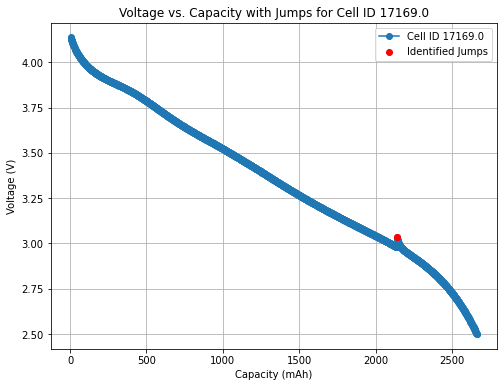

Cell ID 17170.0 has potential voltage jumps at indices [120094]


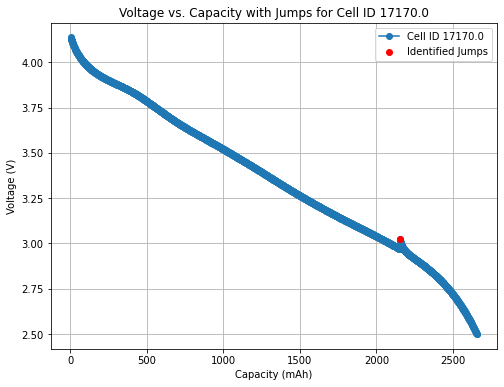

Cell ID 18192.0 has potential voltage jumps at indices [260092]


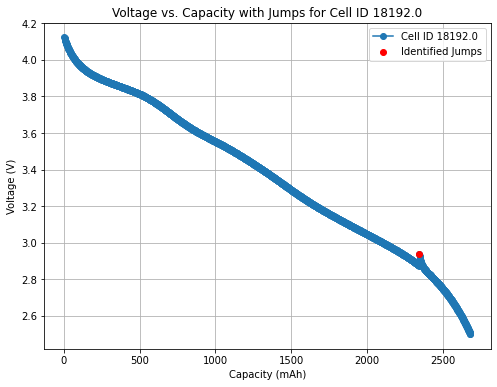

Cell ID 18479.0 has potential voltage jumps at indices [323977]


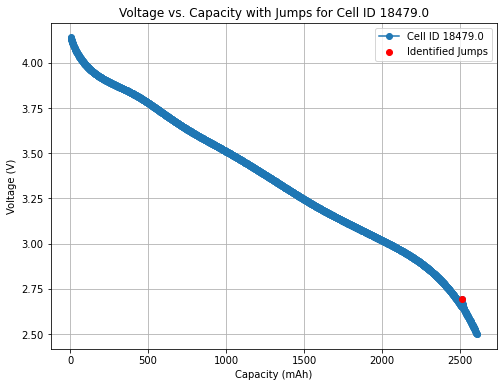

Cell ID 18480.0 has potential voltage jumps at indices [326125]


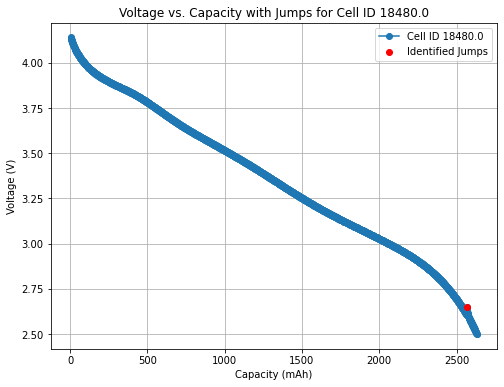

Cell ID 19168.0 has potential voltage jumps at indices [400297]


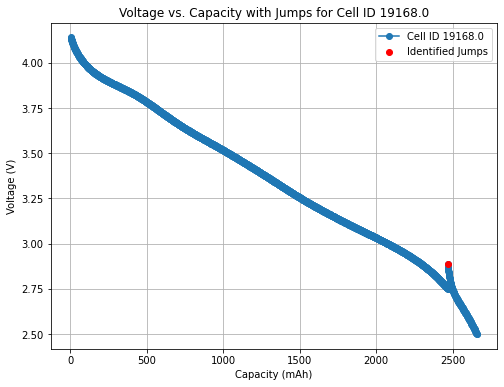

Cell ID 19170.0 has potential voltage jumps at indices [402459]


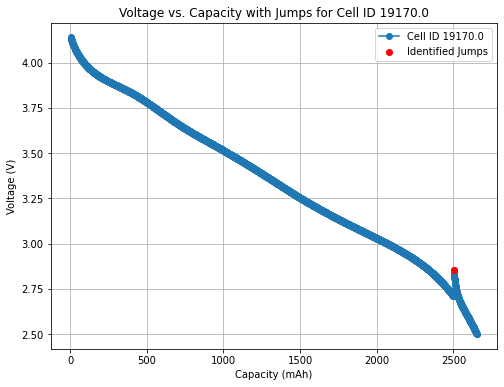

Cell ID 19171.0 has potential voltage jumps at indices [404549]


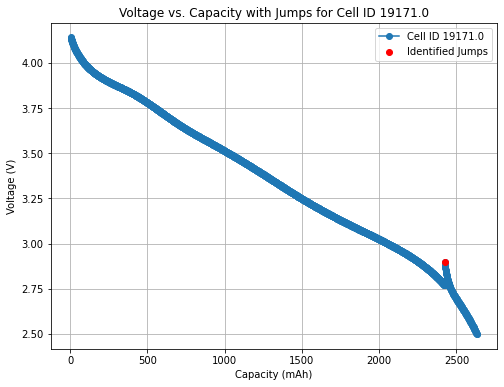

Cell ID 19687.0 has potential voltage jumps at indices [440255]


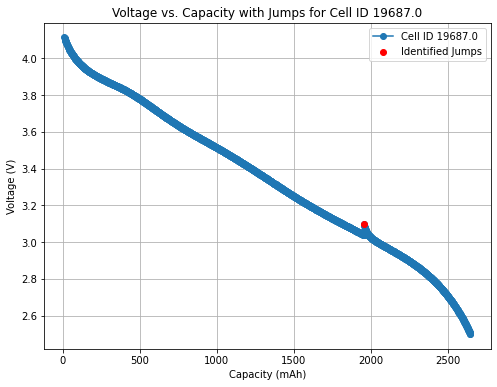

Cell ID 19776.0 has potential voltage jumps at indices [444294]


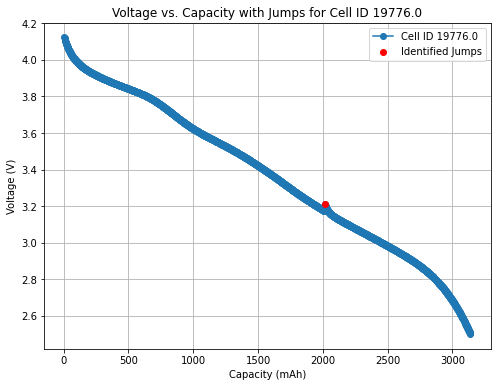

Cell ID 19778.0 has potential voltage jumps at indices [446503]


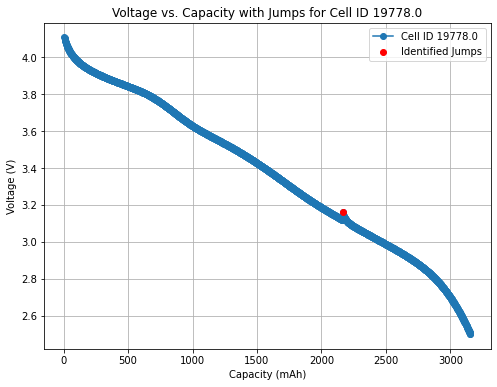

Cell ID 19779.0 has potential voltage jumps at indices [448651]


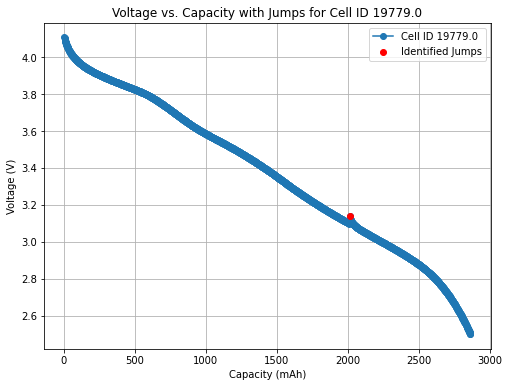

Cells with identified voltage jumps: [16972.0, 16974.0, 16978.0, 17169.0, 17170.0, 18192.0, 18479.0, 18480.0, 19168.0, 19170.0, 19171.0, 19687.0, 19776.0, 19778.0, 19779.0]
Selected cells for detailed analysis: [16972.0, 16974.0, 16978.0]
Analyzing voltage jumps before smoothing...
Zoomed-in view around jump for Cell ID 16972.0, Index 48130:
       test_vol     capacity
48080    2.9371  2240.520833
48081    2.9365  2241.798794
48082    2.9358  2243.076754
48083    2.9349  2244.354715
48084    2.9343  2245.632676
...         ...          ...
48176    2.8701  2363.205067
48177    2.8692  2364.483028
48178    2.8683  2365.760989
48179    2.8673  2367.038950
48180    2.8664  2368.316910

[101 rows x 2 columns]


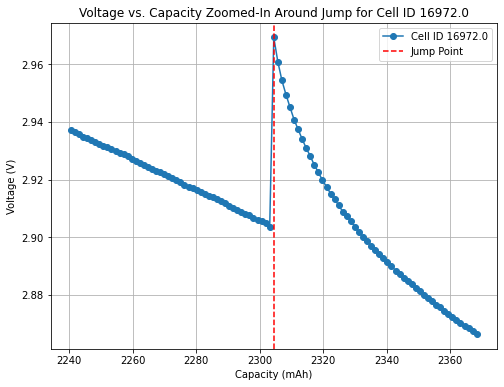

Zoomed-in view around jump for Cell ID 16974.0, Index 49987:
       test_vol     capacity
49937    3.0803  1895.773789
49938    3.0797  1897.041696
49939    3.0794  1898.309602
49940    3.0788  1899.577509
49941    3.0784  1900.845415
...         ...          ...
50033    3.0323  2017.492813
50034    3.0316  2018.760719
50035    3.0310  2020.028626
50036    3.0301  2021.296532
50037    3.0295  2022.564439

[101 rows x 2 columns]


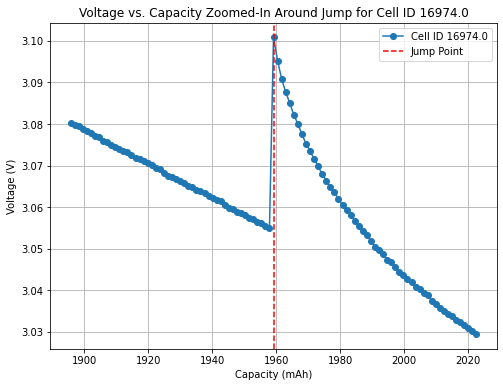

Zoomed-in view around jump for Cell ID 16974.0, Index 50451:
       test_vol     capacity
50401    2.7622  2484.082402
50402    2.7610  2485.350309
50403    2.7601  2486.618215
50404    2.7588  2487.886122
50405    2.7576  2489.154028
...         ...          ...
50497    2.6292  2604.787101
50498    2.6271  2606.055007
50499    2.6255  2607.322914
50500    2.6236  2608.590820
50501    2.6218  2609.858727

[101 rows x 2 columns]


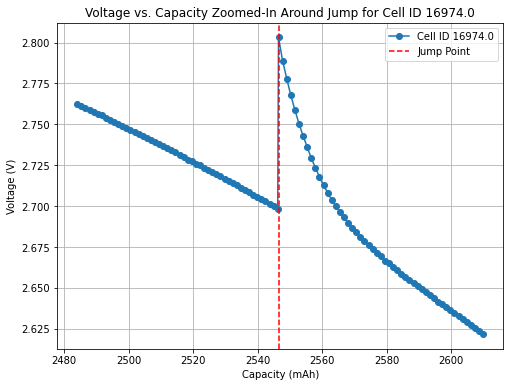

Zoomed-in view around jump for Cell ID 16978.0, Index 52141:
       test_vol     capacity
52091    3.0664  1925.655822
52092    3.0657  1926.917554
52093    3.0654  1928.179286
52094    3.0648  1929.441019
52095    3.0645  1930.702751
...         ...          ...
52187    3.0186  2046.782122
52188    3.0180  2048.043854
52189    3.0174  2049.305586
52190    3.0168  2050.567319
52191    3.0161  2051.829051

[101 rows x 2 columns]


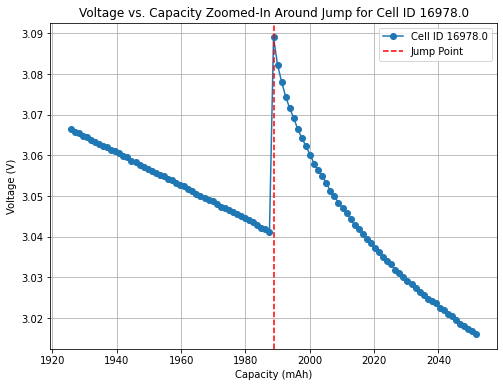

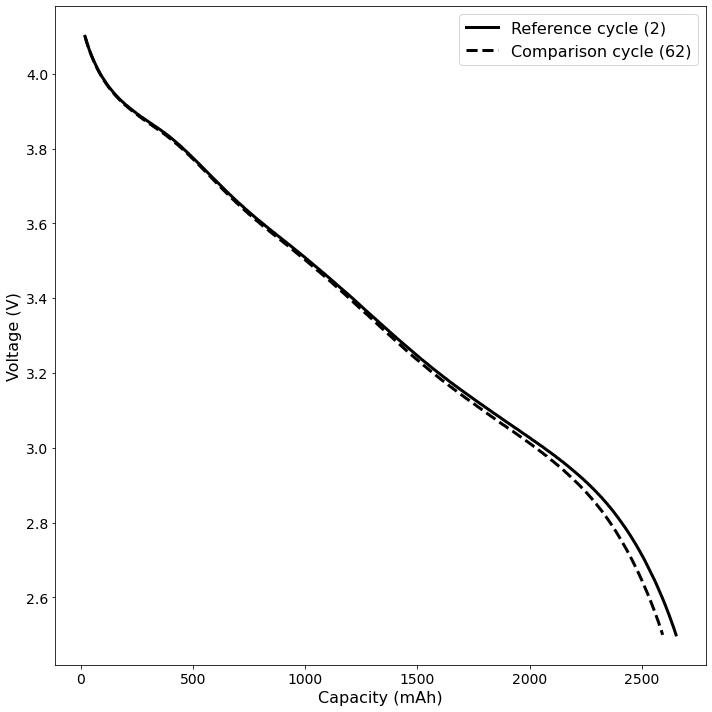

Identifying voltage jumps in cells...
Cell ID 17404.0 has potential voltage jumps at indices [136517]


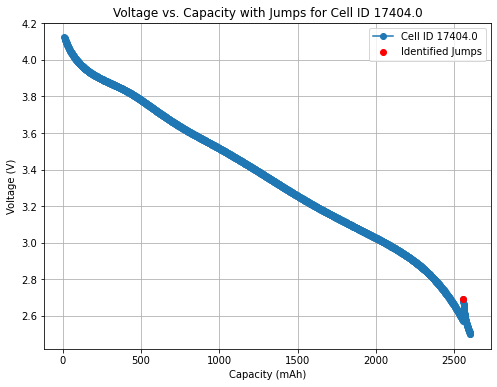

Cell ID 17663.0 has potential voltage jumps at indices [182606]


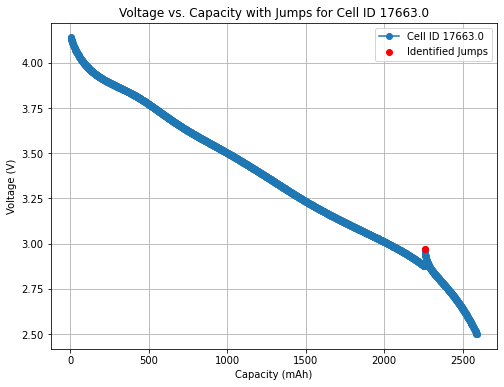

Cells with identified voltage jumps: [17404.0, 17663.0]
Selected cells for detailed analysis: [17404.0, 17663.0]
Analyzing voltage jumps before smoothing...
Zoomed-in view around jump for Cell ID 17404.0, Index 136517:
        test_vol     capacity
136467    2.6609  2498.629536
136468    2.6590  2499.857847
136469    2.6574  2501.086158
136470    2.6559  2502.314468
136471    2.6543  2503.542779
...          ...          ...
136550    2.5093  2600.087997
136551    2.5068  2601.316307
136552    2.5043  2602.544618
136553    2.5015  2603.772929
136554    2.5000  2604.509915

[88 rows x 2 columns]


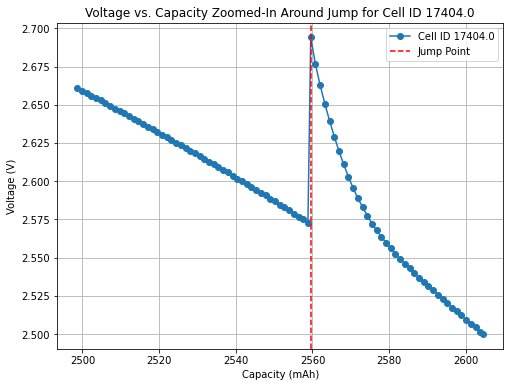

Zoomed-in view around jump for Cell ID 17663.0, Index 182606:
        test_vol     capacity
182556    2.9120  2196.943309
182557    2.9113  2198.164375
182558    2.9107  2199.385442
182559    2.9101  2200.606509
182560    2.9092  2201.827576
...          ...          ...
182652    2.8413  2312.993493
182653    2.8394  2314.214560
182654    2.8382  2315.435627
182655    2.8369  2316.656693
182656    2.8357  2317.877760

[101 rows x 2 columns]


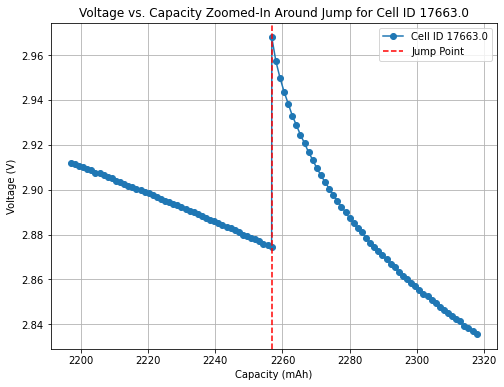

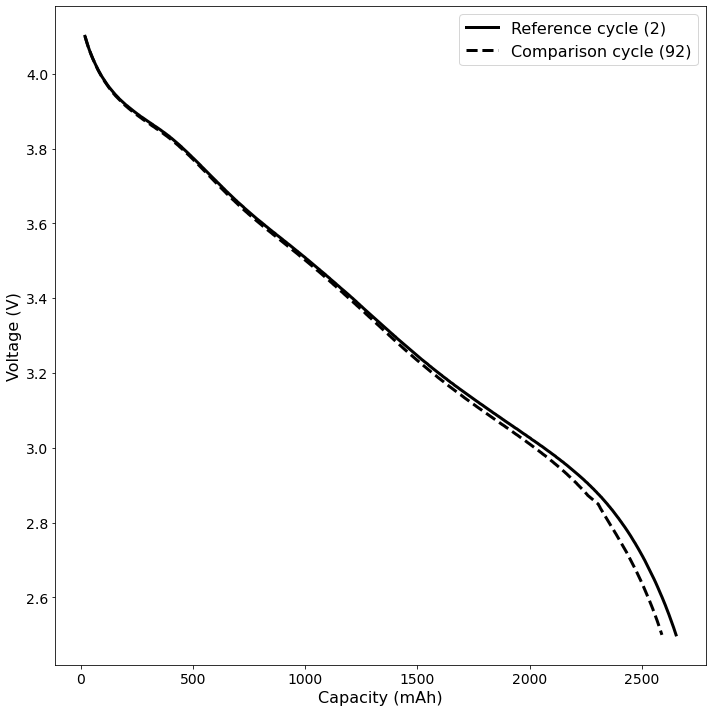

Identifying voltage jumps in cells...
Cells with identified voltage jumps: []
Selected cells for detailed analysis: []
Analyzing voltage jumps before smoothing...


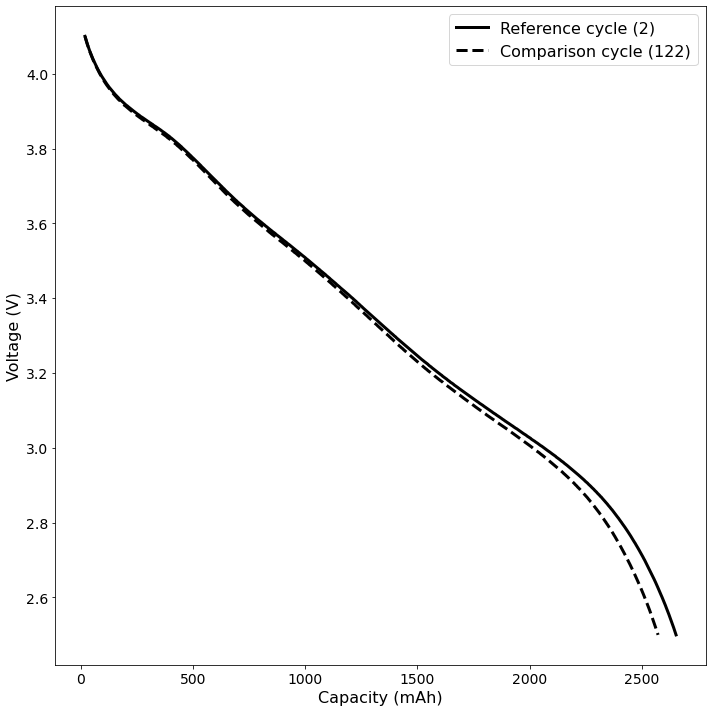

In [102]:
reference_cycle_for_delta_q = 2
reference_sub_sequence_num = 4
cycles_for_delta_q = [32, 62, 92, 122]
all_delta_q_cycles = [reference_cycle_for_delta_q] + cycles_for_delta_q

all_volt_cap_dfs = {}  # Store voltage-capacity DataFrames

for cycle in all_delta_q_cycles:
    norm_sub_sequence = all_cycles_sub_sequences_norm_dfs[cycle][reference_sub_sequence_num - 1]
    sub_sequence_volt_cap_df = create_voltage_to_capacity_df(norm_sub_sequence)
    all_volt_cap_dfs[cycle] = sub_sequence_volt_cap_df
    plot_enhanced_example(
        all_volt_cap_dfs[reference_cycle_for_delta_q], 
        all_volt_cap_dfs[cycle], 
        reference_cycle_for_delta_q, 
        cycle
    )

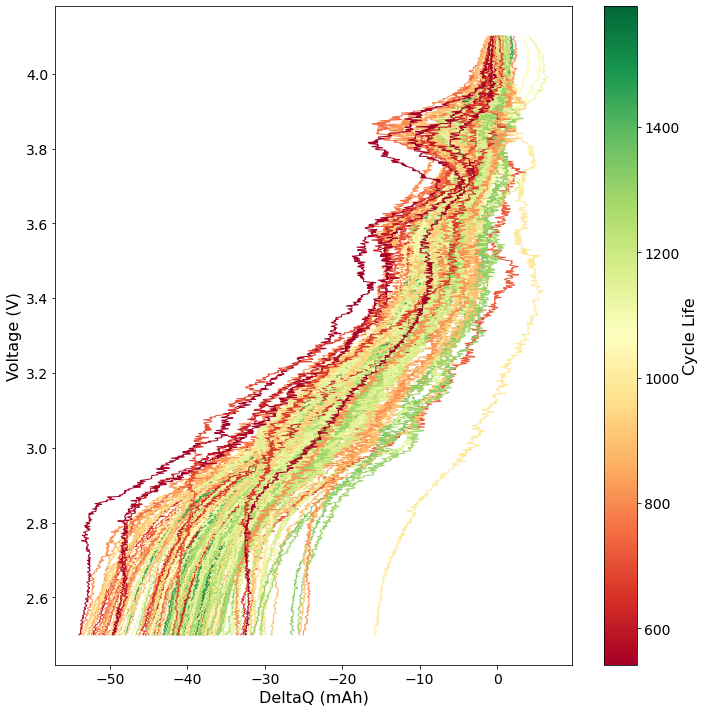

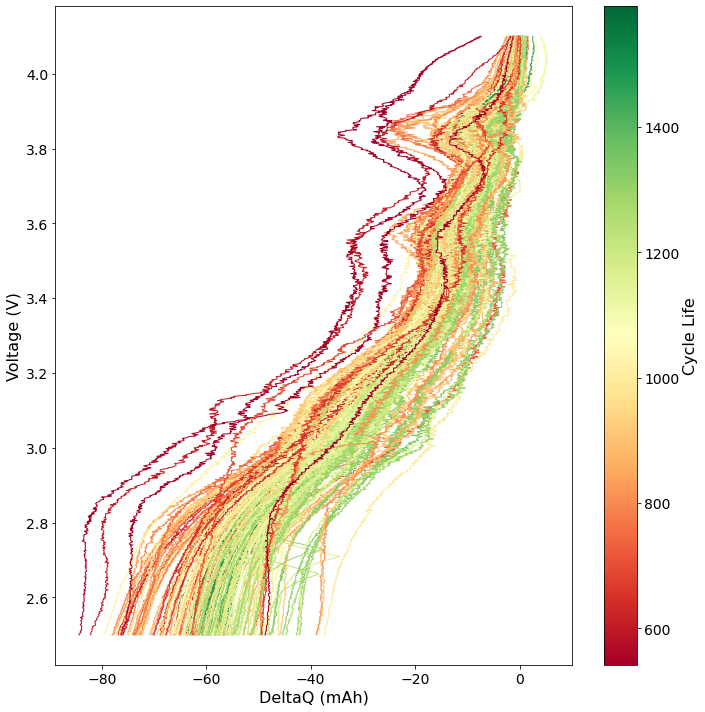

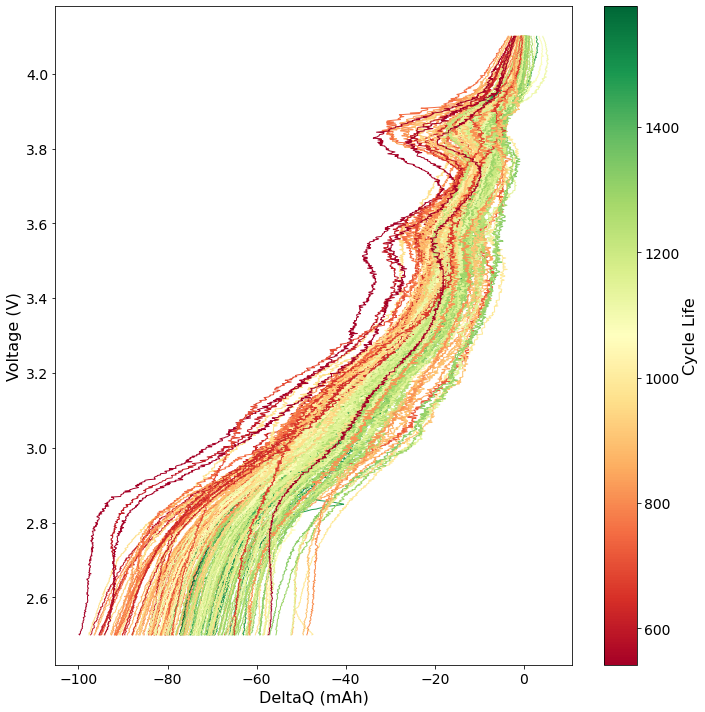

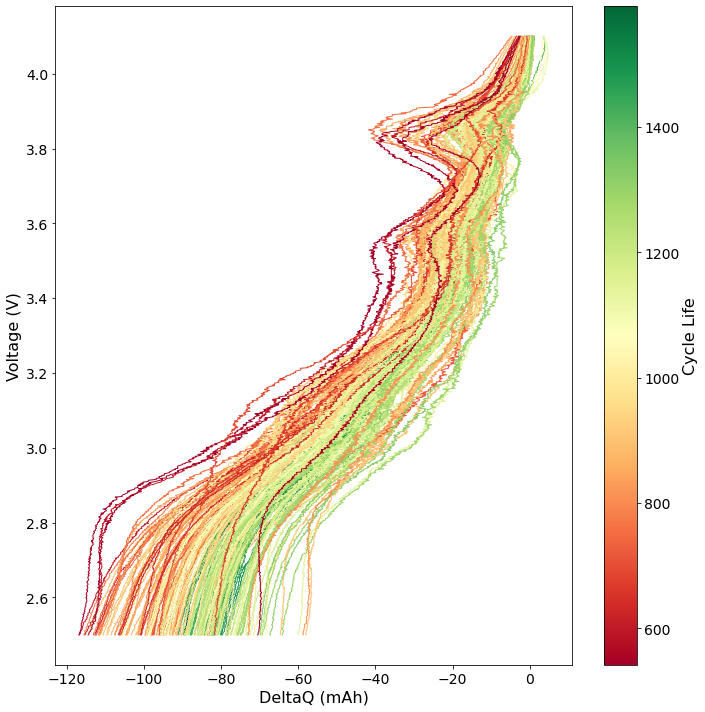

In [103]:
all_delta_q_dfs = {} # { cycle_num: delta_q_df }

for cycle in cycles_for_delta_q:
    delta_q_df = create_delta_q(reference_cycle_for_delta_q, cycle, all_volt_cap_dfs)
    all_delta_q_dfs[cycle] = delta_q_df
    delta_q_features_df = create_delta_q_features_df(delta_q_df, cycle, reference_cycle_for_delta_q)
    master_table = master_table.join(delta_q_features_df)
    plot_together_all_delta_q(all_delta_q_dfs[cycle], cycle, master_table)

[2, 32, 62, 92, 122]
Identifying voltage jumps in cells...
Cell ID 17446.0 has potential voltage jumps at indices [24877]


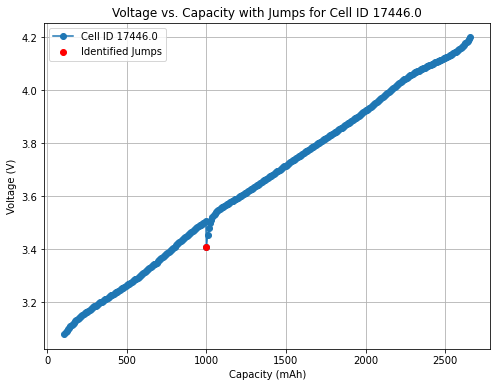

Cell ID 17447.0 has potential voltage jumps at indices [25237]


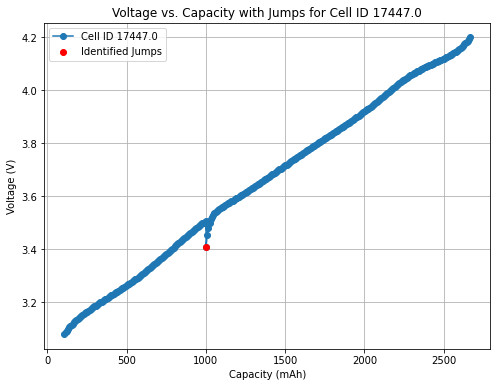

Cell ID 17448.0 has potential voltage jumps at indices [25594]


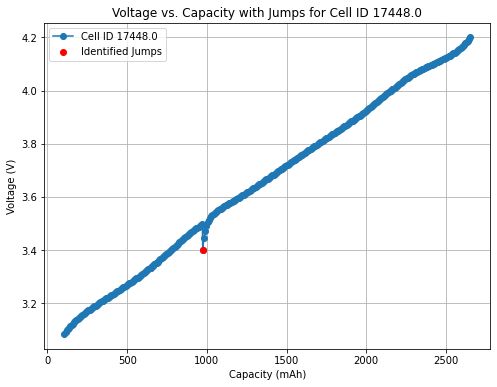

Cell ID 17468.0 has potential voltage jumps at indices [25941]


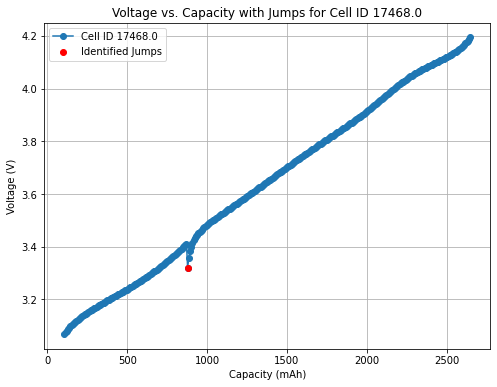

Cell ID 19787.0 has potential voltage jumps at indices [76652]


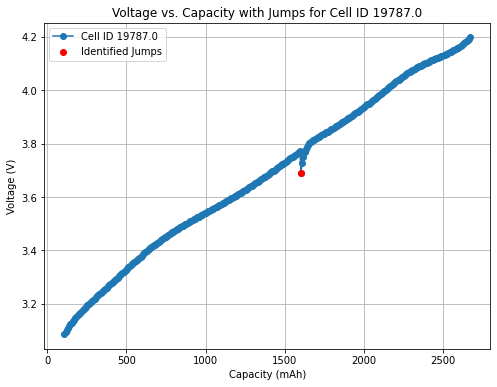

Cells with identified voltage jumps: [17446.0, 17447.0, 17448.0, 17468.0, 19787.0]
Selected cells for detailed analysis: [17446.0, 17447.0, 17448.0]
Analyzing voltage jumps before smoothing...
Zoomed-in view around jump for Cell ID 17446.0, Index 24877:
       test_vol     capacity
24827    3.3206   626.556303
24828    3.3246   634.096090
24829    3.3280   641.635877
24830    3.3317   649.175664
24831    3.3355   656.715451
...         ...          ...
24923    3.6532  1346.379771
24924    3.6563  1353.919558
24925    3.6594  1361.459345
24926    3.6625  1368.999132
24927    3.6653  1376.538919

[101 rows x 2 columns]


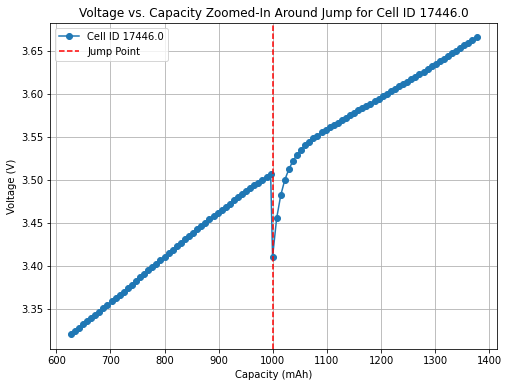

Zoomed-in view around jump for Cell ID 17447.0, Index 25237:
       test_vol     capacity
25187    3.3196   629.560163
25188    3.3237   637.136097
25189    3.3271   644.712032
25190    3.3308   652.287966
25191    3.3345   659.863901
...         ...          ...
25283    3.6535  1349.804262
25284    3.6566  1357.380197
25285    3.6597  1364.956131
25286    3.6628  1372.532066
25287    3.6659  1380.108000

[101 rows x 2 columns]


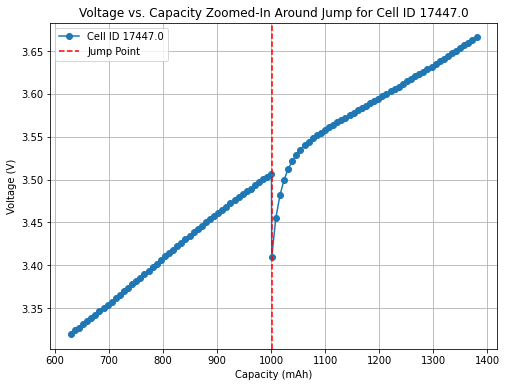

Zoomed-in view around jump for Cell ID 17448.0, Index 25594:
       test_vol     capacity
25544    3.3134   602.737543
25545    3.3169   610.262356
25546    3.3206   617.787170
25547    3.3240   625.311983
25548    3.3274   632.836796
...         ...          ...
25640    3.6436  1320.529481
25641    3.6470  1328.054294
25642    3.6498  1335.579108
25643    3.6529  1343.103921
25644    3.6563  1350.628734

[101 rows x 2 columns]


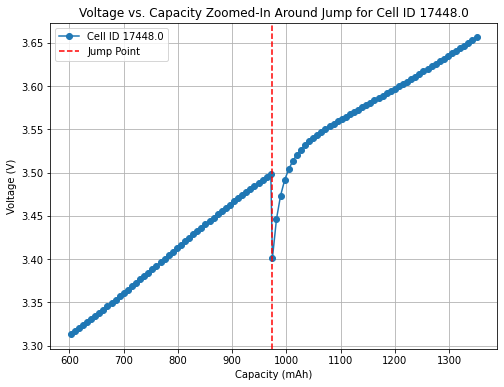

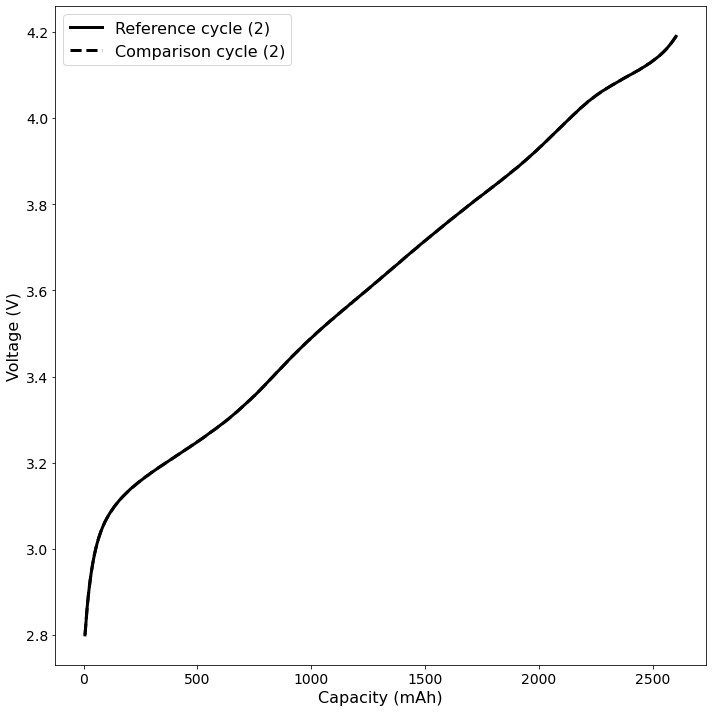

Identifying voltage jumps in cells...
Cells with identified voltage jumps: []
Selected cells for detailed analysis: []
Analyzing voltage jumps before smoothing...


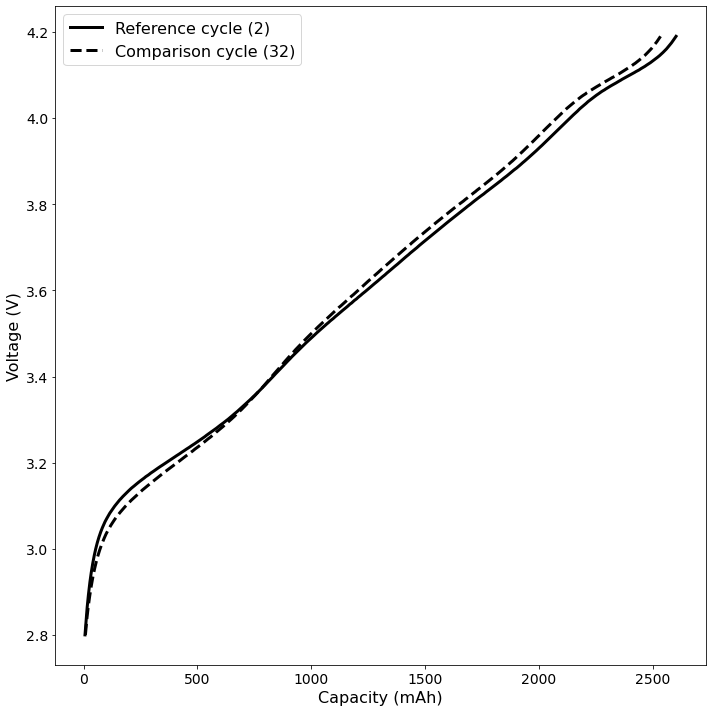

Identifying voltage jumps in cells...
Cell ID 17478.0 has potential voltage jumps at indices [25537]


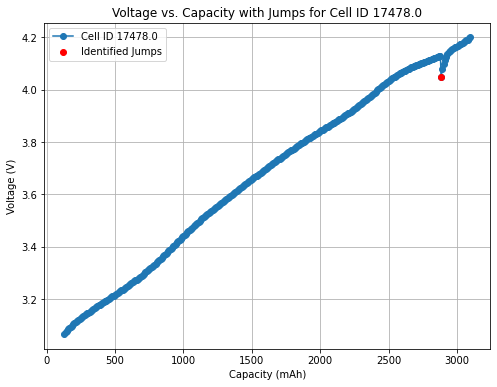

Cell ID 17479.0 has potential voltage jumps at indices [25867]


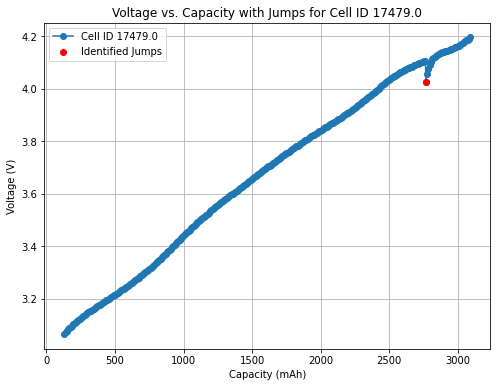

Cell ID 17480.0 has potential voltage jumps at indices [26133]


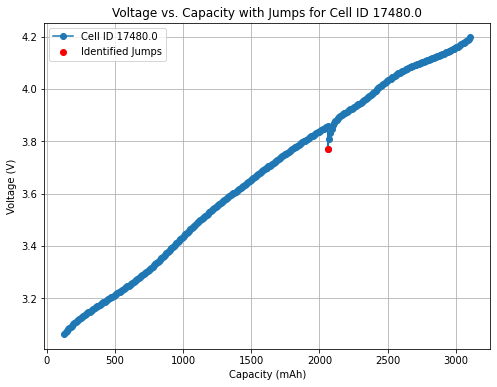

Cell ID 17481.0 has potential voltage jumps at indices [26448]


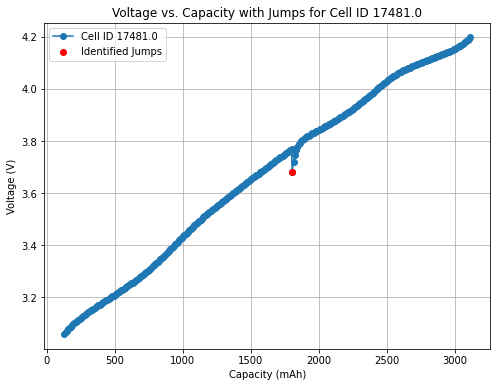

Cell ID 17663.0 has potential voltage jumps at indices [29763]


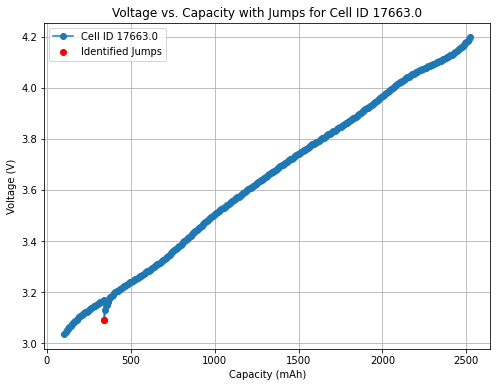

Cells with identified voltage jumps: [17478.0, 17479.0, 17480.0, 17481.0, 17663.0]
Selected cells for detailed analysis: [17478.0, 17479.0, 17480.0]
Analyzing voltage jumps before smoothing...
Zoomed-in view around jump for Cell ID 17478.0, Index 25537:
       test_vol     capacity
25487    4.0008  2425.368534
25488    4.0051  2434.622134
25489    4.0088  2443.875734
25490    4.0132  2453.129334
25491    4.0169  2462.382934
...         ...          ...
25556    4.1846  3059.147592
25557    4.1877  3068.401192
25558    4.1914  3077.654792
25559    4.1954  3086.908391
25560    4.1992  3096.161991

[74 rows x 2 columns]


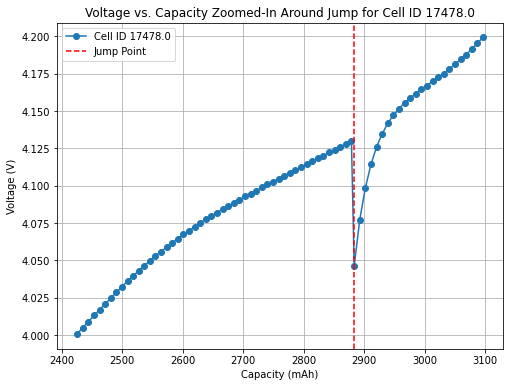

Zoomed-in view around jump for Cell ID 17479.0, Index 25867:
       test_vol     capacity
25817    3.9530  2310.892108
25818    3.9567  2320.131980
25819    3.9608  2329.371853
25820    3.9645  2338.611725
25821    3.9688  2347.851598
...         ...          ...
25898    4.1806  3052.576672
25899    4.1843  3061.816544
25900    4.1877  3071.056417
25901    4.1917  3080.296289
25902    4.1958  3089.536162

[86 rows x 2 columns]


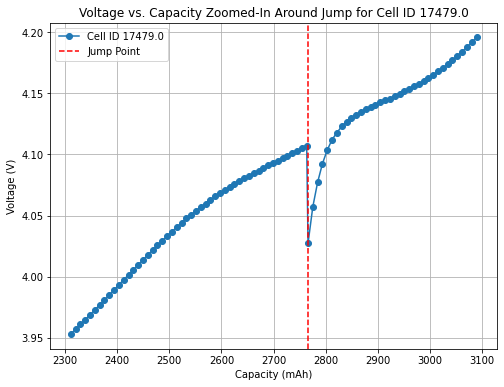

Zoomed-in view around jump for Cell ID 17480.0, Index 26133:
       test_vol     capacity
26083    3.6960  1608.350196
26084    3.6994  1617.588279
26085    3.7034  1626.826361
26086    3.7069  1636.064444
26087    3.7106  1645.302527
...         ...          ...
26179    4.0249  2486.984240
26180    4.0290  2496.222323
26181    4.0324  2505.460406
26182    4.0361  2514.698488
26183    4.0395  2523.936571

[101 rows x 2 columns]


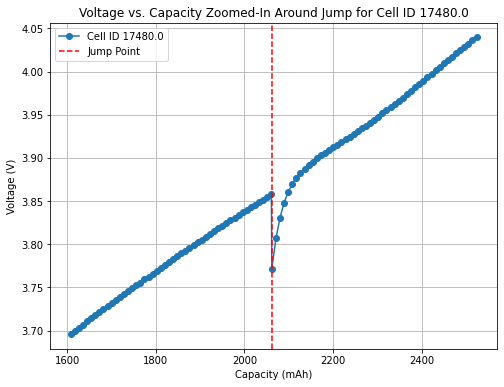

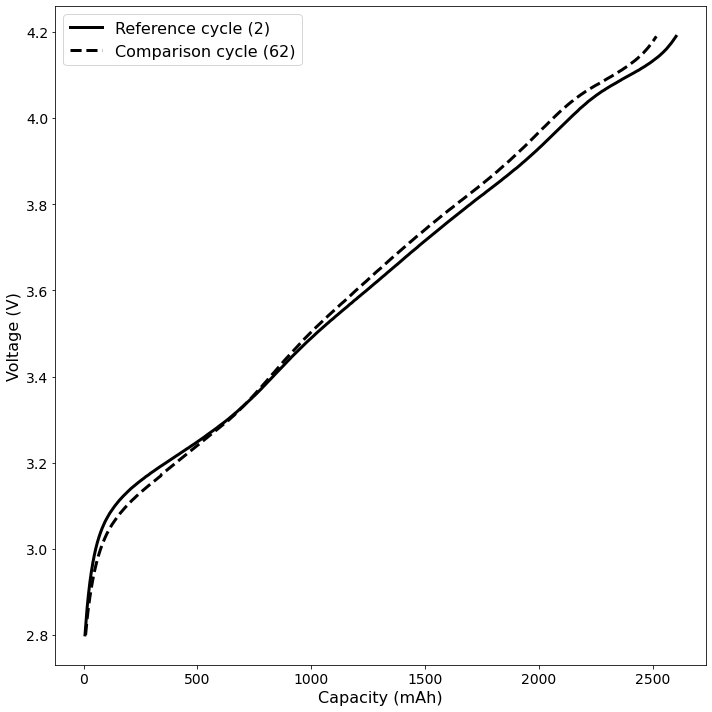

Identifying voltage jumps in cells...
Cells with identified voltage jumps: []
Selected cells for detailed analysis: []
Analyzing voltage jumps before smoothing...


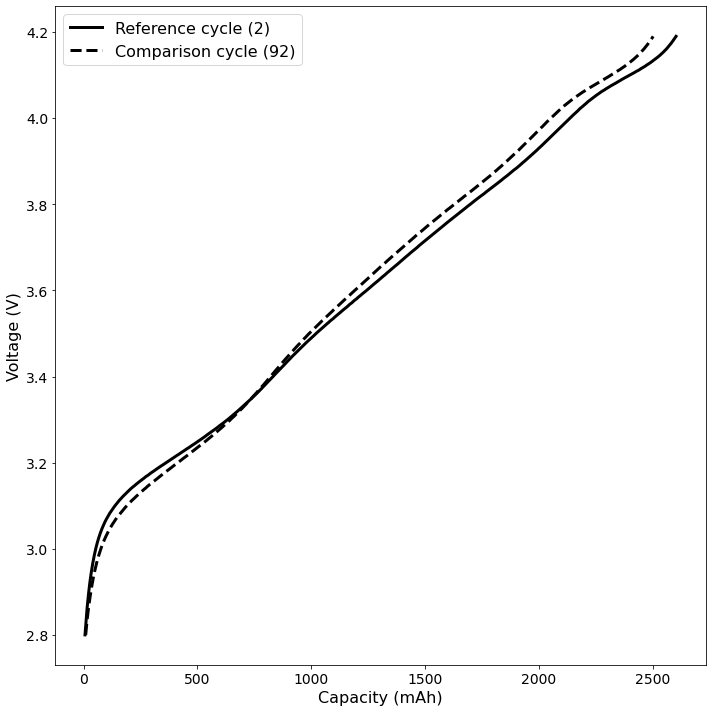

Identifying voltage jumps in cells...
Cells with identified voltage jumps: []
Selected cells for detailed analysis: []
Analyzing voltage jumps before smoothing...


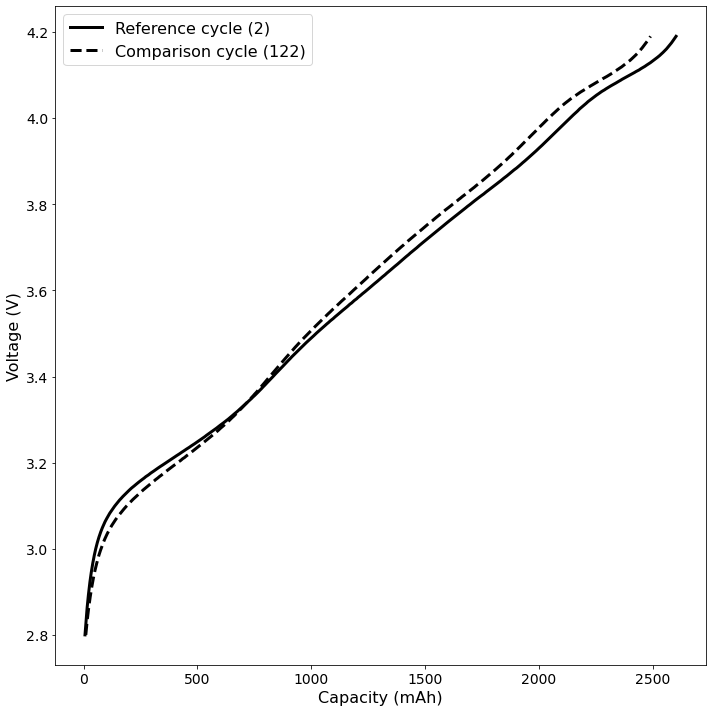

In [104]:
reference_cycle_for_chg_delta_q = 2
reference_sub_sequence_num = 1
cycles_for_chg_delta_q = [32, 62, 92, 122]
# cycles_for_delta_q = [32, 122]
all_chg_delta_q_cycles = [reference_cycle_for_delta_q] + cycles_for_delta_q
print(all_chg_delta_q_cycles)


all_volt_chg_cap_dfs = {} # { cycle_num: sub_sequence_volt_cap_df }

for cycle in all_chg_delta_q_cycles:
    sub_sequence_volt_chg_cap_df = create_voltage_to_chg_capacity_df(all_cycles_sub_sequences_norm_dfs[cycle][reference_sub_sequence_num-1])
    all_volt_chg_cap_dfs[cycle] = sub_sequence_volt_chg_cap_df
    plot_enhanced_example(all_volt_chg_cap_dfs[reference_cycle_for_chg_delta_q], all_volt_chg_cap_dfs[cycle], reference_cycle_for_chg_delta_q, cycle)

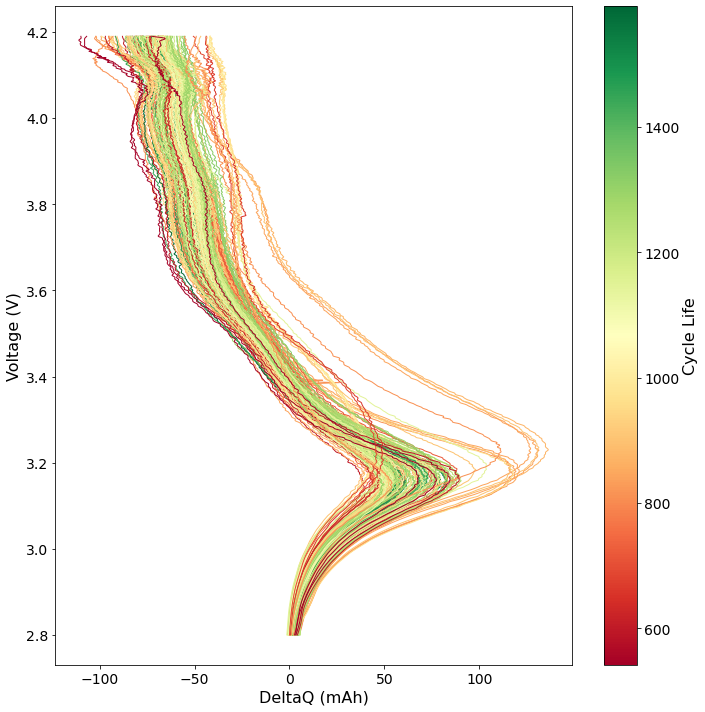

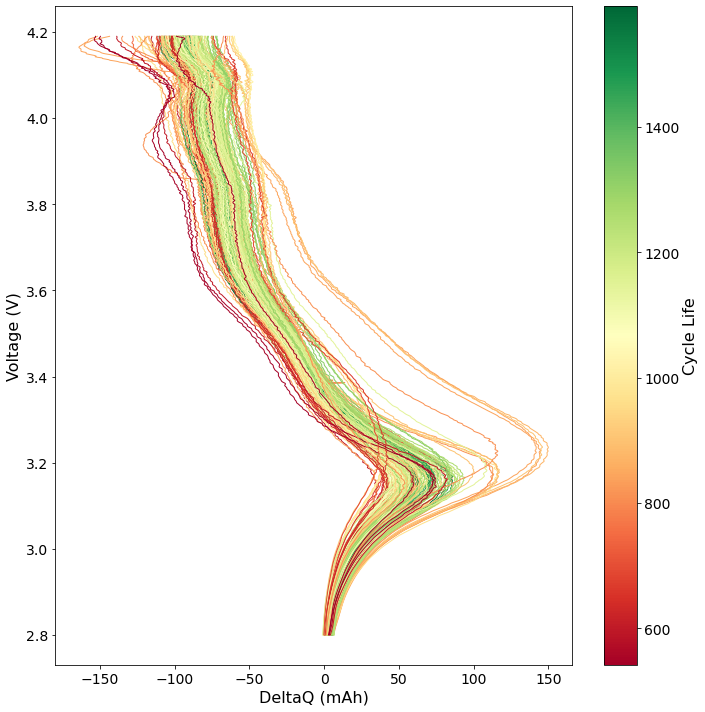

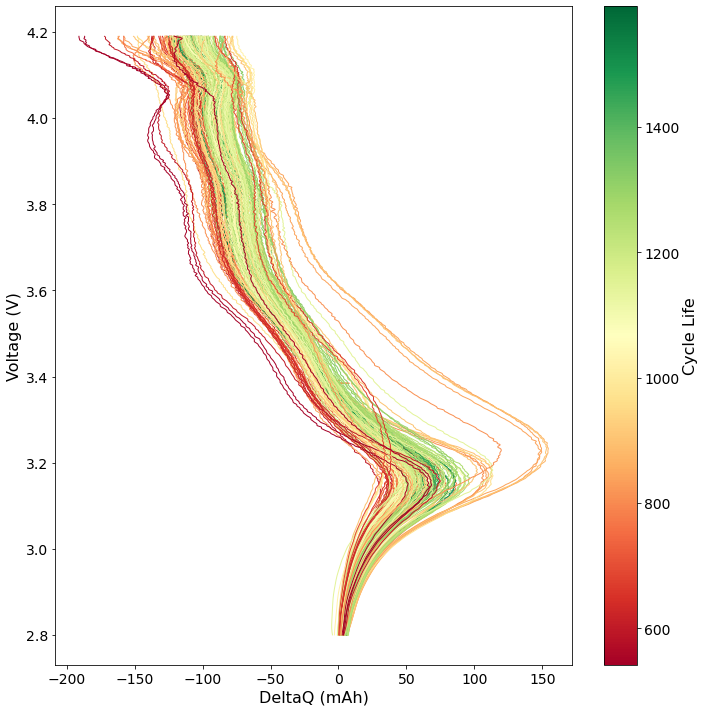

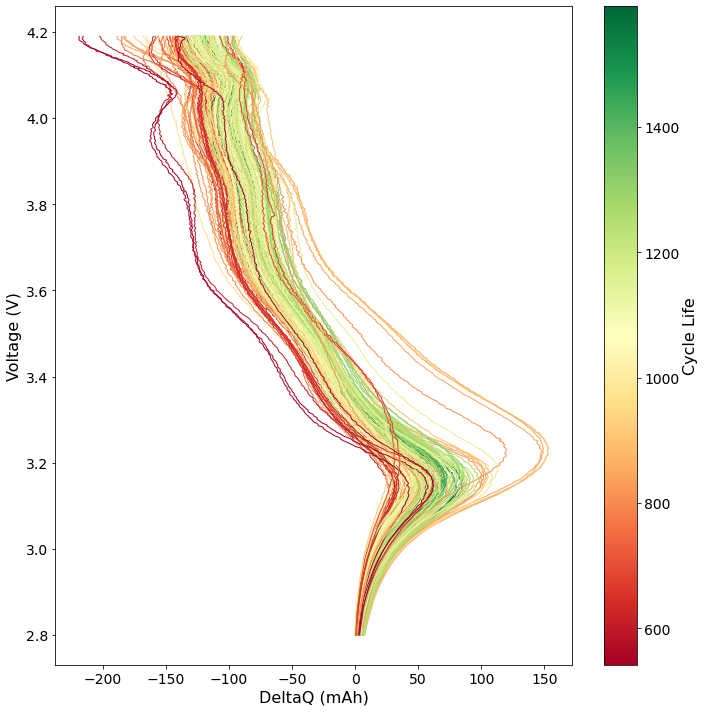

In [105]:
all_chg_delta_q_dfs = {} # { cycle_num: delta_q_df }

for cycle in cycles_for_chg_delta_q:
    chg_delta_q_df = create_delta_q(reference_cycle_for_chg_delta_q, cycle, all_volt_chg_cap_dfs)
    all_chg_delta_q_dfs[cycle] = chg_delta_q_df
    chg_delta_q_features_df = create_chg_delta_q_features_df(chg_delta_q_df, cycle, reference_cycle_for_chg_delta_q)
    master_table = master_table.join(chg_delta_q_features_df)
    plot_together_all_delta_q(all_chg_delta_q_dfs[cycle], cycle, master_table)

In [106]:
master_table

,cycle_life,class,test_id,group,cap_chg_122,cap_chg_2,cap_chg_32,cap_chg_62,cap_chg_92,cap_dchg_122,cap_dchg_2,cap_dchg_32,cap_dchg_62,cap_dchg_92,cc_cap_ratio_122,cc_cap_ratio_2,cc_cap_ratio_32,cc_cap_ratio_62,cc_cap_ratio_92,cc_ratio_122,cc_ratio_2,cc_ratio_32,cc_ratio_62,cc_ratio_92,curr_chg_122,curr_chg_2,curr_chg_32,curr_chg_62,curr_chg_92,curr_dchg_122,curr_dchg_2,curr_dchg_32,curr_dchg_62,curr_dchg_92,engy_chg_122,engy_chg_2,engy_chg_32,engy_chg_62,engy_chg_92,engy_dchg_122,engy_dchg_2,engy_dchg_32,engy_dchg_62,engy_dchg_92,ocv_drop_chg_122,ocv_drop_chg_2,ocv_drop_chg_32,ocv_drop_chg_62,ocv_drop_chg_92,ocv_drop_dchg_122,ocv_drop_dchg_2,ocv_drop_dchg_32,ocv_drop_dchg_62,ocv_drop_dchg_92,r_chg_122,r_chg_2,r_chg_32,r_chg_62,r_chg_92,r_chg_end_122,r_chg_end_2,r_chg_end_32,r_chg_end_62,r_chg_end_92,r_dchg_122,r_dchg_2,r_dchg_32,r_dchg_62,r_dchg_92,r_dchg_end_122,r_dchg_end_2,r_dchg_end_32,r_dchg_end_62,r_dchg_end_92,retention_122,retention_2,retention_32,retention_62,retention_92,t1_max_122,t1_max_2,t1_max_32,t1_max_62,t1_max_92,t1_min_122,t1_min_2,t1_min_32,t1_min_62,t1_min_92,v_max_122,v_max_2,v_max_32,v_max_62,v_max_92,v_min_122,v_min_2,v_min_32,v_min_62,v_min_92,v_rest_before_chg_122,v_rest_before_chg_2,v_rest_before_chg_32,v_rest_before_chg_62,v_rest_before_chg_92,v_rest_before_dchg_122,v_rest_before_dchg_2,v_rest_before_dchg_32,v_rest_before_dchg_62,v_rest_before_dchg_92,std_shapelets_32_sub_sequence_1_0,std_shapelets_32_sub_sequence_1_1,std_shapelets_32_sub_sequence_1_2,std_shapelets_32_sub_sequence_1_3,std_shapelets_32_sub_sequence_1_4,std_shapelets_32_sub_sequence_1_5,std_shapelets_32_sub_sequence_1_6,std_shapelets_32_sub_sequence_1_7,std_shapelets_32_sub_sequence_1_8,std_shapelets_32_sub_sequence_1_9,std_shapelets_32_sub_sequence_2_0,std_shapelets_32_sub_sequence_2_1,std_shapelets_32_sub_sequence_2_2,std_shapelets_32_sub_sequence_2_3,std_shapelets_32_sub_sequence_2_4,std_shapelets_32_sub_sequence_2_5,std_shapelets_32_sub_sequence_2_6,std_shapelets_32_sub_sequence_2_7,std_shapelets_32_sub_sequence_2_8,std_shapelets_32_sub_sequence_2_9,std_shapelets_32_sub_sequence_3_0,std_shapelets_32_sub_sequence_3_1,std_shapelets_32_sub_sequence_3_2,std_shapelets_32_sub_sequence_3_3,std_shapelets_32_sub_sequence_3_4,std_shapelets_32_sub_sequence_3_5,std_shapelets_32_sub_sequence_3_6,std_shapelets_32_sub_sequence_3_7,std_shapelets_32_sub_sequence_3_8,std_shapelets_32_sub_sequence_3_9,std_shapelets_32_sub_sequence_4_0,std_shapelets_32_sub_sequence_4_1,std_shapelets_32_sub_sequence_4_2,std_shapelets_32_sub_sequence_4_3,std_shapelets_32_sub_sequence_4_4,std_shapelets_32_sub_sequence_4_5,std_shapelets_32_sub_sequence_4_6,std_shapelets_32_sub_sequence_4_7,std_shapelets_32_sub_sequence_4_8,std_shapelets_32_sub_sequence_4_9,std_shapelets_32_sub_sequence_5_0,std_shapelets_32_sub_sequence_5_1,std_shapelets_32_sub_sequence_5_2,std_shapelets_32_sub_sequence_5_3,std_shapelets_32_sub_sequence_5_4,std_shapelets_32_sub_sequence_5_5,std_shapelets_32_sub_sequence_5_6,std_shapelets_32_sub_sequence_5_7,std_shapelets_32_sub_sequence_5_8,std_shapelets_32_sub_sequence_5_9,std_shapelets_122_sub_sequence_1_0,std_shapelets_122_sub_sequence_1_1,std_shapelets_122_sub_sequence_1_2,std_shapelets_122_sub_sequence_1_3,std_shapelets_122_sub_sequence_1_4,std_shapelets_122_sub_sequence_1_5,std_shapelets_122_sub_sequence_1_6,std_shapelets_122_sub_sequence_1_7,std_shapelets_122_sub_sequence_1_8,std_shapelets_122_sub_sequence_1_9,std_shapelets_122_sub_sequence_2_0,std_shapelets_122_sub_sequence_2_1,std_shapelets_122_sub_sequence_2_2,std_shapelets_122_sub_sequence_2_3,std_shapelets_122_sub_sequence_2_4,std_shapelets_122_sub_sequence_2_5,std_shapelets_122_sub_sequence_2_6,std_shapelets_122_sub_sequence_2_7,std_shapelets_122_sub_sequence_2_8,std_shapelets_122_sub_sequence_2_9,std_shapelets_122_sub_sequence_3_0,std_shapelets_122_sub_sequence_3_1,std_shapelets_122_sub_sequence_3_2,std_shapelets_122_sub_sequence_3_3,std_shapelets_122_sub_sequence_3_4,std_shapelets_122_sub_s

Correlation (Var vs. Cycle Life): -0.661868046152526
Correlation (Log(Var) vs. Log(Cycle Life)): -0.6410328439767631
Correlation (Min vs. Cycle Life): 0.6066957041200292


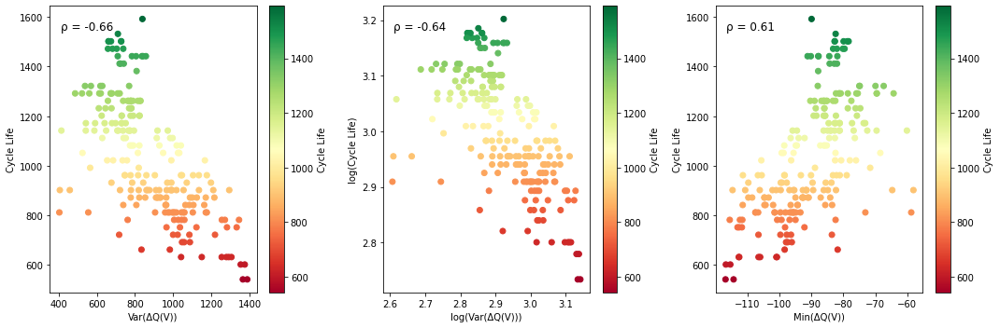

In [107]:
plot_dchg_delta_q_features_vs_cycle_life(master_table, cycle_for_delta_q=122, reference_cycle_for_delta_q=2)

Correlation (Var vs. Cycle Life): -0.2547982092663836
Correlation (Log(Var) vs. Log(Cycle Life)): -0.2630752510344628
Correlation (Min vs. Cycle Life): 0.5103435498217123


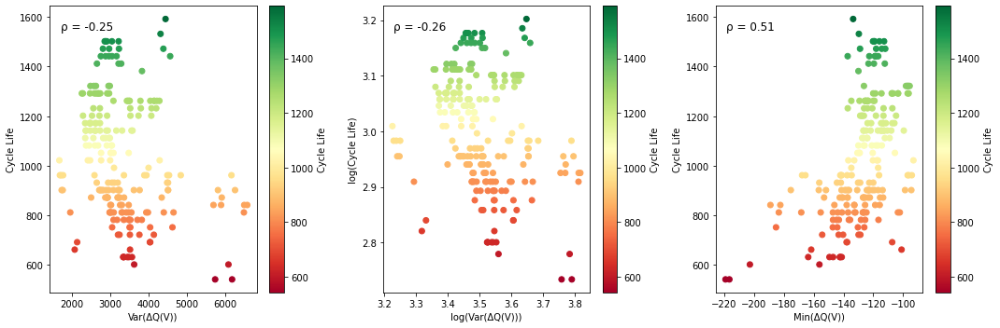

In [108]:
plot_chg_delta_q_features_vs_cycle_life(master_table, cycle_for_delta_q=122, reference_cycle_for_delta_q=2)

In [109]:
# plot_separately_all_delta_q(all_delta_q_dfs)

In [110]:
# plot_separately_all_delta_q(all_chg_delta_q_dfs)

# Modeling

## Helper functions

In [111]:
def run_RF_classifier(X_train, X_test, y_train, y_test, feature_name, group_ids_train):

    # Print feature set name
    print("Feature Set:", feature_name)
        
    # Define the parameter grid to search
    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4, 10],
        'max_features': ['sqrt', 'log2']
    }
    # Create a RandomForestClassifier
    RF_clf = RandomForestClassifier(random_state=42)

    # Create GroupShuffleSplit
    group_shuffle_split = GroupShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

    # Create GridSearchCV with GroupShuffleSplit
    grid_search = GridSearchCV(estimator=RF_clf, param_grid=param_grid, cv=group_shuffle_split, scoring='accuracy', n_jobs=-1)

    # Perform the grid search using the training data
    grid_search.fit(X_train, y_train, groups=group_ids_train)

    # Get the best parameters and the best score
    best_params = grid_search.best_params_
    best_mean_score = grid_search.best_score_ * 100
    best_std_score = grid_search.cv_results_['std_test_score'][grid_search.best_index_] * 100

    # Print the best parameters and the best score
    print("Best Parameters:", best_params)
    print("Train Mean Score of Best Parameters:", best_mean_score)
    print("Train Standard Deviation Score of Best Parameters:", best_std_score)

    # Use the best estimator to make predictions on the test set
    best_RF_clf = grid_search.best_estimator_
    test_score_RF_clf = best_RF_clf.score(X_test,y_test) * 100
    print("Test Score:", test_score_RF_clf)
    y_pred_RF = best_RF_clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred_RF)

    # Print confusion matrix
    print("Confusion Matrix:")
    print(cm)
    
    # Extract the False Positives (FP) and True Negatives (TN)
    tn, fp, fn, tp = cm.ravel()

    # Calculate the False Positive Rate (FPR)
    fpr = fp / (fp + tn) * 100

    # Print the False Positive Rate percentage
    print("False Positive Rate (FPR):", fpr)
    
    # Store the results in a dictionary
    results = {
        'Features': feature_name,
        'Model': 'RandomForestClassifier',
        'Train Accuracy Mean [%]': round(best_mean_score, 1),
        'Train Accuracy Std Dev [%]': round(best_std_score, 1),
        'Test Accuracy [%]': round(test_score_RF_clf, 1),
        'Test False Positive Rate [%]': round(fpr, 1)
    }
        
    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()
    
    # Extract feature importances and map them to feature names
    feature_importances = best_RF_clf.feature_importances_
    feature_importance_map = {X_train.columns[i]: feature_importances[i] for i in range(len(X_train.columns))}
    
    # Filter out features with importance below threshold
    filtered_importances = {key: value for key, value in feature_importance_map.items() if value >= 0.005}
    
    # Sort feature importances by importance value (descending)
    sorted_features = sorted(filtered_importances, key=filtered_importances.get, reverse=True)
    
    # Print feature importances with column names sorted by importance
    # print("Feature Importances:")
    # for feature in sorted_features:
    #     print(f"Feature '{feature}': {filtered_importances[feature]:.4f}")
    
    # Plot feature importances sorted by importance
    plt.figure(figsize=(12, max(6, len(sorted_features) * 0.3)))  # Adjust height based on number of features
    sns.barplot(
    x=[filtered_importances[feature] for feature in sorted_features],
    y=sorted_features,
    color="blue"  # Solid single color
    )   
    plt.title('Feature Importances')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.tight_layout()  # Ensure labels are not cut off
    plt.show()
    
    return results


In [112]:
def run_elastic_net_classifier(X_train, X_test, y_train, y_test, feature_name, group_ids_train):
    
    print(feature_name)
    
    # Scale the data using MinMaxScaler
    X_train, X_test = scale_data_minmax(X_train, X_test)

    # Define the parameter grid to search
    param_grid = {
        'C': [0.001, 0.01, 0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.7, 0.9, 1.0]
    }

    # Create a LogisticRegression classifier with Elastic Net regularization
    EN_clf = LogisticRegression(penalty='elasticnet', solver='saga', random_state=42, max_iter=1000000000)

    # Create GroupShuffleSplit for cross-validation
    group_shuffle_split = GroupShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

    # Create GridSearchCV with GroupShuffleSplit
    grid_search = GridSearchCV(estimator=EN_clf, param_grid=param_grid, cv=group_shuffle_split, scoring='accuracy', n_jobs=-1)

    # Perform the grid search
    grid_search.fit(X_train, y_train, groups=group_ids_train)

    # Get the best parameters and the best score
    best_params = grid_search.best_params_
    best_mean_score = grid_search.best_score_ * 100
    best_std_score = grid_search.cv_results_['std_test_score'][grid_search.best_index_] * 100

    # Print the best parameters and the best score
    print("Best Parameters:", best_params)
    print("Train Mean Score of Best Parameters:", best_mean_score)
    print("Train Standard Deviation Score of Best Parameters:", best_std_score)

    # Use the best estimator to make predictions
    best_EN_clf = grid_search.best_estimator_
    test_score_EN_clf = best_EN_clf.score(X_test, y_test) * 100
    print("Test Score:", test_score_EN_clf)
    y_pred_EN = best_EN_clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred_EN)

    # Print confusion matrix
    print("Confusion Matrix:")
    print(cm)
    
    # Extract the False Positives (FP) and True Negatives (TN)
    tn, fp, fn, tp = cm.ravel()

    # Calculate the False Positive Rate (FPR)
    fpr = fp / (fp + tn) * 100

    # Print the False Positive Rate percentage
    print("False Positive Rate (FPR):", fpr)
    
    # Store the results in a dictionary
    results = {
        'Features': feature_name,
        'Model': 'ElasticNetClassifier',
        'Train Accuracy Mean [%]': round(best_mean_score, 1),
        'Train Accuracy Std Dev [%]': round(best_std_score, 1),
        'Test Accuracy [%]': round(test_score_EN_clf, 1),
        'Test False Positive Rate [%]': round(fpr, 1)
    }

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

    # NEW: Extract feature coefficients
    coefficients = best_EN_clf.coef_[0]  # Coefficients for binary classification

    # Create a DataFrame to easily interpret the coefficients
    coef_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Coefficient': coefficients
    })

    # Filter non-zero coefficients to see which features were selected
    selected_features = coef_df[coef_df['Coefficient'] != 0]

    # NEW: Show only the Top N features by magnitude of coefficient
    N = 20  # Show top 20 features by absolute value
    top_features = selected_features.reindex(selected_features['Coefficient'].abs().nlargest(N).index)

    # Print the selected features
    # print(f"Top {N} Selected Features (non-zero coefficients):")
    # print(top_features)

    # Plot only the top N features
    plt.figure(figsize=(10, 6))
    sns.barplot(
    x='Coefficient',
    y='Feature',
    data=top_features.sort_values(by='Coefficient', ascending=False),
    color="blue"  # Use a solid blue color
    )
    plt.title(f"Top {N} Feature Coefficients for {feature_name} (Elastic Net)")
    plt.tight_layout()
    plt.show()

    return results

In [113]:
def run_RF_regressor(X_train, X_test, y_train, y_test, feature_name, group_ids_train):

    print(feature_name)
    
    # Define the parameter grid to search
    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['sqrt', 'log2']

    }

    # Create a RandomForestRegressor
    RF_reg = RandomForestRegressor(random_state=42)

    # Create GroupShuffleSplit
    group_shuffle_split = GroupShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

    # Create GridSearchCV with RMSE scoring
    grid_search = GridSearchCV(estimator=RF_reg, param_grid=param_grid, cv=group_shuffle_split, scoring=rmse_scorer, n_jobs=-1)

    # Perform the grid search
    grid_search.fit(X_train, y_train, groups=group_ids_train)

    # Get the best parameters and the best score
    best_params = grid_search.best_params_
    best_mean_score = -grid_search.best_score_
    best_std_score = grid_search.cv_results_['std_test_score'][grid_search.best_index_]

    # Print the best parameters and the best score
    print("Best Parameters:", best_params)
    print("Train Mean Score of Best Parameters:", best_mean_score)
    print("Train Standard Deviation Score of Best Parameters:", best_std_score)

    # Use the best estimator to make predictions
    best_RF_reg = grid_search.best_estimator_
    y_pred_RF = best_RF_reg.predict(X_test)

    # Calculate R^2 score
    r2_RF = r2_score(y_test, y_pred_RF)
    print("Test R^2 Score:", r2_RF)

    # Calculate RMSE
    mse_RF = mean_squared_error(y_test, y_pred_RF)
    rmse_RF = np.sqrt(mse_RF)
    print("Test Root Mean Squared Error:", rmse_RF)

    # Calculate the percent error for each prediction
    percent_errors_RF = np.abs((y_test - y_pred_RF) / y_test) * 100

    # Calculate the mean percent error
    mean_percent_error_RF = np.mean(percent_errors_RF)
    print("Test Mean Percent Error:", mean_percent_error_RF)
        
    # Store the results in a dictionary
    results = {
        'Features': feature_name,
        'Model': 'RandomForestRegressor',
        'Train RMSE Mean [Cycles]': round(best_mean_score,0),
        'Train RMSE Std Dev [Cycles]': round(best_std_score,0),
        'Test RMSE [Cycles]': round(rmse_RF,0),
        'Test Mean Precent Error [%]': mean_percent_error_RF
        
    }
    
    # Visualize Actual vs Predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test.values, y_pred_RF, color='blue', alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_test.values.min(), y_test.values.max()], [y_test.values.min(), y_test.values.max()], color='red', linestyle='--', label='Ideal line')
    plt.title('Actual vs Predicted')
    plt.xlabel('Actual values (y_test)')
    plt.ylabel('Predicted values (y_pred)')
    plt.legend()
    plt.show()
    
    # Residual Plot
    residuals = y_test - y_pred_RF
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred_RF, residuals, color='blue', alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residual Plot')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    plt.show()
    
    # Extract feature importances and map them to feature names
    feature_importances = best_RF_reg.feature_importances_
    feature_importance_map = {X_train.columns[i]: feature_importances[i] for i in range(len(X_train.columns))}
    
    # Filter out features with importance below threshold
    filtered_importances = {key: value for key, value in feature_importance_map.items() if value >= 0.005}
    
    # Sort feature importances by importance value (descending)
    sorted_features = sorted(filtered_importances, key=filtered_importances.get, reverse=True)
    
    # Print feature importances with column names sorted by importance
    # print("Feature Importances:")
    # for feature in sorted_features:
    #     print(f"Feature '{feature}': {filtered_importances[feature]:.4f}")
    
    # Plot feature importances sorted by importance
    plt.figure(figsize=(12, max(6, len(sorted_features) * 0.3)))  # Adjust height based on number of features
    sns.barplot(
    x=[filtered_importances[feature] for feature in sorted_features],
    y=sorted_features,
    color="blue"  # Solid single color
    ) 
    plt.title('Feature Importances')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.tight_layout()  # Ensure labels are not cut off
    plt.show()
    
    return results

In [114]:
def run_elastic_net_regressor (X_train, X_test, y_train, y_test, feature_name, group_ids_train):

    print(feature_name)
    
    X_train, X_test = scale_data_minmax(X_train, X_test)

    # Define the parameter grid to search
    param_grid = {
        'alpha': [0.001, 0.01, 0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.7, 0.9, 1.0]
    }

    # Create an ElasticNet regressor
    EN_reg = ElasticNet(random_state=42, max_iter=1000000000)
  
    # Create GroupShuffleSplit
    group_shuffle_split = GroupShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

    # Create GridSearchCV with GroupShuffleSplit
    grid_search = GridSearchCV(estimator=EN_reg, param_grid=param_grid, cv=group_shuffle_split, scoring=rmse_scorer, n_jobs=-1)
    
    # Perform the grid search
    grid_search.fit(X_train, y_train, groups=group_ids_train)

    # Get the best parameters and the best score
    best_params = grid_search.best_params_
    best_mean_score = -grid_search.best_score_  # RMSE is negative, so invert it
    best_std_score = grid_search.cv_results_['std_test_score'][grid_search.best_index_]

    # Print the best parameters and the best score
    print("Best Parameters:", best_params)
    print("Train Mean Score of Best Parameters:", best_mean_score)
    print("Train Standard Deviation Score of Best Parameters:", best_std_score)

    # Use the best estimator to make predictions
    best_EN_reg = grid_search.best_estimator_
    y_pred_EN = best_EN_reg.predict(X_test)

    # Calculate R^2 score
    r2_EN = r2_score(y_test, y_pred_EN)
    print("Test R^2 Score:", r2_EN)

    # Calculate RMSE
    mse_EN = mean_squared_error(y_test, y_pred_EN)
    rmse_EN = np.sqrt(mse_EN)
    print("Test Root Mean Squared Error:", rmse_EN)

    # Calculate the percent error for each prediction
    percent_errors_EN = np.abs((y_test - y_pred_EN) / y_test) * 100

    # Calculate the mean percent error
    mean_percent_error_EN = np.mean(percent_errors_EN)
    print("Test Mean Percent Error:", mean_percent_error_EN)
    
    # Store the results in a dictionary
    results = {
        'Features': feature_name,
        'Model': 'ElasticNetRegressor',
        'Train RMSE Mean [Cycles]': round(best_mean_score, 0),
        'Train RMSE Std Dev [Cycles]': round(best_std_score, 0),
        'Test RMSE [Cycles]': round(rmse_EN, 0),
        'Test Mean Precent Error [%]': mean_percent_error_EN
    }
    
    # Visualize Actual vs Predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test.values, y_pred_EN, color='blue', alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_test.values.min(), y_test.values.max()], [y_test.values.min(), y_test.values.max()], color='red', linestyle='--', label='Ideal line')
    plt.title('Actual vs Predicted')
    plt.xlabel('Actual values (y_test)')
    plt.ylabel('Predicted values (y_pred)')
    plt.legend()
    plt.show()
    
    # Residual Plot
    residuals = y_test - y_pred_EN
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred_EN, residuals, color='blue', alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Residual Plot')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    plt.show()

    # NEW: Extract feature coefficients
    coefficients = best_EN_reg.coef_  # Coefficients for regression

    # Create a DataFrame to easily interpret the coefficients
    coef_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Coefficient': coefficients
    })

    # Filter non-zero coefficients to see which features were selected
    selected_features = coef_df[coef_df['Coefficient'] != 0]

    # NEW: Show only the Top N features by magnitude of coefficient
    N = 20  # Show top 20 features by absolute value
    top_features = selected_features.reindex(selected_features['Coefficient'].abs().nlargest(N).index)

    # Print the selected features
    # print(f"Top {N} Selected Features (non-zero coefficients):")
    # print(top_features)

    # Plot only the top N features
    plt.figure(figsize=(10, 6))
    sns.barplot(
    x='Coefficient',
    y='Feature',
    data=top_features.sort_values(by='Coefficient', ascending=False),
    color="blue"  # Use a solid blue color
    )
    plt.title(f"Top {N} Feature Coefficients for {feature_name} (Elastic Net)")
    plt.tight_layout()
    plt.show()

    return results

In [115]:
def plot_model_accuracy(data, model_name, save_path_excel, save_path_image):
    model_data = data[data['Model'] == model_name]
    x = model_data['Features']
    train_mean = model_data['Train Accuracy Mean [%]']
    train_std = model_data['Train Accuracy Std Dev [%]']
    test_accuracy = model_data['Test Accuracy [%]']

    fig, ax = plt.subplots(figsize=(12, 6))

    # Bar width
    bar_width = 0.35

    # Index for features
    index = range(len(x))

    # Plotting
    bar1 = ax.bar(index, train_mean, bar_width, yerr=train_std, label='Train', capsize=5, color='b')
    bar2 = ax.bar([i + bar_width for i in index], test_accuracy, bar_width, label='Test', color='k')

    # Add value labels above the test bars
    for bar in bar2:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2, 
            height, 
            f'{height:.2f}', 
            ha='center', 
            va='bottom'
        )

    # Add value labels above the train bars
    for bar in bar1:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2, 
            height, 
            f'{height:.2f}', 
            ha='center', 
            va='bottom'
        )

    ax.set_xlabel('Features Combination')
    ax.set_ylabel('Accuracy [%]')
    ax.set_title(f'Accuracy for {model_name}')
    ax.set_xticks([i + bar_width / 2 for i in index])
    ax.set_xticklabels(x, rotation=45, ha='right')

    # Adjust legend position
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

    plt.tight_layout()  # Adjust subplots to fit into figure area.

    # Save plot as image
    plt.savefig(save_path_image)

    # Save plot
    plt.show()

    # Save DataFrame to Excel
    data.to_excel(save_path_excel, index=False)


In [116]:
def plot_false_positive_rate(data, model_name, save_path_image):
    model_data = data[data['Model'] == model_name]
    x = model_data['Features']
    false_positive_rate = model_data['Test False Positive Rate [%]']

    fig, ax = plt.subplots(figsize=(12, 6))

    # Bar width
    bar_width = 0.35

    # Index for features
    index = range(len(x))

    # Plotting
    bars = ax.bar(index, false_positive_rate, bar_width, capsize=5, color='k')

    # Add value labels above bars
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2, 
            height, 
            f'{height:.2f}', 
            ha='center', 
            va='bottom'
        )

    ax.set_xlabel('Features Combination')
    ax.set_ylabel('False Positive Rate [%]')
    ax.set_title(f'Test False Positive Rate for {model_name}')
    ax.set_xticks(index)
    ax.set_xticklabels(x, rotation=45, ha='right')

    plt.tight_layout()  # Adjust subplots to fit into figure area.

    # Save plot as image
    plt.savefig(save_path_image)

    # Save plot
    plt.show()


In [117]:
def plot_model_rmse(data, model_name, save_path_excel, save_path_image):
    model_data = data[data['Model'] == model_name]
    x = model_data['Features']
    train_mean = model_data['Train RMSE Mean [Cycles]']
    train_std = model_data['Train RMSE Std Dev [Cycles]']
    test_RMSE = model_data['Test RMSE [Cycles]']

    fig, ax = plt.subplots(figsize=(12, 6))

    # Bar width
    bar_width = 0.35

    # Index for features
    index = range(len(x))

    # Plotting
    bar1 = ax.bar(index, train_mean, bar_width, yerr=train_std, label='Train', capsize=5, color='b')
    bar2 = ax.bar([i + bar_width for i in index], test_RMSE, bar_width, label='Test', color='k')

    # Add value labels above the test bars
    for bar in bar2:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2, 
            height, 
            f'{height:.2f}', 
            ha='center', 
            va='bottom'
        )

    # Add value labels above the train bars
    for bar in bar1:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2, 
            height, 
            f'{height:.2f}', 
            ha='center', 
            va='bottom'
        )

    ax.set_xlabel('Features Combination')
    ax.set_ylabel('RMSE [Cycle]')
    ax.set_title(f'RMSE for {model_name}')
    ax.set_xticks([i + bar_width / 2 for i in index])
    ax.set_xticklabels(x, rotation=45, ha='right')

    # Adjust legend position
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

    plt.tight_layout()  # Adjust subplots to fit into figure area.

    # Save plot as image
    plt.savefig(save_path_image)

    # Save plot
    plt.show()

    # Save DataFrame to Excel
    data.to_excel(save_path_excel, index=False)


In [118]:

def plot_mean_percent_error(data, model_name, save_path_image):
    model_data = data[data['Model'] == model_name]
    x = model_data['Features']
    mean_percent_error = model_data['Test Mean Precent Error [%]']

    fig, ax = plt.subplots(figsize=(12, 6))

    # Bar width
    bar_width = 0.35

    # Index for features
    index = range(len(x))

    # Plotting
    bars = ax.bar(index, mean_percent_error, bar_width, capsize=5, color='k')

    # Add value labels above bars
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2, 
            height, 
            f'{height:.2f}', 
            ha='center', 
            va='bottom'
        )

    ax.set_xlabel('Features Combination')
    ax.set_ylabel('Mean Percent Error [%]')
    ax.set_title(f'Test Mean Percent Error for {model_name}')
    ax.set_xticks(index)
    ax.set_xticklabels(x, rotation=45, ha='right')

    plt.tight_layout()  # Adjust subplots to fit into figure area.

    # Save plot as image
    plt.savefig(save_path_image)

    # Save plot
    plt.show()

In [119]:
# Scaling function
def scale_data(X_train, X_test):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    return pd.DataFrame(X_train_scaled, columns=X_train.columns), pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [120]:
from sklearn.preprocessing import MinMaxScaler

def scale_data_minmax(X_train, X_test):
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    return pd.DataFrame(X_train_scaled, columns=X_train.columns), pd.DataFrame(X_test_scaled, columns=X_test.columns)


In [121]:
from sklearn.preprocessing import RobustScaler

def scale_data_robust(X_train, X_test):
    scaler = RobustScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    return pd.DataFrame(X_train_scaled, columns=X_train.columns), pd.DataFrame(X_test_scaled, columns=X_test.columns)


In [122]:
from sklearn.preprocessing import MaxAbsScaler

def scale_data_maxabs(X_train, X_test):
    scaler = MaxAbsScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    return pd.DataFrame(X_train_scaled, columns=X_train.columns), pd.DataFrame(X_test_scaled, columns=X_test.columns)

## Create features combinations

In [123]:
master_table.columns

Index(['cycle_life', 'class', 'test_id', 'group', 'cap_chg_122', 'cap_chg_2',
       'cap_chg_32', 'cap_chg_62', 'cap_chg_92', 'cap_dchg_122',
       ...
       '122-2_dchg_delta_q_var', '122-2_dchg_delta_q_min',
       '32-2_chg_delta_q_var', '32-2_chg_delta_q_min', '62-2_chg_delta_q_var',
       '62-2_chg_delta_q_min', '92-2_chg_delta_q_var', '92-2_chg_delta_q_min',
       '122-2_chg_delta_q_var', '122-2_chg_delta_q_min'],
      dtype='object', length=325)

In [124]:
# all features
X_train_all = master_table.loc[cell_ids_train].reset_index(drop=True).drop(columns=['cycle_life', 'class', 'test_id', 'group'])
X_test_all = master_table.loc[cell_ids_test].reset_index(drop=True).drop(columns=['cycle_life', 'class', 'test_id', 'group'])

In [125]:
# Save DataFrame to Excel
X_train_all.to_excel('X_train_all.xlsx', index=False)

In [126]:
# all features up to cycle 32
all_up_to_32_filter_strings = ['shapelets_122', '122-2', '92-2', '62-2', '_122', '_92', '_62' ]
all_up_to_32_filtered_columns = master_table.loc[:, master_table.columns.str.contains('|'.join(all_up_to_32_filter_strings))]

print(all_up_to_32_filtered_columns.columns)

X_train_up_to_32 = X_train_all.drop(columns=all_up_to_32_filtered_columns.columns)
X_test_up_to_32 = X_test_all.drop(columns=all_up_to_32_filtered_columns.columns)
X_train_up_to_32

Index(['cap_chg_122', 'cap_chg_62', 'cap_chg_92', 'cap_dchg_122',
       'cap_dchg_62', 'cap_dchg_92', 'cc_cap_ratio_122', 'cc_cap_ratio_62',
       'cc_cap_ratio_92', 'cc_ratio_122',
       ...
       '92-2_dchg_delta_q_var', '92-2_dchg_delta_q_min',
       '122-2_dchg_delta_q_var', '122-2_dchg_delta_q_min',
       '62-2_chg_delta_q_var', '62-2_chg_delta_q_min', '92-2_chg_delta_q_var',
       '92-2_chg_delta_q_min', '122-2_chg_delta_q_var',
       '122-2_chg_delta_q_min'],
      dtype='object', length=175)


,cap_chg_2,cap_chg_32,cap_dchg_2,cap_dchg_32,cc_cap_ratio_2,cc_cap_ratio_32,cc_ratio_2,cc_ratio_32,curr_chg_2,curr_chg_32,curr_dchg_2,curr_dchg_32,engy_chg_2,engy_chg_32,engy_dchg_2,engy_dchg_32,ocv_drop_chg_2,ocv_drop_chg_32,ocv_drop_dchg_2,ocv_drop_dchg_32,r_chg_2,r_chg_32,r_chg_end_2,r_chg_end_32,r_dchg_2,r_dchg_32,r_dchg_end_2,r_dchg_end_32,retention_2,retention_32,t1_max_2,t1_max_32,t1_min_2,t1_min_32,v_max_2,v_max_32,v_min_2,v_min_32,v_rest_before_chg_2,v_rest_before_chg_32,v_rest_before_dchg_2,v_rest_before_dchg_32,std_shapelets_32_sub_sequence_1_0,std_shapelets_32_sub_sequence_1_1,std_shapelets_32_sub_sequence_1_2,std_shapelets_32_sub_sequence_1_3,std_shapelets_32_sub_sequence_1_4,std_shapelets_32_sub_sequence_1_5,std_shapelets_32_sub_sequence_1_6,std_shapelets_32_sub_sequence_1_7,std_shapelets_32_sub_sequence_1_8,std_shapelets_32_sub_sequence_1_9,std_shapelets_32_sub_sequence_2_0,std_shapelets_32_sub_sequence_2_1,std_shapelets_32_sub_sequence_2_2,std_shapelets_32_sub_sequence_2_3,std_shapelets_32_sub_sequence_2_4,std_shapelets_32_sub_sequence_2_5,std_shapelets_32_sub_sequence_2_6,std_shapelets_32_sub_sequence_2_7,std_shapelets_32_sub_sequence_2_8,std_shapelets_32_sub_sequence_2_9,std_shapelets_32_sub_sequence_3_0,std_shapelets_32_sub_sequence_3_1,std_shapelets_32_sub_sequence_3_2,std_shapelets_32_sub_sequence_3_3,std_shapelets_32_sub_sequence_3_4,std_shapelets_32_sub_sequence_3_5,std_shapelets_32_sub_sequence_3_6,std_shapelets_32_sub_sequence_3_7,std_shapelets_32_sub_sequence_3_8,std_shapelets_32_sub_sequence_3_9,std_shapelets_32_sub_sequence_4_0,std_shapelets_32_sub_sequence_4_1,std_shapelets_32_sub_sequence_4_2,std_shapelets_32_sub_sequence_4_3,std_shapelets_32_sub_sequence_4_4,std_shapelets_32_sub_sequence_4_5,std_shapelets_32_sub_sequence_4_6,std_shapelets_32_sub_sequence_4_7,std_shapelets_32_sub_sequence_4_8,std_shapelets_32_sub_sequence_4_9,std_shapelets_32_sub_sequence_5_0,std_shapelets_32_sub_sequence_5_1,std_shapelets_32_sub_sequence_5_2,std_shapelets_32_sub_sequence_5_3,std_shapelets_32_sub_sequence_5_4,std_shapelets_32_sub_sequence_5_5,std_shapelets_32_sub_sequence_5_6,std_shapelets_32_sub_sequence_5_7,std_shapelets_32_sub_sequence_5_8,std_shapelets_32_sub_sequence_5_9,revised_shapelets_32_sub_sequence_1_0,revised_shapelets_32_sub_sequence_1_1,revised_shapelets_32_sub_sequence_1_2,revised_shapelets_32_sub_sequence_1_3,revised_shapelets_32_sub_sequence_1_4,revised_shapelets_32_sub_sequence_1_5,revised_shapelets_32_sub_sequence_1_6,revised_shapelets_32_sub_sequence_1_7,revised_shapelets_32_sub_sequence_1_8,revised_shapelets_32_sub_sequence_1_9,revised_shapelets_32_sub_sequence_2_0,revised_shapelets_32_sub_sequence_2_1,revised_shapelets_32_sub_sequence_2_2,revised_shapelets_32_sub_sequence_2_3,revised_shapelets_32_sub_sequence_2_4,revised_shapelets_32_sub_sequence_2_5,revised_shapelets_32_sub_sequence_2_6,revised_shapelets_32_sub_sequence_2_7,revised_shapelets_32_sub_sequence_2_8,revised_shapelets_32_sub_sequence_2_9,revised_shapelets_32_sub_sequence_3_0,revised_shapelets_32_sub_sequence_3_1,revised_shapelets_32_sub_sequence_3_2,revised_shapelets_32_sub_sequence_3_3,revised_shapelets_32_sub_sequence_3_4,revised_shapelets_32_sub_sequence_3_5,revised_shapelets_32_sub_sequence_3_6,revised_shapelets_32_sub_sequence_3_7,revised_shapelets_32_sub_sequence_3_8,revised_shapelets_32_sub_sequence_3_9,revised_shapelets_32_sub_sequence_4_0,revised_shapelets_32_sub_sequence_4_1,revised_shapelets_32_sub_sequence_4_2,revised_shapelets_32_sub_sequence_4_3,revised_shapelets_32_sub_sequence_4_4,revised_shapelets_32_sub_sequence_4_5,revised_shapelets_32_sub_sequence_4_6,revised_shapelets_32_sub_sequence_4_7,revised_shapelets_32_sub_sequence_4_8,revised_shapelets_32_sub_sequence_4_9,revised_shapelets_32_sub_sequence_5_0,revised_shapelets_32_sub_sequence_5_1,revised_shapelets_32_sub_sequence_5_2,revised_shapelets_32_sub_sequence_5_3,revised_shapelets_32_sub_sequence_5_4,revised_shapelets_32_sub_sequence_5_5,revised_shapelets_32_sub

In [127]:
# Eng features only
eng_features_only_filter_strings = ['shapelets_', 'delta_q']
eng_features_only_filtered_columns = master_table.loc[:, master_table.columns.str.contains('|'.join(eng_features_only_filter_strings))]

print(eng_features_only_filtered_columns.columns)

X_train_eng = X_train_all.drop(columns=eng_features_only_filtered_columns.columns)
X_test_eng = X_test_all.drop(columns=eng_features_only_filtered_columns.columns)
X_train_eng

Index(['std_shapelets_32_sub_sequence_1_0',
       'std_shapelets_32_sub_sequence_1_1',
       'std_shapelets_32_sub_sequence_1_2',
       'std_shapelets_32_sub_sequence_1_3',
       'std_shapelets_32_sub_sequence_1_4',
       'std_shapelets_32_sub_sequence_1_5',
       'std_shapelets_32_sub_sequence_1_6',
       'std_shapelets_32_sub_sequence_1_7',
       'std_shapelets_32_sub_sequence_1_8',
       'std_shapelets_32_sub_sequence_1_9',
       ...
       '122-2_dchg_delta_q_var', '122-2_dchg_delta_q_min',
       '32-2_chg_delta_q_var', '32-2_chg_delta_q_min', '62-2_chg_delta_q_var',
       '62-2_chg_delta_q_min', '92-2_chg_delta_q_var', '92-2_chg_delta_q_min',
       '122-2_chg_delta_q_var', '122-2_chg_delta_q_min'],
      dtype='object', length=216)


,cap_chg_122,cap_chg_2,cap_chg_32,cap_chg_62,cap_chg_92,cap_dchg_122,cap_dchg_2,cap_dchg_32,cap_dchg_62,cap_dchg_92,cc_cap_ratio_122,cc_cap_ratio_2,cc_cap_ratio_32,cc_cap_ratio_62,cc_cap_ratio_92,cc_ratio_122,cc_ratio_2,cc_ratio_32,cc_ratio_62,cc_ratio_92,curr_chg_122,curr_chg_2,curr_chg_32,curr_chg_62,curr_chg_92,curr_dchg_122,curr_dchg_2,curr_dchg_32,curr_dchg_62,curr_dchg_92,engy_chg_122,engy_chg_2,engy_chg_32,engy_chg_62,engy_chg_92,engy_dchg_122,engy_dchg_2,engy_dchg_32,engy_dchg_62,engy_dchg_92,ocv_drop_chg_122,ocv_drop_chg_2,ocv_drop_chg_32,ocv_drop_chg_62,ocv_drop_chg_92,ocv_drop_dchg_122,ocv_drop_dchg_2,ocv_drop_dchg_32,ocv_drop_dchg_62,ocv_drop_dchg_92,r_chg_122,r_chg_2,r_chg_32,r_chg_62,r_chg_92,r_chg_end_122,r_chg_end_2,r_chg_end_32,r_chg_end_62,r_chg_end_92,r_dchg_122,r_dchg_2,r_dchg_32,r_dchg_62,r_dchg_92,r_dchg_end_122,r_dchg_end_2,r_dchg_end_32,r_dchg_end_62,r_dchg_end_92,retention_122,retention_2,retention_32,retention_62,retention_92,t1_max_122,t1_max_2,t1_max_32,t1_max_62,t1_max_92,t1_min_122,t1_min_2,t1_min_32,t1_min_62,t1_min_92,v_max_122,v_max_2,v_max_32,v_max_62,v_max_92,v_min_122,v_min_2,v_min_32,v_min_62,v_min_92,v_rest_before_chg_122,v_rest_before_chg_2,v_rest_before_chg_32,v_rest_before_chg_62,v_rest_before_chg_92,v_rest_before_dchg_122,v_rest_before_dchg_2,v_rest_before_dchg_32,v_rest_before_dchg_62,v_rest_before_dchg_92
0,2626.732122,2764.750503,2684.354833,2659.662642,2641.918997,2622.565872,2723.984258,2677.673325,2656.085025,2637.576233,96.650349,96.772507,96.832352,96.609101,96.668666,86.214929,86.637878,86.701235,86.557966,86.423892,2736.85,2736.85,2738.09,2738.09,2736.85,-911.45,-910.21,-910.21,-910.21,-910.21,9568.164594,10092.032775,9775.541211,9684.850378,9621.605228,8799.581542,9124.164233,8978.457825,8909.069528,8849.116278,-0.0270,-0.0276,-0.0269,-0.0270,-0.0276,0.1516,0.1485,0.1507,0.1507,0.1516,0.017108,0.022894,0.018123,0.018139,0.017327,0.011730,0.011730,0.009531,0.011730,0.009531,0.011221,0.010891,0.010231,0.010231,0.010590,0.018372,0.024203,0.021453,0.020023,0.018754,0.958463,0.995528,0.978603,0.970713,0.963949,36.0,36.1,36.2,36.2,36.0,35.2,35.1,35.2,35.3,35.1,4.1995,4.1995,4.1995,4.1995,4.1992,2.5000,2.5,2.5,2.5000,2.5000,2.6680,2.6590,2.6689,2.6680,2.6680,4.1706,4.1703,4.1710,4.1706,4.1703
1,2521.647844,2671.124833,2583.079311,2556.257267,2537.915044,2521.488669,2633.822703,2581.419514,2555.769203,2537.484569,96.309163,96.654678,96.552646,96.411485,96.532786,85.629053,86.222986,86.087840,85.857033,86.050116,2641.36,2641.36,2641.36,2641.36,2641.36,-880.45,-880.45,-880.45,-880.45,-880.45,9201.988508,9766.246950,9424.374297,9325.643542,9260.408447,8457.769731,8818.421264,8652.140794,8568.885256,8510.089886,-0.0273,-0.0273,-0.0266,-0.0266,-0.0273,0.1509,0.1426,0.1481,0.1509,0.1500,0.022678,0.032158,0.025366,0.023851,0.022186,0.016738,0.014455,0.014593,0.014455,0.014593,0.015127,0.014765,0.015241,0.015241,0.014765,0.025022,0.031733,0.028207,0.025022,0.025819,0.954575,0.997102,0.977263,0.967553,0.960631,38.2,38.3,38.2,35.0,38.1,34.9,35.0,34.8,34.5,34.7,4.1998,4.1998,4.1998,4.1998,4.2001,2.5000,2.5,2.5,2.5000,2.4996,2.6726,2.6590,2.6723,2.6723,2.6720,4.1703,4.1706,4.1713,4.1710,4.1706
2,2525.549189,2674.706478,2588.522236,2562.365328,2543.076261,2526.232778,2638.796403,2586.630461,2561.887603,2543.421211,96.861506,96.971338,97.064299,96.910438,96.784597,86.796299,87.400089,87.430153,87.054206,86.801767,2646.32,2646.32,2646.32,2645.08,2645.08,-880.45,-880.45,-880.45,-880.45,-881.69,9201.686389,9753.873150,9423.904919,9329.283850,9263.032069,8481.049039,8841.606386,8675.981369,8596.130878,8537.015844,-0.0276,-0.0273,-0.0260,-0.0270,-0.0270,0.1584,0.1488,0.1538,0.1559,0.1562,0.015583,0.021587,0.017702,0.016642,0.016302,0.006847,0.006847,0.009890,0.006847,0.006847,0.011732,0.010578,0.010578,0.010934,0.011601,0.017629,0.021126,0.020018,0.017971,0.018286,0.954642,0.997179,0.977466,0.968116,0.961138,35.8,36.0,36.0,36.0,35.8,35.1,35.2,35.2,35.2,35.0,4.2001,4.1998,4.1998,4.1998,4.2001,2.5000,2.

In [128]:
# std Shapelets only
std_shapelets_only_filter_strings = ['std_shapelets_']
std_shapelets_only_filtered_columns = master_table.loc[:, master_table.columns.str.contains('|'.join(std_shapelets_only_filter_strings))]

print(std_shapelets_only_filtered_columns.columns)

X_train_std_shapelets = X_train_all.filter(std_shapelets_only_filtered_columns.columns)
X_test_std_shapelets = X_test_all.filter(std_shapelets_only_filtered_columns.columns)
X_train_std_shapelets

Index(['std_shapelets_32_sub_sequence_1_0',
       'std_shapelets_32_sub_sequence_1_1',
       'std_shapelets_32_sub_sequence_1_2',
       'std_shapelets_32_sub_sequence_1_3',
       'std_shapelets_32_sub_sequence_1_4',
       'std_shapelets_32_sub_sequence_1_5',
       'std_shapelets_32_sub_sequence_1_6',
       'std_shapelets_32_sub_sequence_1_7',
       'std_shapelets_32_sub_sequence_1_8',
       'std_shapelets_32_sub_sequence_1_9',
       'std_shapelets_32_sub_sequence_2_0',
       'std_shapelets_32_sub_sequence_2_1',
       'std_shapelets_32_sub_sequence_2_2',
       'std_shapelets_32_sub_sequence_2_3',
       'std_shapelets_32_sub_sequence_2_4',
       'std_shapelets_32_sub_sequence_2_5',
       'std_shapelets_32_sub_sequence_2_6',
       'std_shapelets_32_sub_sequence_2_7',
       'std_shapelets_32_sub_sequence_2_8',
       'std_shapelets_32_sub_sequence_2_9',
       'std_shapelets_32_sub_sequence_3_0',
       'std_shapelets_32_sub_sequence_3_1',
       'std_shapelets_32_sub_seq

,std_shapelets_32_sub_sequence_1_0,std_shapelets_32_sub_sequence_1_1,std_shapelets_32_sub_sequence_1_2,std_shapelets_32_sub_sequence_1_3,std_shapelets_32_sub_sequence_1_4,std_shapelets_32_sub_sequence_1_5,std_shapelets_32_sub_sequence_1_6,std_shapelets_32_sub_sequence_1_7,std_shapelets_32_sub_sequence_1_8,std_shapelets_32_sub_sequence_1_9,std_shapelets_32_sub_sequence_2_0,std_shapelets_32_sub_sequence_2_1,std_shapelets_32_sub_sequence_2_2,std_shapelets_32_sub_sequence_2_3,std_shapelets_32_sub_sequence_2_4,std_shapelets_32_sub_sequence_2_5,std_shapelets_32_sub_sequence_2_6,std_shapelets_32_sub_sequence_2_7,std_shapelets_32_sub_sequence_2_8,std_shapelets_32_sub_sequence_2_9,std_shapelets_32_sub_sequence_3_0,std_shapelets_32_sub_sequence_3_1,std_shapelets_32_sub_sequence_3_2,std_shapelets_32_sub_sequence_3_3,std_shapelets_32_sub_sequence_3_4,std_shapelets_32_sub_sequence_3_5,std_shapelets_32_sub_sequence_3_6,std_shapelets_32_sub_sequence_3_7,std_shapelets_32_sub_sequence_3_8,std_shapelets_32_sub_sequence_3_9,std_shapelets_32_sub_sequence_4_0,std_shapelets_32_sub_sequence_4_1,std_shapelets_32_sub_sequence_4_2,std_shapelets_32_sub_sequence_4_3,std_shapelets_32_sub_sequence_4_4,std_shapelets_32_sub_sequence_4_5,std_shapelets_32_sub_sequence_4_6,std_shapelets_32_sub_sequence_4_7,std_shapelets_32_sub_sequence_4_8,std_shapelets_32_sub_sequence_4_9,std_shapelets_32_sub_sequence_5_0,std_shapelets_32_sub_sequence_5_1,std_shapelets_32_sub_sequence_5_2,std_shapelets_32_sub_sequence_5_3,std_shapelets_32_sub_sequence_5_4,std_shapelets_32_sub_sequence_5_5,std_shapelets_32_sub_sequence_5_6,std_shapelets_32_sub_sequence_5_7,std_shapelets_32_sub_sequence_5_8,std_shapelets_32_sub_sequence_5_9,std_shapelets_122_sub_sequence_1_0,std_shapelets_122_sub_sequence_1_1,std_shapelets_122_sub_sequence_1_2,std_shapelets_122_sub_sequence_1_3,std_shapelets_122_sub_sequence_1_4,std_shapelets_122_sub_sequence_1_5,std_shapelets_122_sub_sequence_1_6,std_shapelets_122_sub_sequence_1_7,std_shapelets_122_sub_sequence_1_8,std_shapelets_122_sub_sequence_1_9,std_shapelets_122_sub_sequence_2_0,std_shapelets_122_sub_sequence_2_1,std_shapelets_122_sub_sequence_2_2,std_shapelets_122_sub_sequence_2_3,std_shapelets_122_sub_sequence_2_4,std_shapelets_122_sub_sequence_2_5,std_shapelets_122_sub_sequence_2_6,std_shapelets_122_sub_sequence_2_7,std_shapelets_122_sub_sequence_2_8,std_shapelets_122_sub_sequence_2_9,std_shapelets_122_sub_sequence_3_0,std_shapelets_122_sub_sequence_3_1,std_shapelets_122_sub_sequence_3_2,std_shapelets_122_sub_sequence_3_3,std_shapelets_122_sub_sequence_3_4,std_shapelets_122_sub_sequence_3_5,std_shapelets_122_sub_sequence_3_6,std_shapelets_122_sub_sequence_3_7,std_shapelets_122_sub_sequence_3_8,std_shapelets_122_sub_sequence_3_9,std_shapelets_122_sub_sequence_4_0,std_shapelets_122_sub_sequence_4_1,std_shapelets_122_sub_sequence_4_2,std_shapelets_122_sub_sequence_4_3,std_shapelets_122_sub_sequence_4_4,std_shapelets_122_sub_sequence_4_5,std_shapelets_122_sub_sequence_4_6,std_shapelets_122_sub_sequence_4_7,std_shapelets_122_sub_sequence_4_8,std_shapelets_122_sub_sequence_4_9,std_shapelets_122_sub_sequence_5_0,std_shapelets_122_sub_sequence_5_1,std_shapelets_122_sub_sequence_5_2,std_shapelets_122_sub_sequence_5_3,std_shapelets_122_sub_sequence_5_4,std_shapelets_122_sub_sequence_5_5,std_shapelets_122_sub_sequence_5_6,std_shapelets_122_sub_sequence_5_7,std_shapelets_122_sub_sequence_5_8,std_shapelets_122_sub_sequence_5_9
0,0.008392,0.008671,0.008897,0.008558,0.007504,0.002498,0.008583,0.007372,0.008573,0.021652,24.437910,20.118113,11.413782,22.084193,10.381992,29.888779,19.568264,27.966716,9.771641,17.398387,0.000237,0.000626,0.000211,0.000143,0.000307,0.000162,0.000277,0.000276,0.000252,0.000250,0.007605,0.007327,0.000553,0.000543,0.004633,0.003955,0.000560,0.000604,0.000545,0.000614,0.002163,0.000763,0.001005,0.000520,0.000881,0.000804,0.000759,0.003067,0.002513,0.000908,0.009856,0.010303,0.010438,0.010095,0.009744,0.009527,0.005770,0.010165,0.010262,0.01027

In [129]:
# revised Shapelets only
revised_shapelets_only_filter_strings = ['revised_shapelets_']
revised_shapelets_only_filtered_columns = master_table.loc[:, master_table.columns.str.contains('|'.join(revised_shapelets_only_filter_strings))]

print(revised_shapelets_only_filtered_columns.columns)

X_train_revised_shapelets = X_train_all.filter(revised_shapelets_only_filtered_columns.columns)
X_test_revised_shapelets = X_test_all.filter(revised_shapelets_only_filtered_columns.columns)
X_train_revised_shapelets

Index(['revised_shapelets_32_sub_sequence_1_0',
       'revised_shapelets_32_sub_sequence_1_1',
       'revised_shapelets_32_sub_sequence_1_2',
       'revised_shapelets_32_sub_sequence_1_3',
       'revised_shapelets_32_sub_sequence_1_4',
       'revised_shapelets_32_sub_sequence_1_5',
       'revised_shapelets_32_sub_sequence_1_6',
       'revised_shapelets_32_sub_sequence_1_7',
       'revised_shapelets_32_sub_sequence_1_8',
       'revised_shapelets_32_sub_sequence_1_9',
       'revised_shapelets_32_sub_sequence_2_0',
       'revised_shapelets_32_sub_sequence_2_1',
       'revised_shapelets_32_sub_sequence_2_2',
       'revised_shapelets_32_sub_sequence_2_3',
       'revised_shapelets_32_sub_sequence_2_4',
       'revised_shapelets_32_sub_sequence_2_5',
       'revised_shapelets_32_sub_sequence_2_6',
       'revised_shapelets_32_sub_sequence_2_7',
       'revised_shapelets_32_sub_sequence_2_8',
       'revised_shapelets_32_sub_sequence_2_9',
       'revised_shapelets_32_sub_sequenc

,revised_shapelets_32_sub_sequence_1_0,revised_shapelets_32_sub_sequence_1_1,revised_shapelets_32_sub_sequence_1_2,revised_shapelets_32_sub_sequence_1_3,revised_shapelets_32_sub_sequence_1_4,revised_shapelets_32_sub_sequence_1_5,revised_shapelets_32_sub_sequence_1_6,revised_shapelets_32_sub_sequence_1_7,revised_shapelets_32_sub_sequence_1_8,revised_shapelets_32_sub_sequence_1_9,revised_shapelets_32_sub_sequence_2_0,revised_shapelets_32_sub_sequence_2_1,revised_shapelets_32_sub_sequence_2_2,revised_shapelets_32_sub_sequence_2_3,revised_shapelets_32_sub_sequence_2_4,revised_shapelets_32_sub_sequence_2_5,revised_shapelets_32_sub_sequence_2_6,revised_shapelets_32_sub_sequence_2_7,revised_shapelets_32_sub_sequence_2_8,revised_shapelets_32_sub_sequence_2_9,revised_shapelets_32_sub_sequence_3_0,revised_shapelets_32_sub_sequence_3_1,revised_shapelets_32_sub_sequence_3_2,revised_shapelets_32_sub_sequence_3_3,revised_shapelets_32_sub_sequence_3_4,revised_shapelets_32_sub_sequence_3_5,revised_shapelets_32_sub_sequence_3_6,revised_shapelets_32_sub_sequence_3_7,revised_shapelets_32_sub_sequence_3_8,revised_shapelets_32_sub_sequence_3_9,revised_shapelets_32_sub_sequence_4_0,revised_shapelets_32_sub_sequence_4_1,revised_shapelets_32_sub_sequence_4_2,revised_shapelets_32_sub_sequence_4_3,revised_shapelets_32_sub_sequence_4_4,revised_shapelets_32_sub_sequence_4_5,revised_shapelets_32_sub_sequence_4_6,revised_shapelets_32_sub_sequence_4_7,revised_shapelets_32_sub_sequence_4_8,revised_shapelets_32_sub_sequence_4_9,revised_shapelets_32_sub_sequence_5_0,revised_shapelets_32_sub_sequence_5_1,revised_shapelets_32_sub_sequence_5_2,revised_shapelets_32_sub_sequence_5_3,revised_shapelets_32_sub_sequence_5_4,revised_shapelets_32_sub_sequence_5_5,revised_shapelets_32_sub_sequence_5_6,revised_shapelets_32_sub_sequence_5_7,revised_shapelets_32_sub_sequence_5_8,revised_shapelets_32_sub_sequence_5_9,revised_shapelets_122_sub_sequence_1_0,revised_shapelets_122_sub_sequence_1_1,revised_shapelets_122_sub_sequence_1_2,revised_shapelets_122_sub_sequence_1_3,revised_shapelets_122_sub_sequence_1_4,revised_shapelets_122_sub_sequence_1_5,revised_shapelets_122_sub_sequence_1_6,revised_shapelets_122_sub_sequence_1_7,revised_shapelets_122_sub_sequence_1_8,revised_shapelets_122_sub_sequence_1_9,revised_shapelets_122_sub_sequence_2_0,revised_shapelets_122_sub_sequence_2_1,revised_shapelets_122_sub_sequence_2_2,revised_shapelets_122_sub_sequence_2_3,revised_shapelets_122_sub_sequence_2_4,revised_shapelets_122_sub_sequence_2_5,revised_shapelets_122_sub_sequence_2_6,revised_shapelets_122_sub_sequence_2_7,revised_shapelets_122_sub_sequence_2_8,revised_shapelets_122_sub_sequence_2_9,revised_shapelets_122_sub_sequence_3_0,revised_shapelets_122_sub_sequence_3_1,revised_shapelets_122_sub_sequence_3_2,revised_shapelets_122_sub_sequence_3_3,revised_shapelets_122_sub_sequence_3_4,revised_shapelets_122_sub_sequence_3_5,revised_shapelets_122_sub_sequence_3_6,revised_shapelets_122_sub_sequence_3_7,revised_shapelets_122_sub_sequence_3_8,revised_shapelets_122_sub_sequence_3_9,revised_shapelets_122_sub_sequence_4_0,revised_shapelets_122_sub_sequence_4_1,revised_shapelets_122_sub_sequence_4_2,revised_shapelets_122_sub_sequence_4_3,revised_shapelets_122_sub_sequence_4_4,revised_shapelets_122_sub_sequence_4_5,revised_shapelets_122_sub_sequence_4_6,revised_shapelets_122_sub_sequence_4_7,revised_shapelets_122_sub_sequence_4_8,revised_shapelets_122_sub_sequence_4_9,revised_shapelets_122_sub_sequence_5_0,revised_shapelets_122_sub_sequence_5_1,revised_shapelets_122_sub_sequence_5_2,revised_shapelets_122_sub_sequence_5_3,revised_shapelets_122_sub_sequence_5_4,revised_shapelets_122_sub_sequence_5_5,revised_shapelets_122_sub_sequence_5_6,revised_shapelets_122_sub_sequence_5_7,revised_shapelets_122_sub_sequence_5_8,revised_shapelets_122_sub_sequence_5_9
0,0.025201,0.024966,0.024398,0.024463,0.023592,0.022981,0.023185,0.025026,0.019872,0.048205,5.097592,12.486498,2.074917,11.413782,25.093917,52.371470

In [130]:
# dchg Delta q varience only
dchg_delta_q_var_only_filter_strings = ['dchg_delta_q_var']
dchg_delta_q_var_only_filtered_columns = master_table.loc[:, master_table.columns.str.contains('|'.join(dchg_delta_q_var_only_filter_strings))]

print(dchg_delta_q_var_only_filtered_columns.columns)

X_train_dchg_delta_q_var = X_train_all.filter(dchg_delta_q_var_only_filtered_columns.columns)
X_test_dchg_delta_q_var = X_test_all.filter(dchg_delta_q_var_only_filtered_columns.columns)
X_train_dchg_delta_q_var

Index(['32-2_dchg_delta_q_var', '62-2_dchg_delta_q_var',
       '92-2_dchg_delta_q_var', '122-2_dchg_delta_q_var'],
      dtype='object')


,32-2_dchg_delta_q_var,62-2_dchg_delta_q_var,92-2_dchg_delta_q_var,122-2_dchg_delta_q_var
0,237.837487,474.707915,764.639903,1058.367119
1,296.524227,611.371667,932.471516,1254.033906
2,292.454236,597.972692,921.209772,1277.714089
3,276.432636,592.433566,956.691157,1373.820018
4,286.012415,595.204167,928.072092,1304.185861
...,...,...,...,...
165,144.550304,299.530923,404.905326,555.483104
166,193.617313,404.904782,597.867266,736.879966
167,242.286049,495.576312,738.925024,1057.086097
168,174.725866,341.046187,541.628566,833.668097


In [131]:
# delta q min and variance 
delta_q_min_var_filter_strings = ['delta_q_min', 'delta_q_var' ]
delta_q_min_var_filtered_columns = master_table.loc[:, master_table.columns.str.contains('|'.join(delta_q_min_var_filter_strings))]

print(delta_q_min_var_filtered_columns.columns)

X_train_delta_q_min_var = X_train_all.filter(delta_q_min_var_filtered_columns.columns)
X_test_delta_q_min_var = X_test_all.filter(delta_q_min_var_filtered_columns.columns)
X_train_delta_q_min_var

Index(['32-2_dchg_delta_q_var', '32-2_dchg_delta_q_min',
       '62-2_dchg_delta_q_var', '62-2_dchg_delta_q_min',
       '92-2_dchg_delta_q_var', '92-2_dchg_delta_q_min',
       '122-2_dchg_delta_q_var', '122-2_dchg_delta_q_min',
       '32-2_chg_delta_q_var', '32-2_chg_delta_q_min', '62-2_chg_delta_q_var',
       '62-2_chg_delta_q_min', '92-2_chg_delta_q_var', '92-2_chg_delta_q_min',
       '122-2_chg_delta_q_var', '122-2_chg_delta_q_min'],
      dtype='object')


,32-2_dchg_delta_q_var,32-2_dchg_delta_q_min,62-2_dchg_delta_q_var,62-2_dchg_delta_q_min,92-2_dchg_delta_q_var,92-2_dchg_delta_q_min,122-2_dchg_delta_q_var,122-2_dchg_delta_q_min,32-2_chg_delta_q_var,32-2_chg_delta_q_min,62-2_chg_delta_q_var,62-2_chg_delta_q_min,92-2_chg_delta_q_var,92-2_chg_delta_q_min,122-2_chg_delta_q_var,122-2_chg_delta_q_min
0,237.837487,-46.206708,474.707915,-67.890920,764.639903,-86.446166,1058.367119,-101.504173,1638.556376,-77.547424,2376.446793,-102.388011,2978.057059,-121.177477,3484.716216,-136.938175
1,296.524227,-52.426305,611.371667,-78.053949,932.471516,-96.471328,1254.033906,-112.338348,1698.006463,-85.416614,2495.008443,-112.370887,3163.294866,-130.984926,3712.604926,-147.000378
2,292.454236,-52.213587,597.972692,-76.876433,921.209772,-95.302094,1277.714089,-112.550344,1542.537317,-84.620252,2256.955163,-111.872299,2901.916965,-132.132063,3449.235159,-149.392687
3,276.432636,-49.738646,592.433566,-76.075685,956.691157,-97.273638,1373.820018,-116.736437,1555.321088,-87.982220,2303.551326,-115.834900,2986.882929,-137.545824,3628.653827,-156.136277
4,286.012415,-50.922498,595.204167,-76.035056,928.072092,-95.023255,1304.185861,-112.698370,1528.743563,-82.508006,2275.147346,-108.796300,2909.852880,-129.451893,3489.435901,-146.981575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,144.550304,-34.121673,299.530923,-49.923614,404.905326,-61.811734,555.483104,-73.118852,2149.726189,-55.433034,2857.675795,-75.729003,3489.520888,-90.173271,3987.346859,-102.263530
166,193.617313,-40.373723,404.904782,-60.619993,597.867266,-74.237949,736.879966,-82.741746,2088.097422,-80.735895,2674.788540,-100.391090,3215.188545,-115.539999,3585.681004,-126.659775
167,242.286049,-41.960815,495.576312,-62.788196,738.925024,-78.992602,1057.086097,-96.116423,914.175057,-50.616836,1269.524122,-74.324727,1704.022390,-91.125813,2143.734263,-107.369876
168,174.725866,-33.377788,341.046187,-49.527416,541.628566,-65.131071,833.668097,-81.776857,876.189621,-44.241449,1227.486935,-66.202640,1640.194213,-83.809545,2080.205552,-101.089962


## Classification

In [132]:
# Global classification target
y_train_clf = master_table.loc[cell_ids_train]['class'].reset_index(drop=True)
y_test_clf = master_table.loc[cell_ids_test]['class'].reset_index(drop=True)

Feature Set: All
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200}
Train Mean Score of Best Parameters: 85.78149001536097
Train Standard Deviation Score of Best Parameters: 7.1908308363444915
Test Score: 85.1063829787234
Confusion Matrix:
[[12  3]
 [ 4 28]]
False Positive Rate (FPR): 20.0


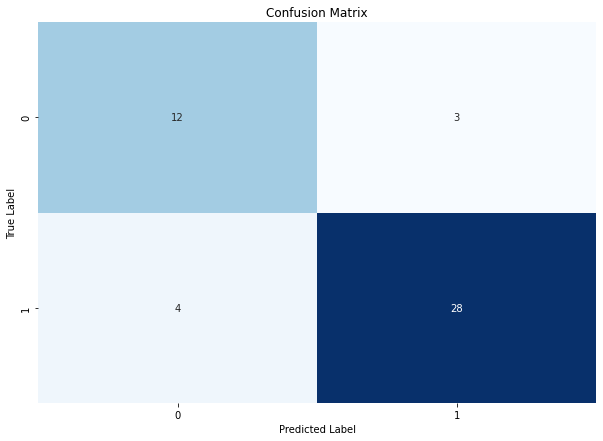

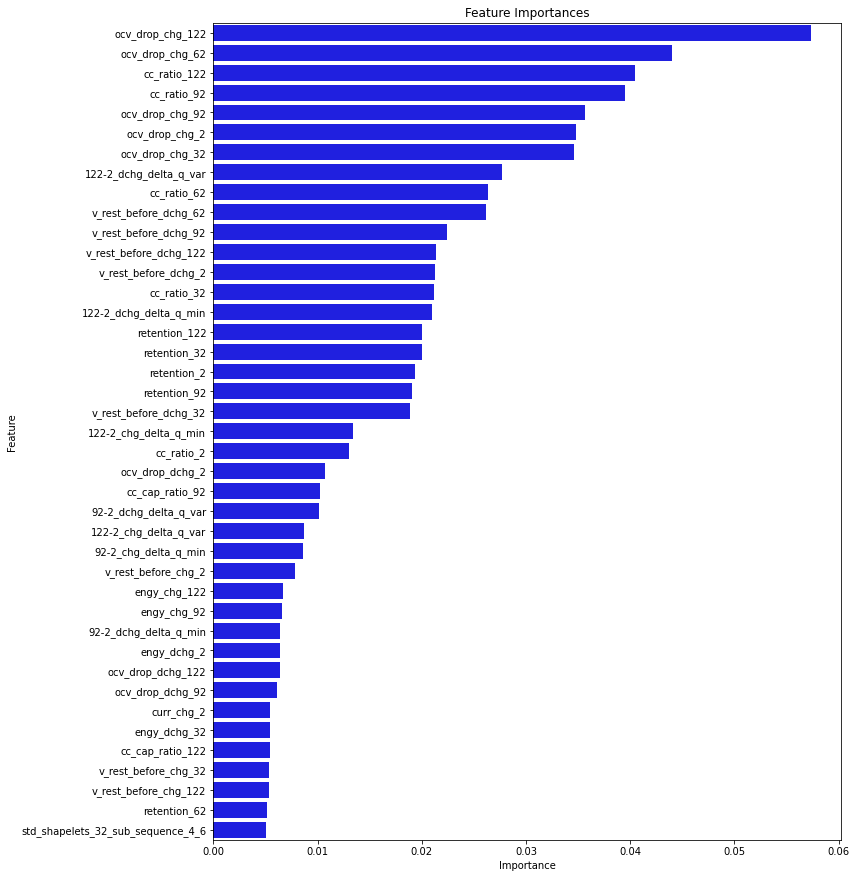

All
Best Parameters: {'C': 1.0, 'l1_ratio': 0.1}
Train Mean Score of Best Parameters: 83.51958525345623
Train Standard Deviation Score of Best Parameters: 9.53628014493804
Test Score: 85.1063829787234
Confusion Matrix:
[[12  3]
 [ 4 28]]
False Positive Rate (FPR): 20.0


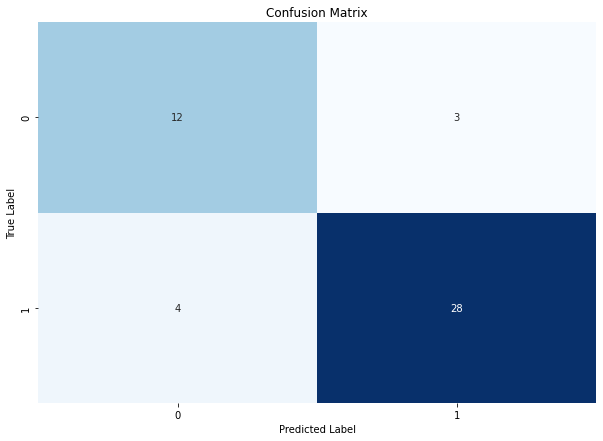

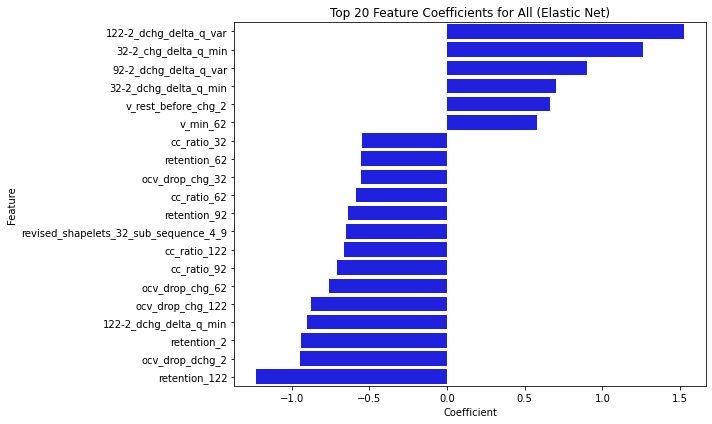

/tmp/ipykernel_1436962/462733494.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_classification_results_df = RF_classification_results_df.append(RF_clf_results_df, ignore_index=True)
/tmp/ipykernel_1436962/462733494.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_classification_results_df = EN_classification_results_df.append(EN_clf_results_df, ignore_index=True)


Feature Set: All up to Cycle 32
Best Parameters: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Mean Score of Best Parameters: 85.20775729646697
Train Standard Deviation Score of Best Parameters: 7.109241589045283
Test Score: 72.3404255319149
Confusion Matrix:
[[10  5]
 [ 8 24]]
False Positive Rate (FPR): 33.33333333333333


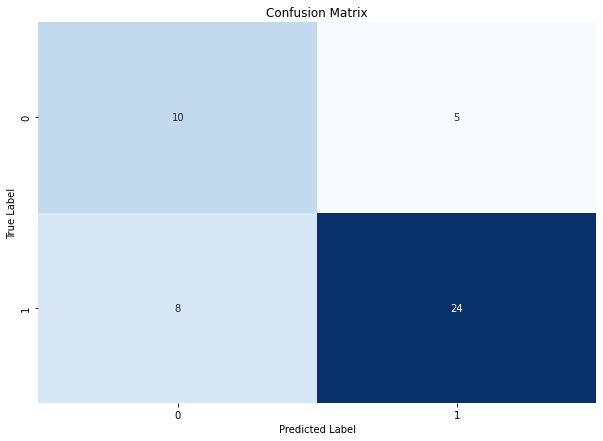

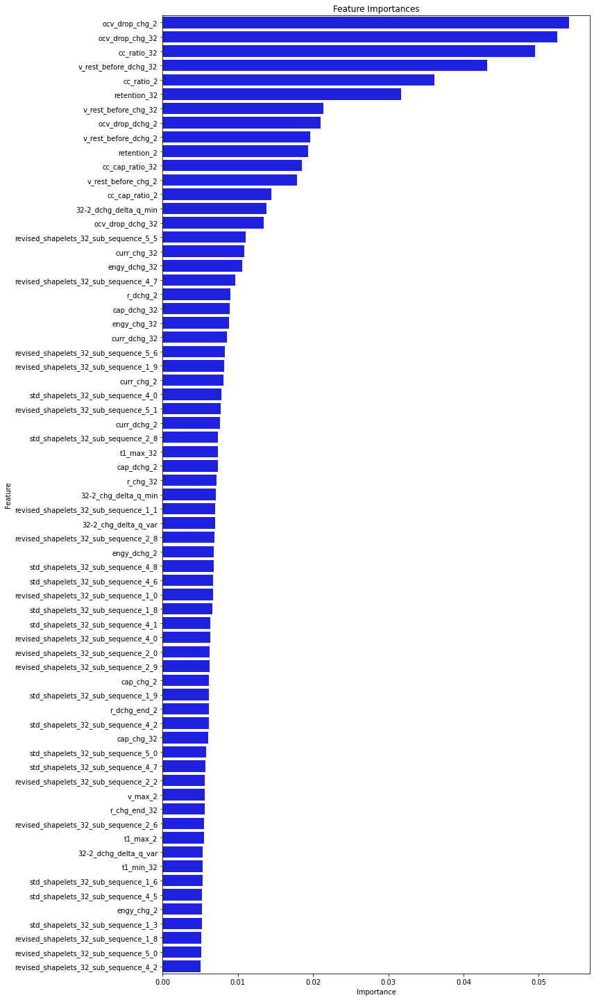

All up to Cycle 32
Best Parameters: {'C': 1.0, 'l1_ratio': 0.7}
Train Mean Score of Best Parameters: 84.18625192012288
Train Standard Deviation Score of Best Parameters: 7.422968838311828
Test Score: 72.3404255319149
Confusion Matrix:
[[10  5]
 [ 8 24]]
False Positive Rate (FPR): 33.33333333333333


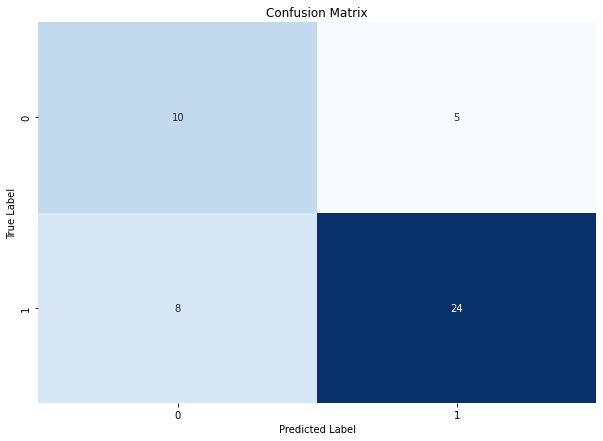

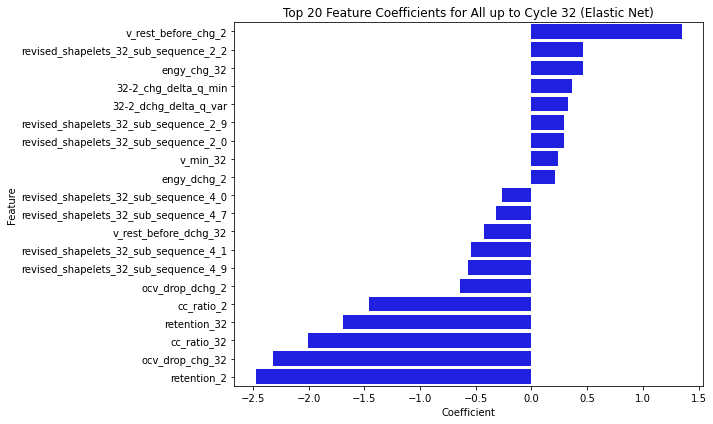

/tmp/ipykernel_1436962/462733494.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_classification_results_df = RF_classification_results_df.append(RF_clf_results_df, ignore_index=True)
/tmp/ipykernel_1436962/462733494.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_classification_results_df = EN_classification_results_df.append(EN_clf_results_df, ignore_index=True)


Feature Set: Knowledge-based Engineering
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
Train Mean Score of Best Parameters: 86.82910906298004
Train Standard Deviation Score of Best Parameters: 6.7607565164193755
Test Score: 78.72340425531915
Confusion Matrix:
[[12  3]
 [ 7 25]]
False Positive Rate (FPR): 20.0


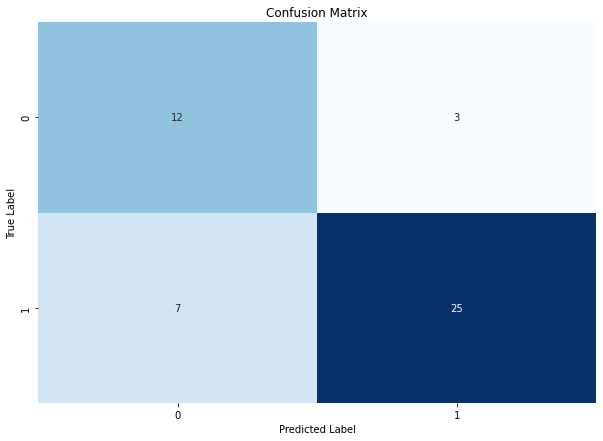

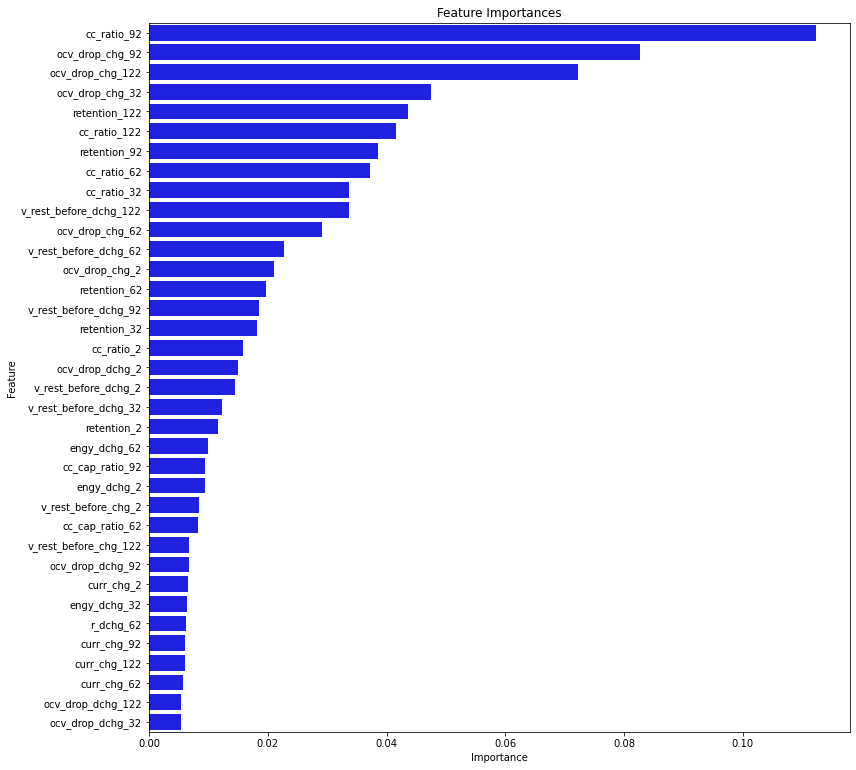

Knowledge-based Engineering
Best Parameters: {'C': 0.1, 'l1_ratio': 0.1}
Train Mean Score of Best Parameters: 82.99347158218126
Train Standard Deviation Score of Best Parameters: 8.639737117992059
Test Score: 80.85106382978722
Confusion Matrix:
[[12  3]
 [ 6 26]]
False Positive Rate (FPR): 20.0


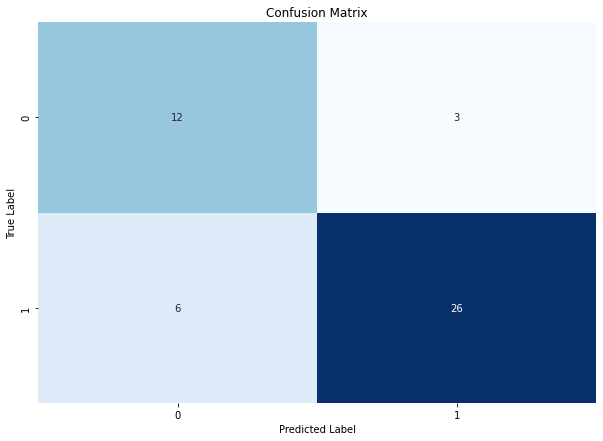

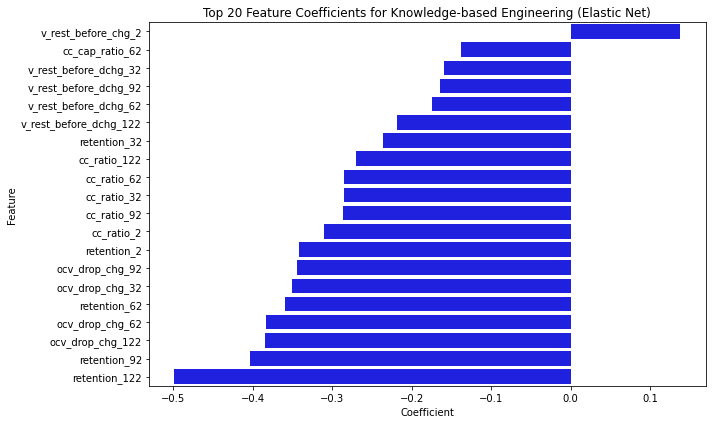

/tmp/ipykernel_1436962/462733494.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_classification_results_df = RF_classification_results_df.append(RF_clf_results_df, ignore_index=True)
/tmp/ipykernel_1436962/462733494.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_classification_results_df = EN_classification_results_df.append(EN_clf_results_df, ignore_index=True)


Feature Set: Standard Shapelets
Best Parameters: {'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
Train Mean Score of Best Parameters: 72.14036098310291
Train Standard Deviation Score of Best Parameters: 9.442223377335345
Test Score: 55.319148936170215
Confusion Matrix:
[[ 8  7]
 [14 18]]
False Positive Rate (FPR): 46.666666666666664


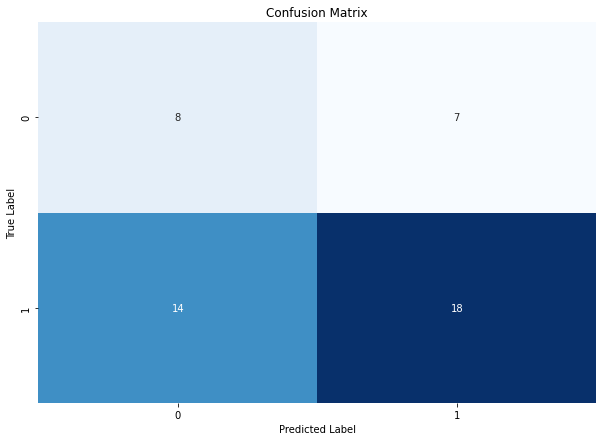

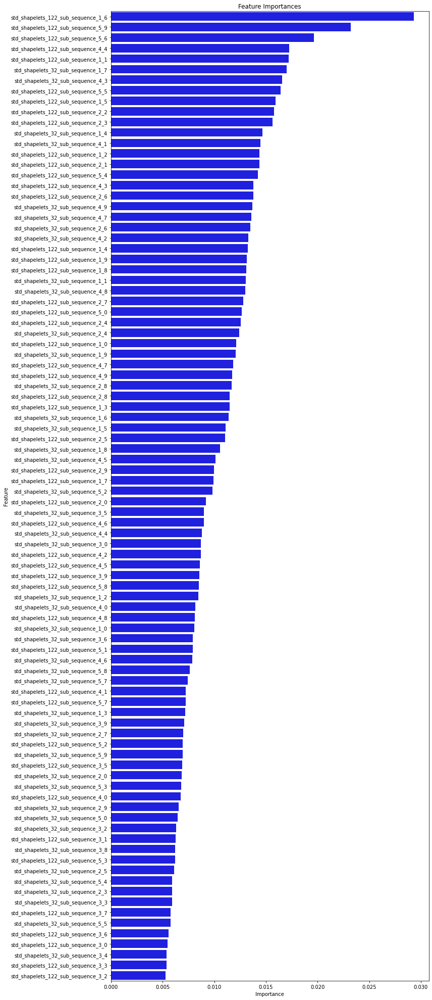

Standard Shapelets
Best Parameters: {'C': 1.0, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 61.17012288786483
Train Standard Deviation Score of Best Parameters: 5.397163387380331
Test Score: 59.57446808510638
Confusion Matrix:
[[ 9  6]
 [13 19]]
False Positive Rate (FPR): 40.0


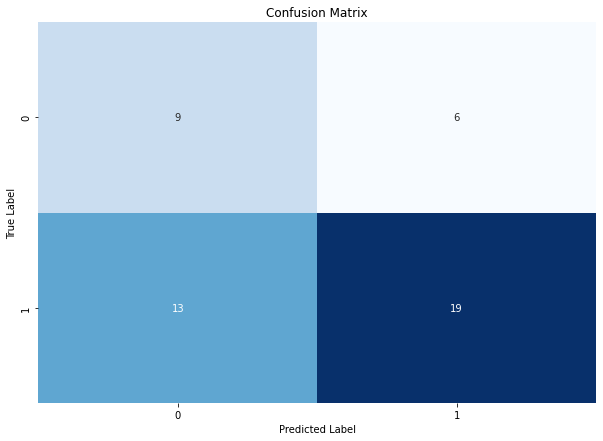

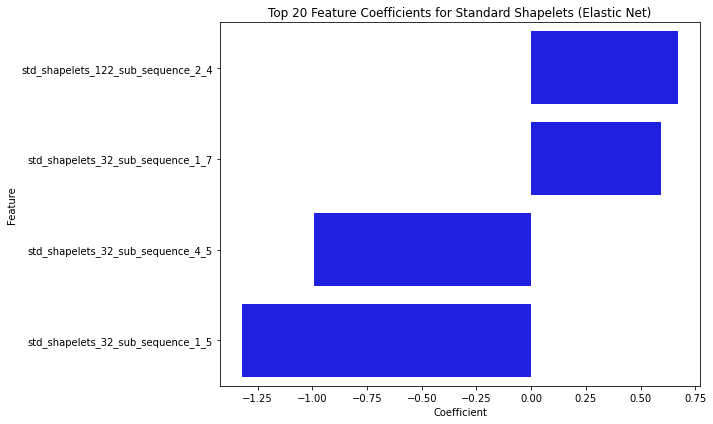

Feature Set: Revised Shapelets


/tmp/ipykernel_1436962/462733494.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_classification_results_df = RF_classification_results_df.append(RF_clf_results_df, ignore_index=True)
/tmp/ipykernel_1436962/462733494.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_classification_results_df = EN_classification_results_df.append(EN_clf_results_df, ignore_index=True)


Best Parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Train Mean Score of Best Parameters: 74.17108294930877
Train Standard Deviation Score of Best Parameters: 8.81909251800975
Test Score: 51.06382978723404
Confusion Matrix:
[[ 7  8]
 [15 17]]
False Positive Rate (FPR): 53.333333333333336


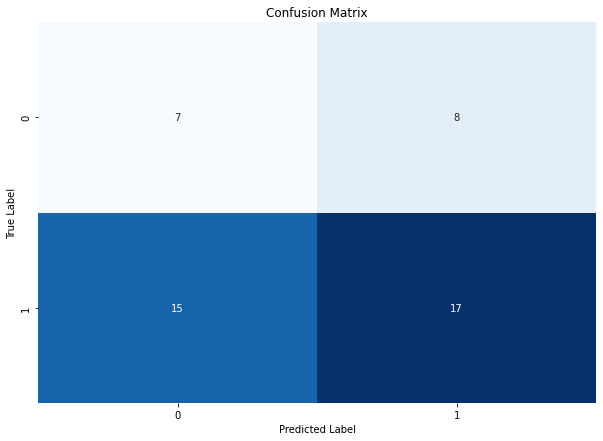

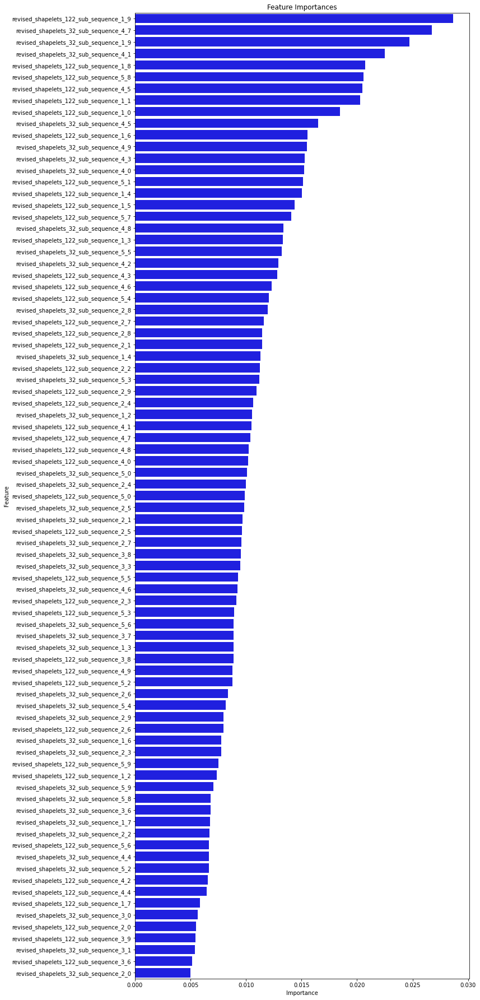

Revised Shapelets
Best Parameters: {'C': 1.0, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 62.441628264208916
Train Standard Deviation Score of Best Parameters: 6.660965977081289
Test Score: 53.191489361702125
Confusion Matrix:
[[ 9  6]
 [16 16]]
False Positive Rate (FPR): 40.0


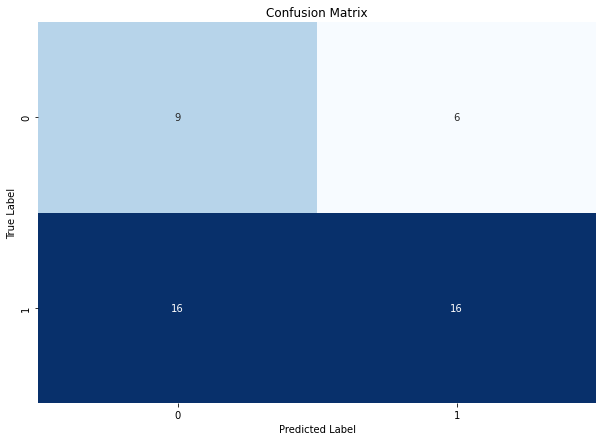

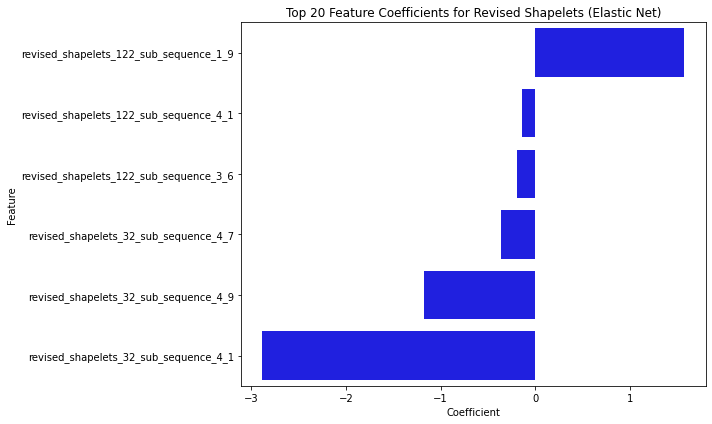

Feature Set: Dchg DeltaQ(V) Var


/tmp/ipykernel_1436962/462733494.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_classification_results_df = RF_classification_results_df.append(RF_clf_results_df, ignore_index=True)
/tmp/ipykernel_1436962/462733494.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_classification_results_df = EN_classification_results_df.append(EN_clf_results_df, ignore_index=True)


Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 2, 'n_estimators': 50}
Train Mean Score of Best Parameters: 81.85752688172045
Train Standard Deviation Score of Best Parameters: 9.03260743522144
Test Score: 89.36170212765957
Confusion Matrix:
[[14  1]
 [ 4 28]]
False Positive Rate (FPR): 6.666666666666667


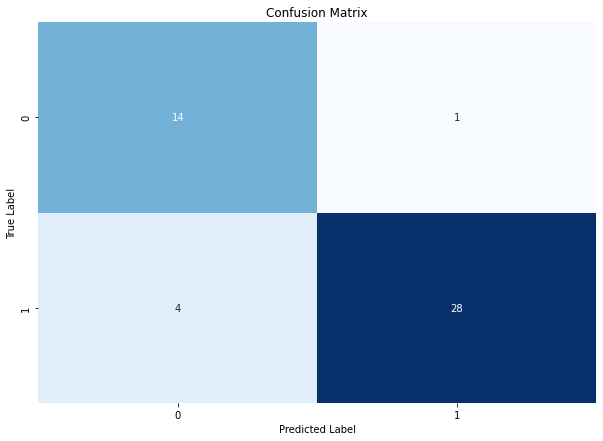

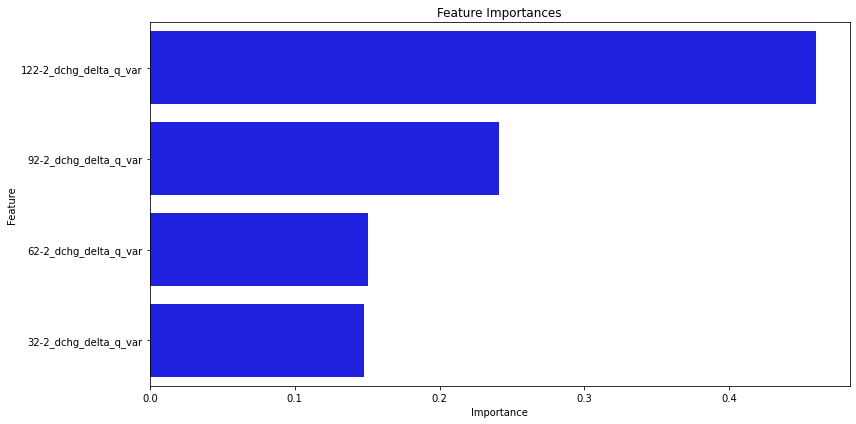

Dchg DeltaQ(V) Var
Best Parameters: {'C': 1.0, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 80.42895545314902
Train Standard Deviation Score of Best Parameters: 8.48111020717914
Test Score: 89.36170212765957
Confusion Matrix:
[[14  1]
 [ 4 28]]
False Positive Rate (FPR): 6.666666666666667


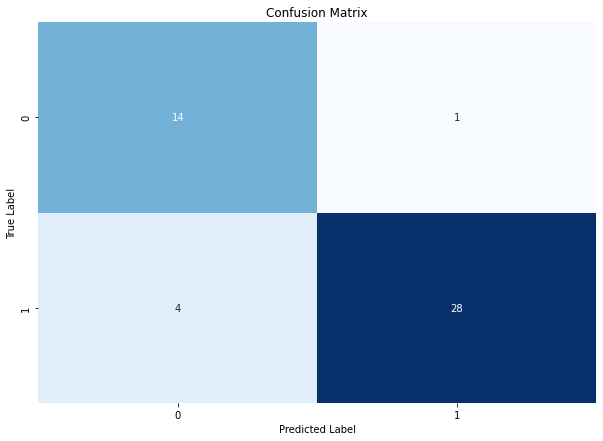

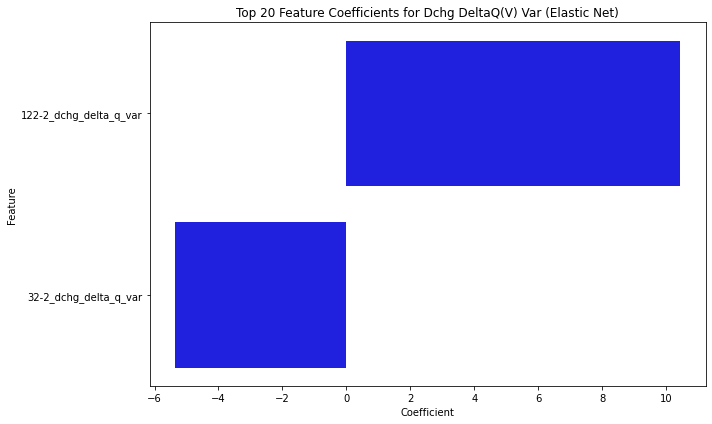

Feature Set: Chg & Dchg DeltaQ(V) Min & Var


/tmp/ipykernel_1436962/462733494.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_classification_results_df = RF_classification_results_df.append(RF_clf_results_df, ignore_index=True)
/tmp/ipykernel_1436962/462733494.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_classification_results_df = EN_classification_results_df.append(EN_clf_results_df, ignore_index=True)


Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Train Mean Score of Best Parameters: 78.22887864823349
Train Standard Deviation Score of Best Parameters: 9.61636722993637
Test Score: 93.61702127659575
Confusion Matrix:
[[14  1]
 [ 2 30]]
False Positive Rate (FPR): 6.666666666666667


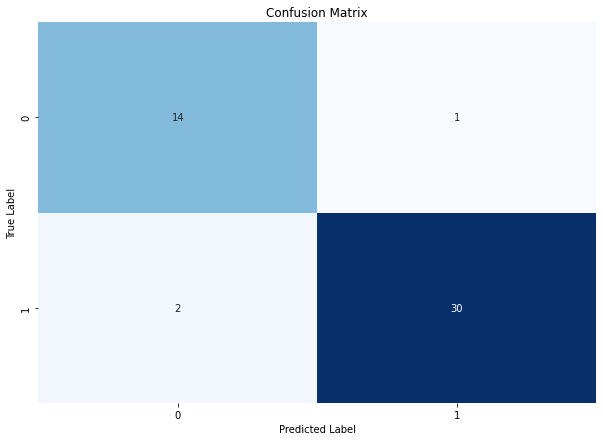

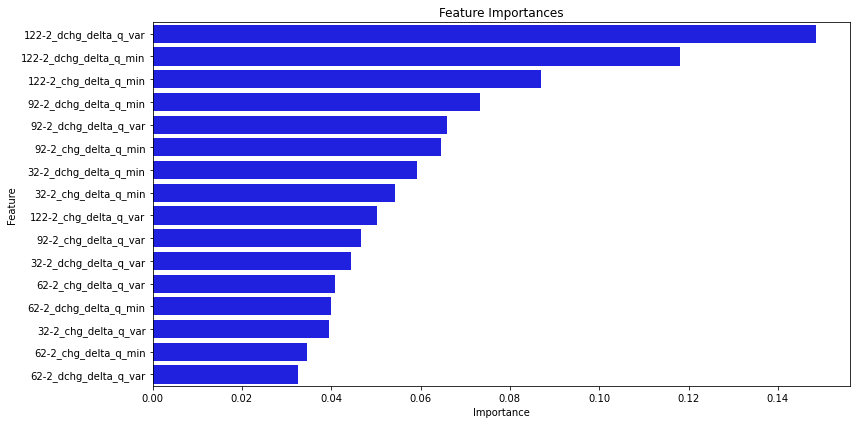

Chg & Dchg DeltaQ(V) Min & Var
Best Parameters: {'C': 1.0, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 81.54339477726576
Train Standard Deviation Score of Best Parameters: 9.278197066751908
Test Score: 89.36170212765957
Confusion Matrix:
[[14  1]
 [ 4 28]]
False Positive Rate (FPR): 6.666666666666667


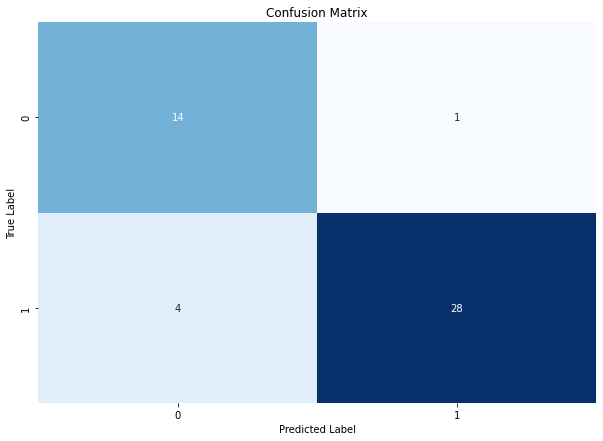

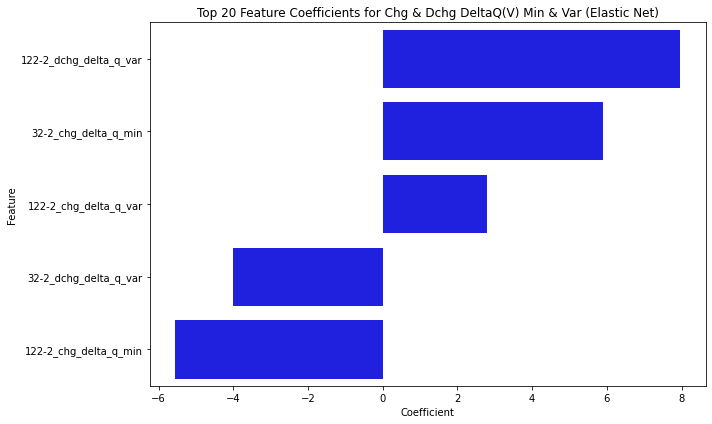

/tmp/ipykernel_1436962/462733494.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_classification_results_df = RF_classification_results_df.append(RF_clf_results_df, ignore_index=True)
/tmp/ipykernel_1436962/462733494.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_classification_results_df = EN_classification_results_df.append(EN_clf_results_df, ignore_index=True)


In [133]:
# Initialize an empty DataFrame to store the results
RF_classification_results_df = pd.DataFrame(columns=['Features', 'Model', 'Train Accuracy Mean [%]', 'Train Accuracy Std Dev [%]', 'Test Accuracy [%]', 'Test False Positive Rate [%]'])
EN_classification_results_df = pd.DataFrame(columns=['Features', 'Model', 'Train Accuracy Mean [%]', 'Train Accuracy Std Dev [%]', 'Test Accuracy [%]', 'Test False Positive Rate [%]'])

features_combinations = {
    'All': [X_train_all, X_test_all],
    'All up to Cycle 32': [X_train_up_to_32, X_test_up_to_32],
    'Knowledge-based Engineering': [X_train_eng, X_test_eng],
    'Standard Shapelets': [X_train_std_shapelets, X_test_std_shapelets],
    'Revised Shapelets': [X_train_revised_shapelets, X_test_revised_shapelets],
    'Dchg DeltaQ(V) Var': [X_train_dchg_delta_q_var, X_test_dchg_delta_q_var],
    'Chg & Dchg DeltaQ(V) Min & Var': [X_train_delta_q_min_var, X_test_delta_q_min_var]
}

for feature_name, feature_combination in features_combinations.items():
    X_train, X_test = feature_combination
   
    # Run the classifier and get the results
    RF_clf_results = run_RF_classifier(X_train, X_test, y_train_clf, y_test_clf, feature_name, group_ids_train)
    EN_clf_results = run_elastic_net_classifier(X_train, X_test, y_train_clf, y_test_clf, feature_name, group_ids_train)
    
    # Convert the results to DataFrames
    RF_clf_results_df = pd.DataFrame([RF_clf_results])
    EN_clf_results_df = pd.DataFrame([EN_clf_results])
    
    # Append the results to the DataFrame
    RF_classification_results_df = RF_classification_results_df.append(RF_clf_results_df, ignore_index=True)
    EN_classification_results_df = EN_classification_results_df.append(EN_clf_results_df, ignore_index=True)


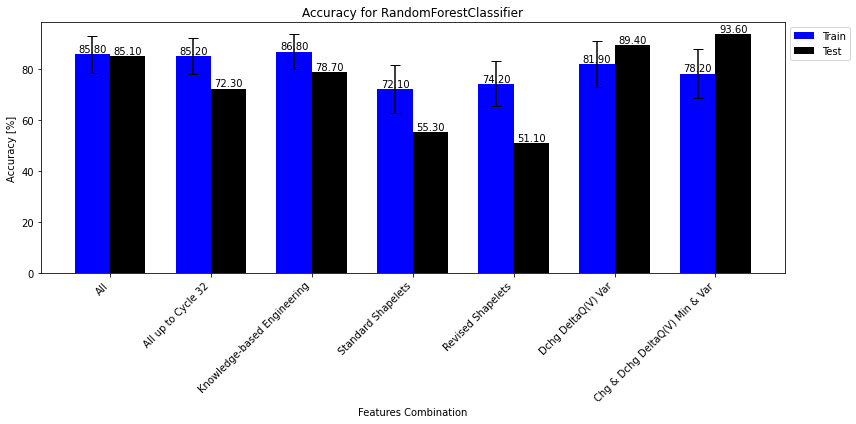

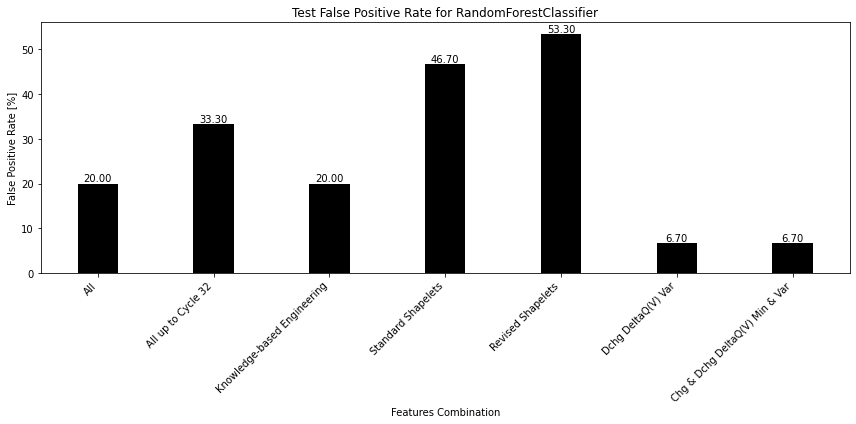

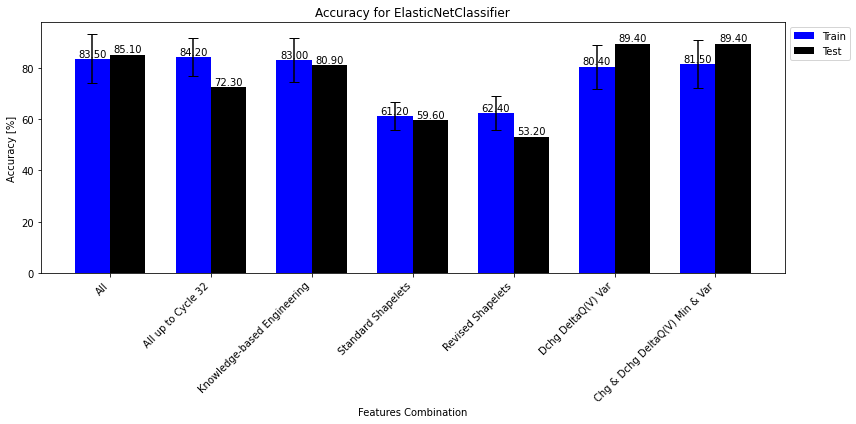

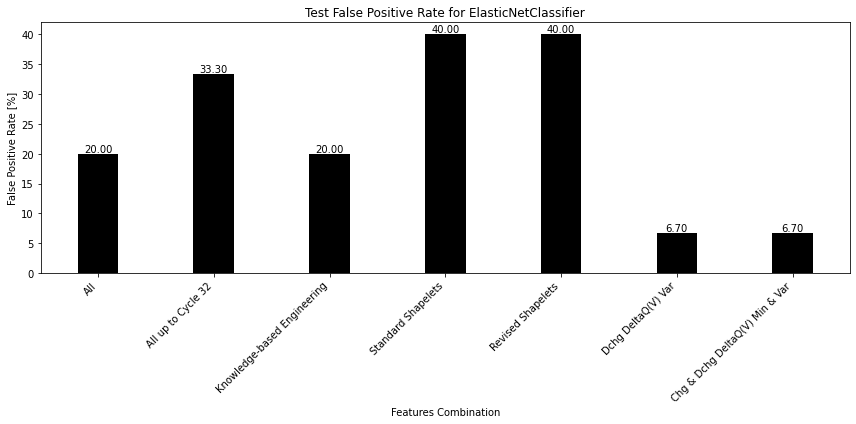

In [134]:
# Paths to save the Excel file and the image
save_path_excel_rf = 'RandomForestClassifier_results.xlsx'
save_path_image_rf = 'RandomForestClassifier_results.png'
save_path_image_fpr_rf = 'RandomForestClassifier_FPR.png'

save_path_excel_en = 'ElasticNetClassifier_results.xlsx'
save_path_image_en = 'ElasticNetClassifier_results.png'
save_path_image_fpr_en = 'ElasticNetClassifier_FPR.png'


# Display the results DataFrame
# print(RF_classification_results_df)
# print(EN_classification_results_df)

# Plot and save for RandomForestClassifier
plot_model_accuracy(RF_classification_results_df, 'RandomForestClassifier', save_path_excel_rf, save_path_image_rf)
plot_false_positive_rate(RF_classification_results_df, 'RandomForestClassifier', save_path_image_fpr_rf)

# Plot and save for ElasticNetClassifier
plot_model_accuracy(EN_classification_results_df, 'ElasticNetClassifier', save_path_excel_en, save_path_image_en)
plot_false_positive_rate(EN_classification_results_df, 'ElasticNetClassifier', save_path_image_fpr_en)

## Regression

In [135]:
# Define a custom scoring function for RMSE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Make RMSE scorer globally
rmse_scorer = make_scorer(rmse, greater_is_better=False)

In [136]:
# Global regression target
y_train_reg = master_table.loc[cell_ids_train]['cycle_life'].reset_index(drop=True)
y_test_reg = master_table.loc[cell_ids_test]['cycle_life'].reset_index(drop=True)

All
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Train Mean Score of Best Parameters: 172.43597666563957
Train Standard Deviation Score of Best Parameters: 18.177606636813547
Test R^2 Score: 0.42391894020561405
Test Root Mean Squared Error: 174.26715920354766
Test Mean Percent Error: 15.103209690383643


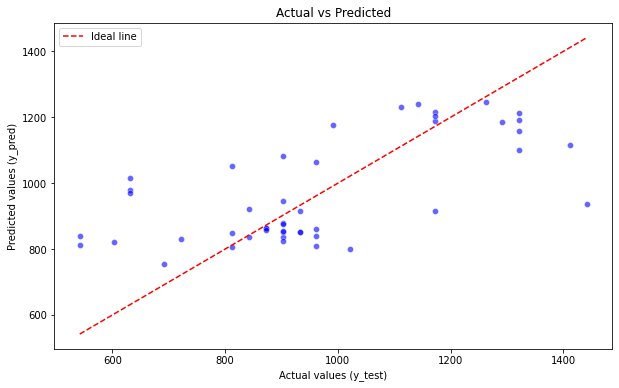

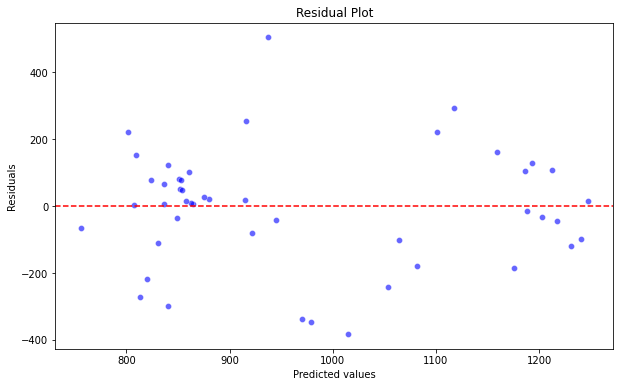

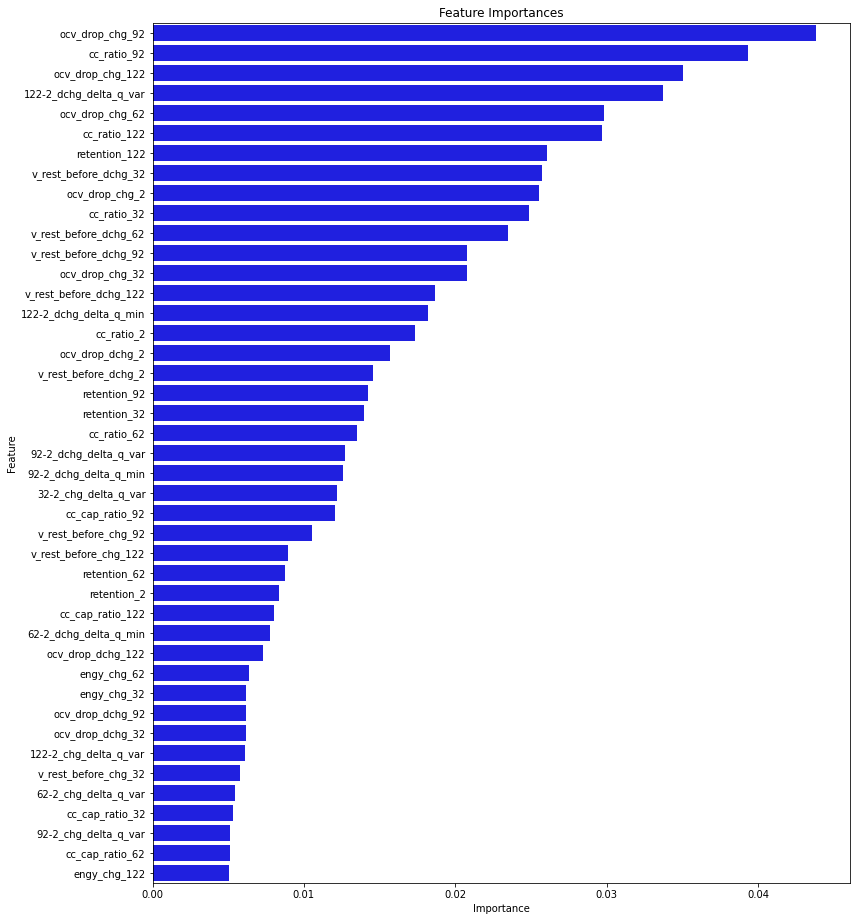

All
Best Parameters: {'alpha': 0.5, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 157.0213489050903
Train Standard Deviation Score of Best Parameters: 14.074194842644594
Test R^2 Score: 0.6808314807071497
Test Root Mean Squared Error: 129.71308178210268
Test Mean Percent Error: 10.029672727699511


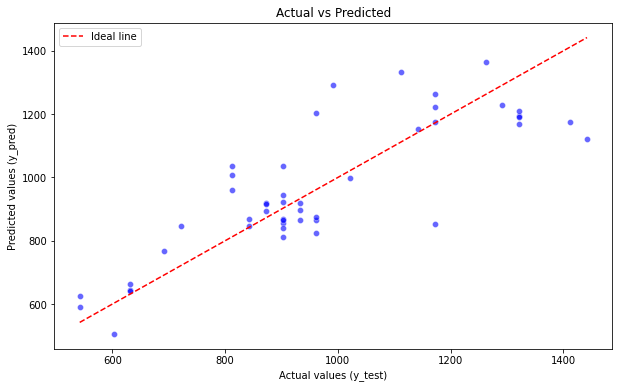

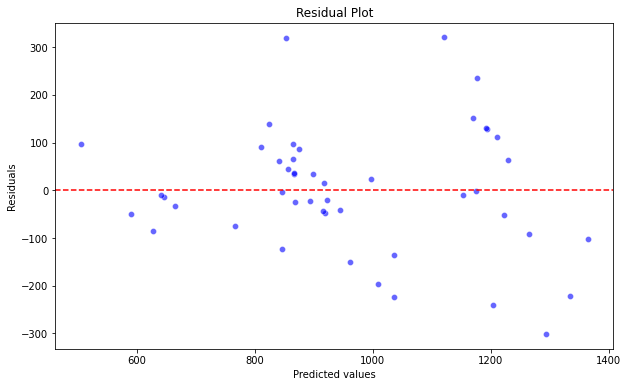

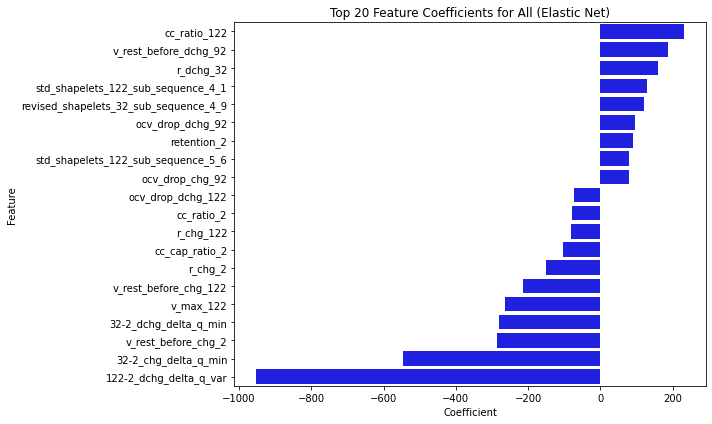

/tmp/ipykernel_1436962/413606256.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_regression_results_df = RF_regression_results_df.append(RF_reg_results_df, ignore_index=True)
/tmp/ipykernel_1436962/413606256.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_regression_results_df = EN_regression_results_df.append(EN_reg_results_df, ignore_index=True)


All up to Cycle 32
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Mean Score of Best Parameters: 186.63999737557683
Train Standard Deviation Score of Best Parameters: 22.209745343601575
Test R^2 Score: 0.30790373212767597
Test Root Mean Squared Error: 191.01039684301918
Test Mean Percent Error: 16.815808958802947


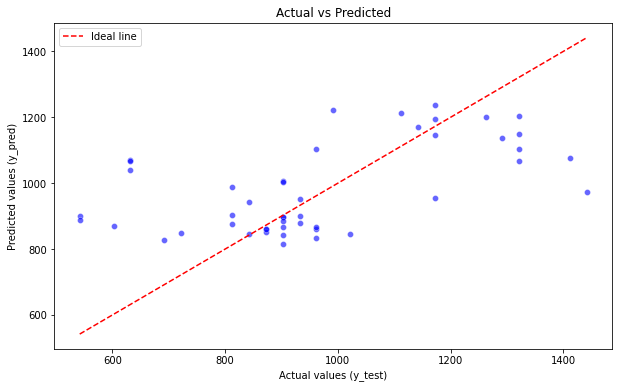

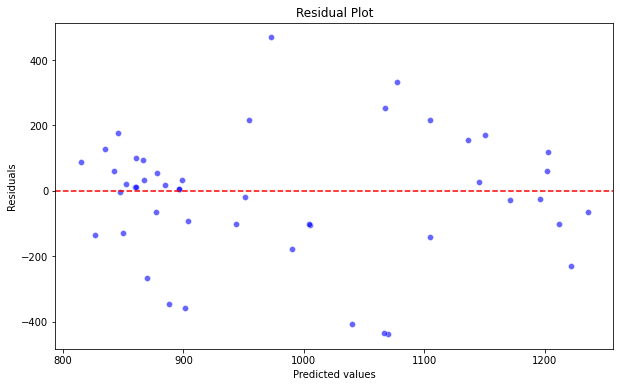

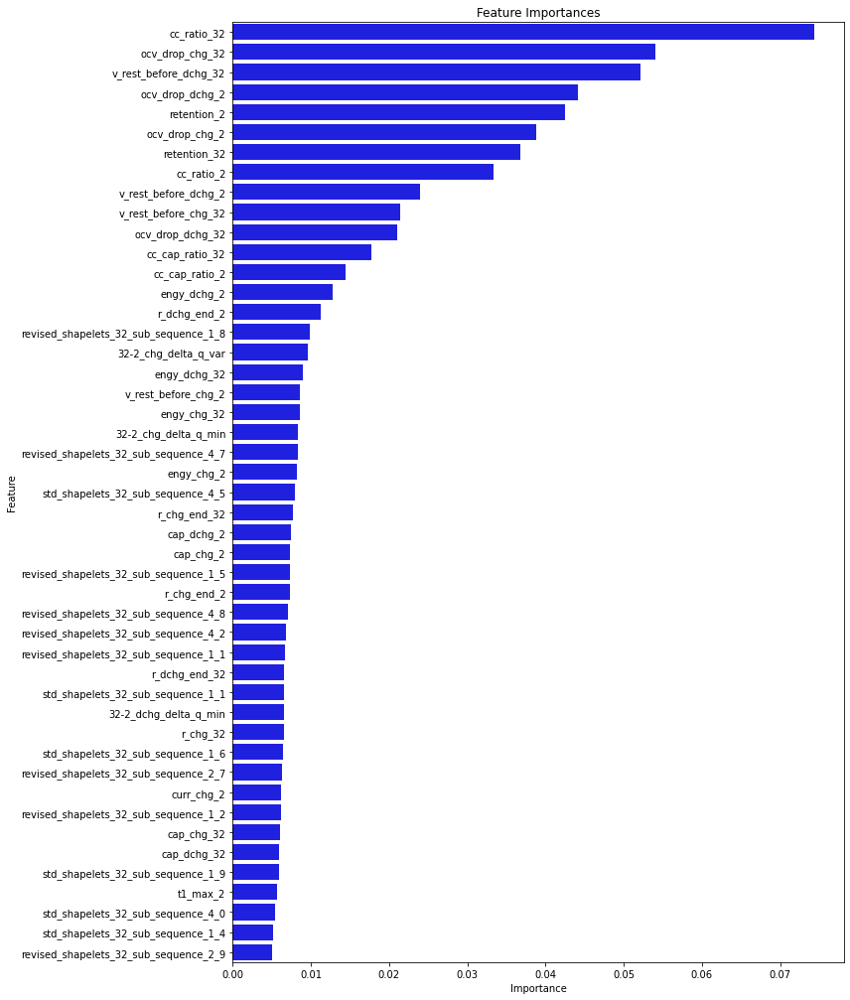

All up to Cycle 32
Best Parameters: {'alpha': 0.1, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 198.51710991124648
Train Standard Deviation Score of Best Parameters: 27.793154954942786
Test R^2 Score: 0.2028898881969735
Test Root Mean Squared Error: 204.9901118634287
Test Mean Percent Error: 16.900145607364156


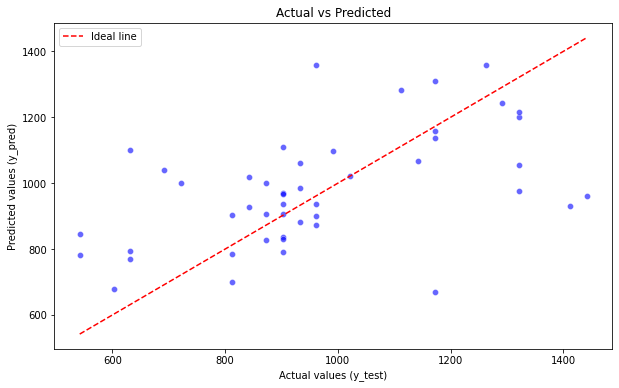

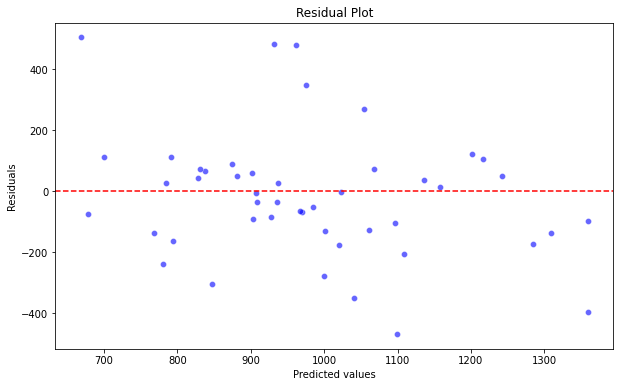

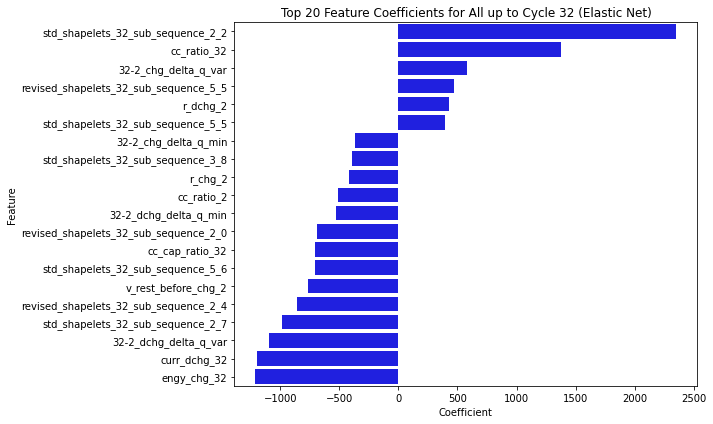

/tmp/ipykernel_1436962/413606256.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_regression_results_df = RF_regression_results_df.append(RF_reg_results_df, ignore_index=True)
/tmp/ipykernel_1436962/413606256.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_regression_results_df = EN_regression_results_df.append(EN_reg_results_df, ignore_index=True)


Knowledge-based Engineering
Best Parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Train Mean Score of Best Parameters: 161.5525256056983
Train Standard Deviation Score of Best Parameters: 22.339800022228385
Test R^2 Score: 0.34875336418339475
Test Root Mean Squared Error: 185.28766128113554
Test Mean Percent Error: 16.10126062826015


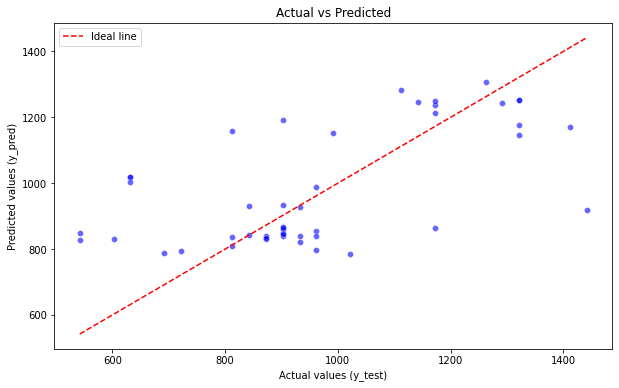

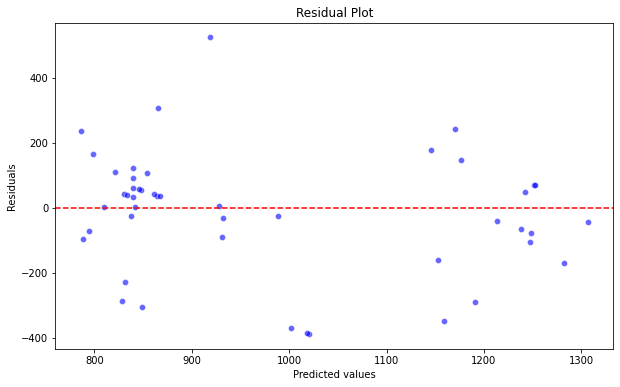

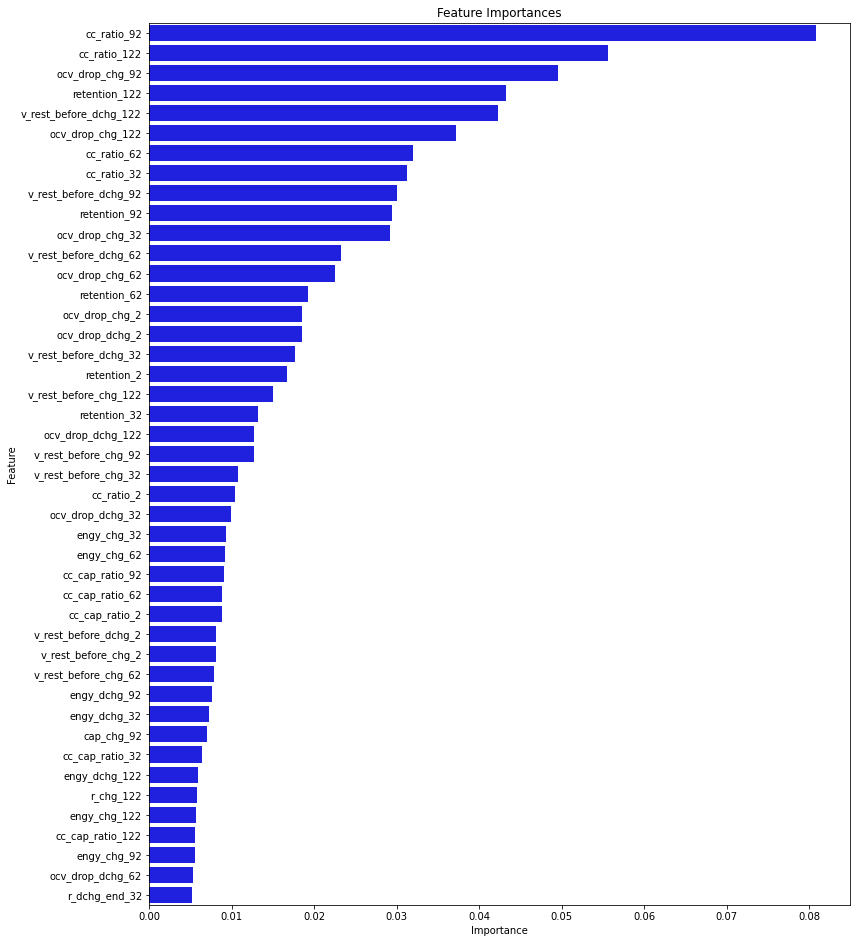

Knowledge-based Engineering
Best Parameters: {'alpha': 0.5, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 165.51455360458286
Train Standard Deviation Score of Best Parameters: 19.302468482361217
Test R^2 Score: 0.6136126081503528
Test Root Mean Squared Error: 142.72012799035141
Test Mean Percent Error: 11.763270932525236


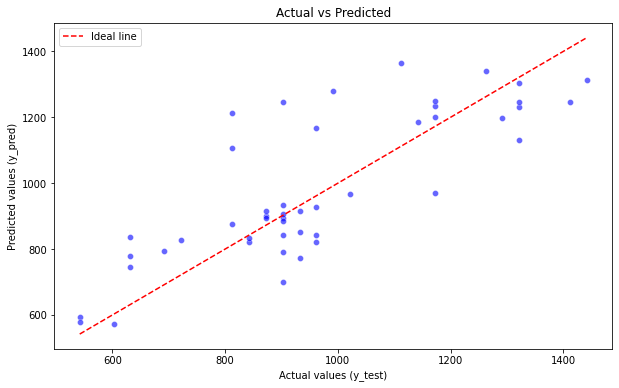

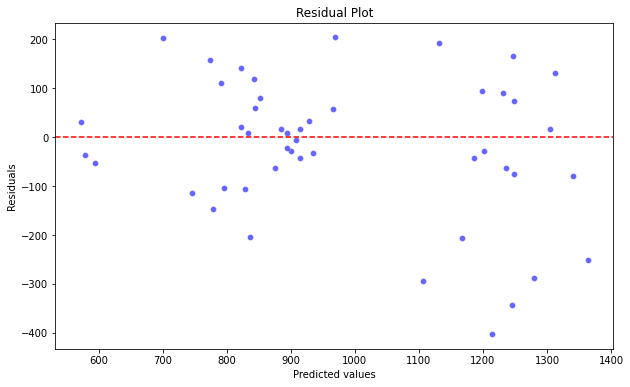

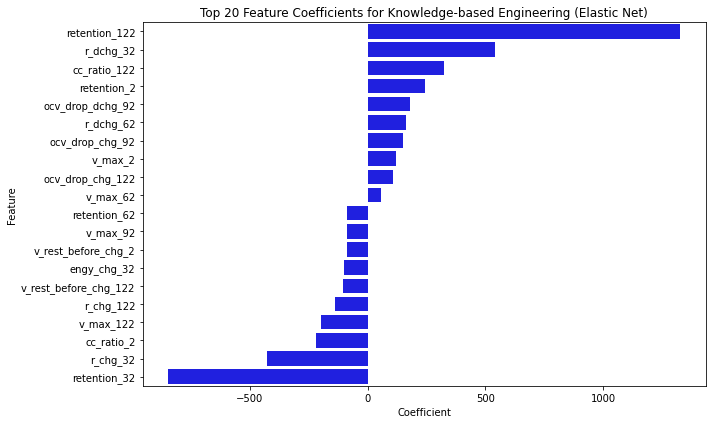

/tmp/ipykernel_1436962/413606256.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_regression_results_df = RF_regression_results_df.append(RF_reg_results_df, ignore_index=True)
/tmp/ipykernel_1436962/413606256.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_regression_results_df = EN_regression_results_df.append(EN_reg_results_df, ignore_index=True)


Standard Shapelets
Best Parameters: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 50}
Train Mean Score of Best Parameters: 224.8265522106173
Train Standard Deviation Score of Best Parameters: 18.358666207801438
Test R^2 Score: -0.19197239575562475
Test Root Mean Squared Error: 250.67259225889757
Test Mean Percent Error: 22.441614795220843


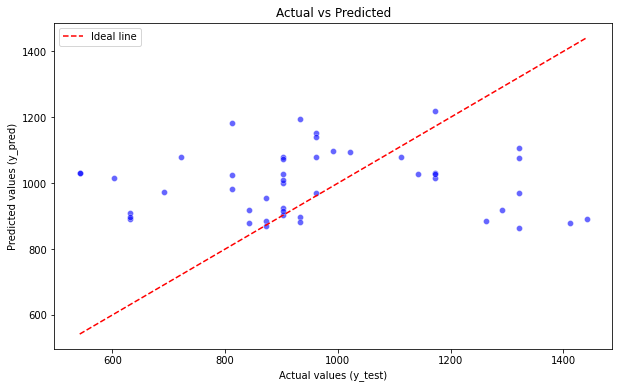

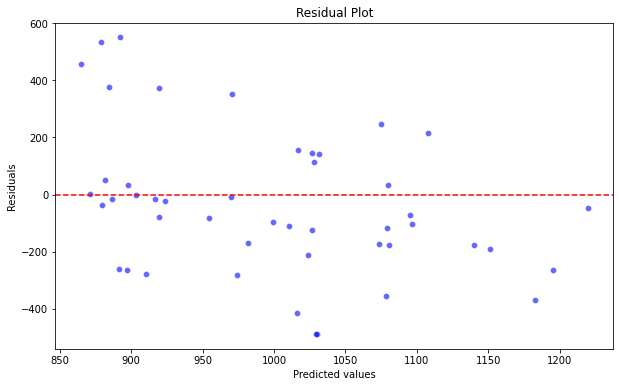

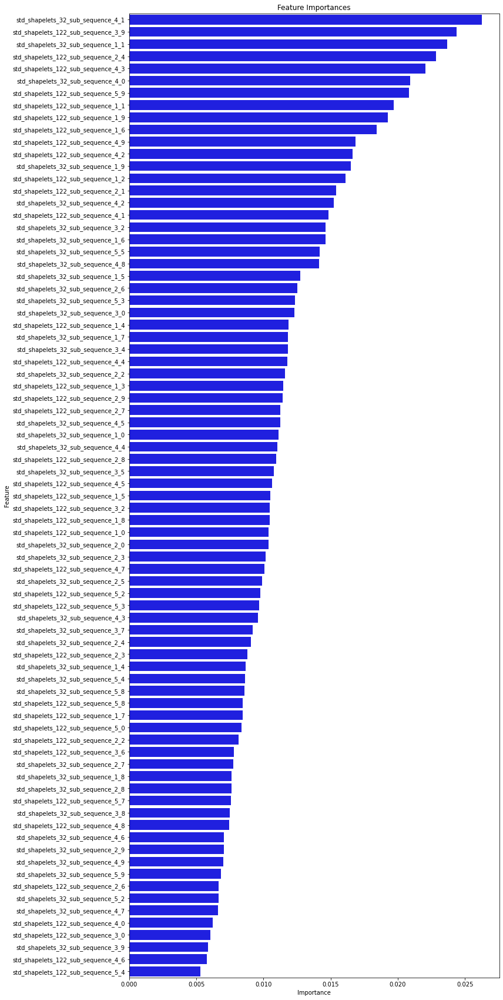

Standard Shapelets
Best Parameters: {'alpha': 1.0, 'l1_ratio': 0.1}
Train Mean Score of Best Parameters: 234.5580036482338
Train Standard Deviation Score of Best Parameters: 26.74145214746023
Test R^2 Score: -0.11055028930232358
Test Root Mean Squared Error: 241.95960564698817
Test Mean Percent Error: 24.447491839693065


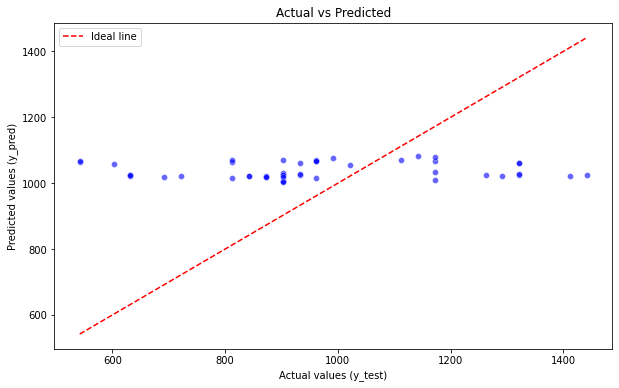

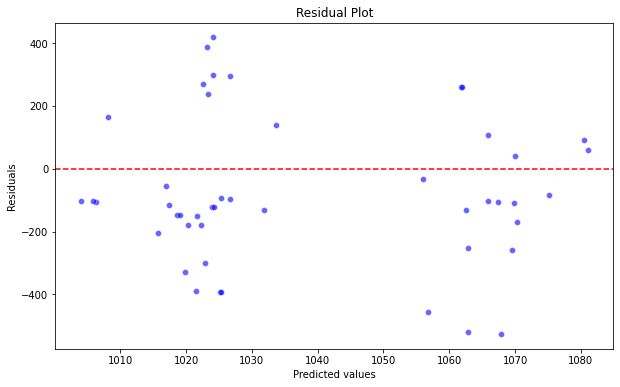

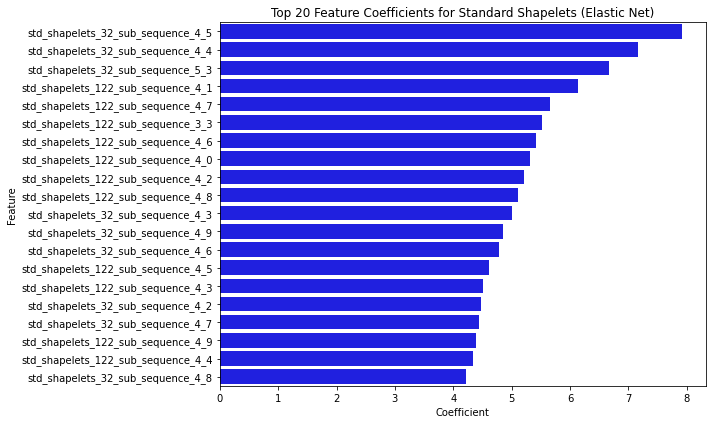

/tmp/ipykernel_1436962/413606256.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_regression_results_df = RF_regression_results_df.append(RF_reg_results_df, ignore_index=True)
/tmp/ipykernel_1436962/413606256.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_regression_results_df = EN_regression_results_df.append(EN_reg_results_df, ignore_index=True)


Revised Shapelets
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 50}
Train Mean Score of Best Parameters: 214.72402468390865
Train Standard Deviation Score of Best Parameters: 20.87682474665715
Test R^2 Score: -0.21960323886904032
Test Root Mean Squared Error: 253.56133971215385
Test Mean Percent Error: 23.864820515902583


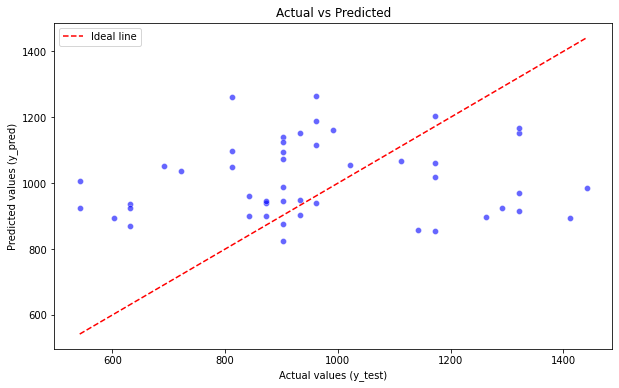

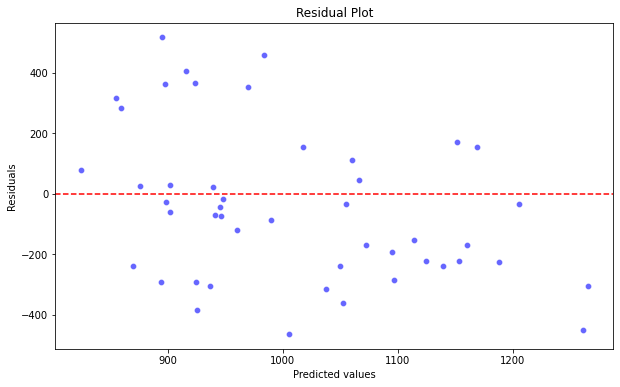

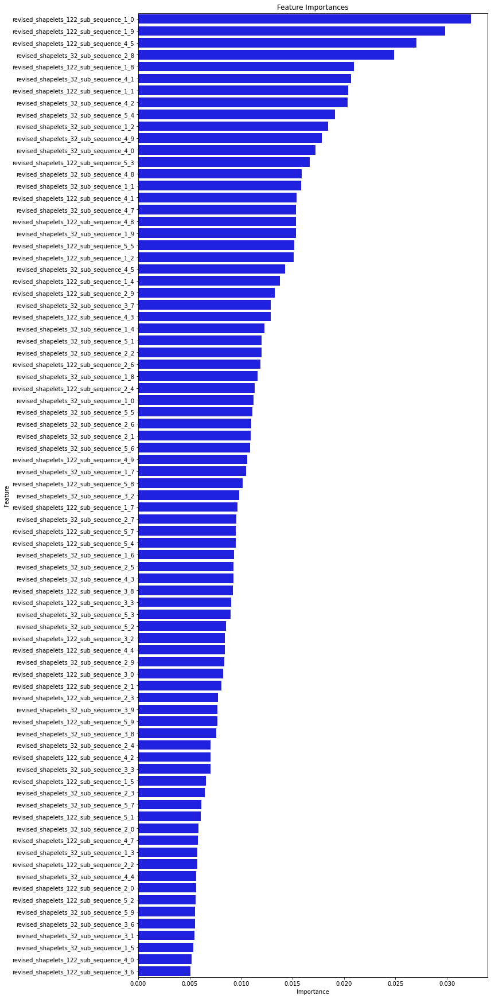

Revised Shapelets
Best Parameters: {'alpha': 1.0, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 235.57880605036544
Train Standard Deviation Score of Best Parameters: 24.807009316896785
Test R^2 Score: -0.2033031366611886
Test Root Mean Squared Error: 251.8612054342152
Test Mean Percent Error: 24.312869159431035


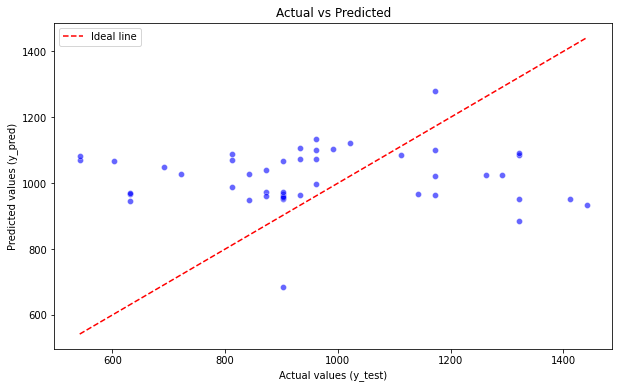

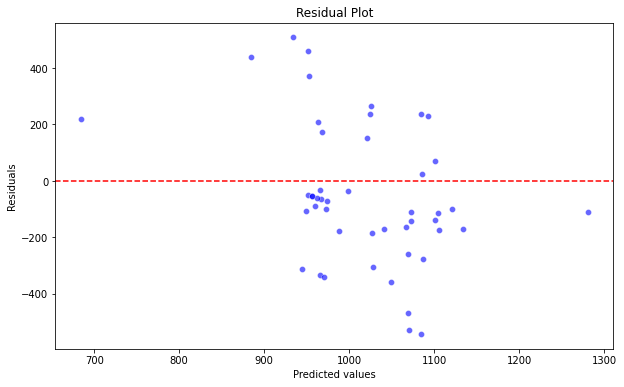

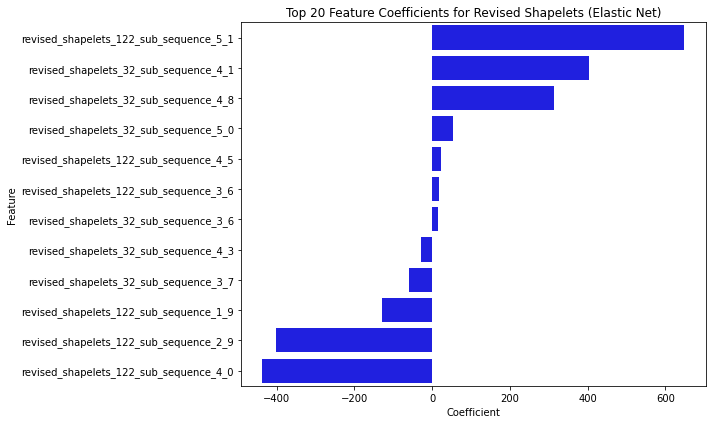

Dchg DeltaQ(V) Var


/tmp/ipykernel_1436962/413606256.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_regression_results_df = RF_regression_results_df.append(RF_reg_results_df, ignore_index=True)
/tmp/ipykernel_1436962/413606256.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_regression_results_df = EN_regression_results_df.append(EN_reg_results_df, ignore_index=True)


Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 50}
Train Mean Score of Best Parameters: 161.9615432759628
Train Standard Deviation Score of Best Parameters: 21.386653880663694
Test R^2 Score: 0.6813429773718882
Test Root Mean Squared Error: 129.60910158337123
Test Mean Percent Error: 12.252943749999725


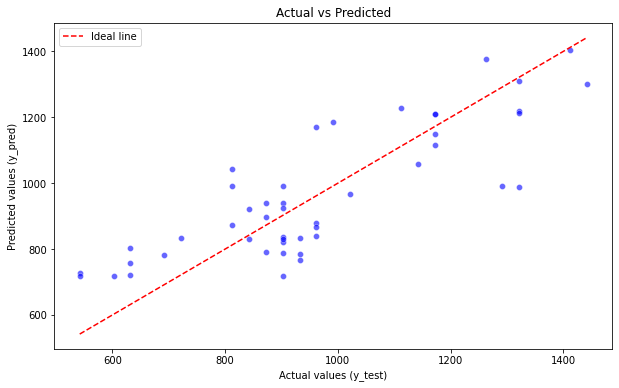

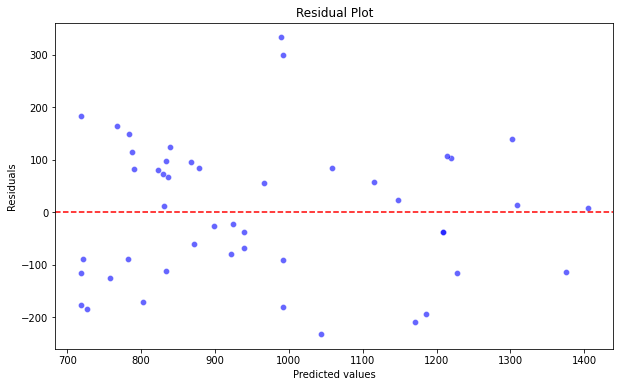

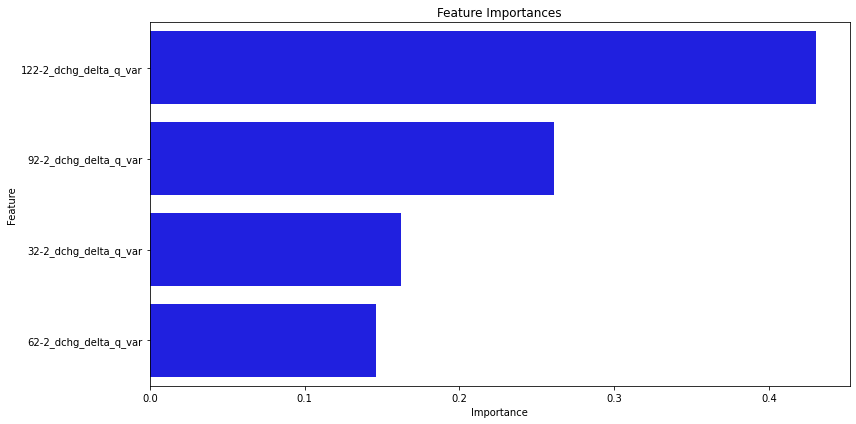

Dchg DeltaQ(V) Var
Best Parameters: {'alpha': 1.0, 'l1_ratio': 1.0}
Train Mean Score of Best Parameters: 166.9696030219489
Train Standard Deviation Score of Best Parameters: 15.092363544265826
Test R^2 Score: 0.6299563029287815
Test Root Mean Squared Error: 139.66907562888076
Test Mean Percent Error: 10.940928933877617


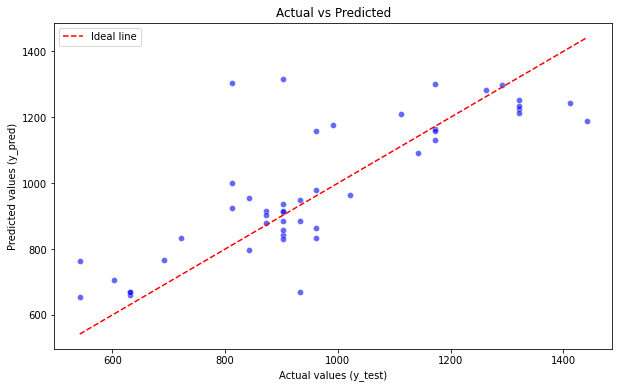

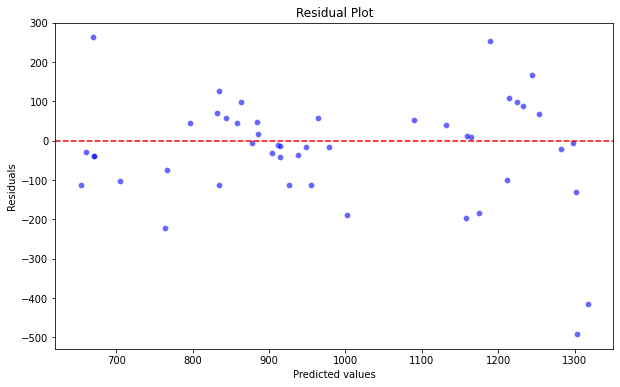

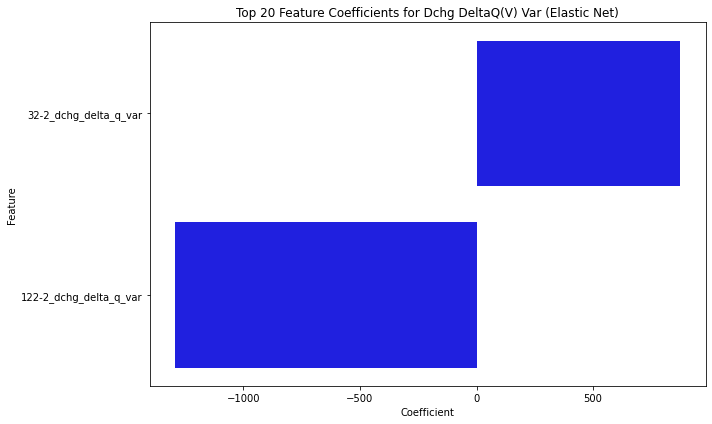

/tmp/ipykernel_1436962/413606256.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_regression_results_df = RF_regression_results_df.append(RF_reg_results_df, ignore_index=True)
/tmp/ipykernel_1436962/413606256.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_regression_results_df = EN_regression_results_df.append(EN_reg_results_df, ignore_index=True)


Chg & Dchg DeltaQ(V) Min & Var
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Train Mean Score of Best Parameters: 160.85819737213643
Train Standard Deviation Score of Best Parameters: 32.81554809469666
Test R^2 Score: 0.6898548678414097
Test Root Mean Squared Error: 127.8663410370875
Test Mean Percent Error: 12.368257823040747


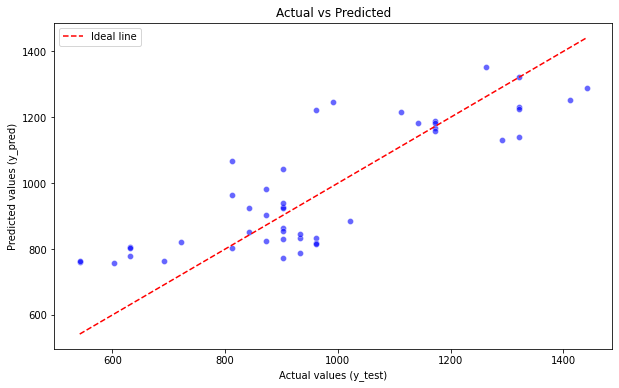

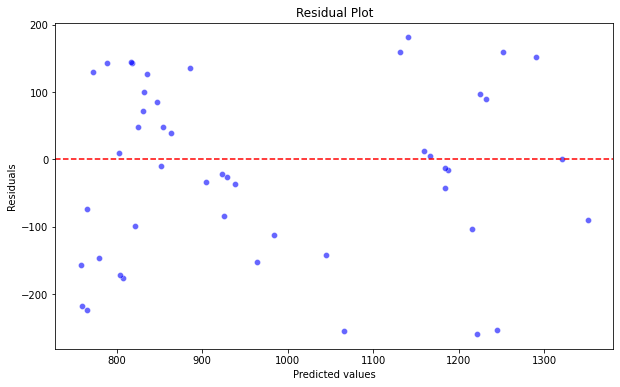

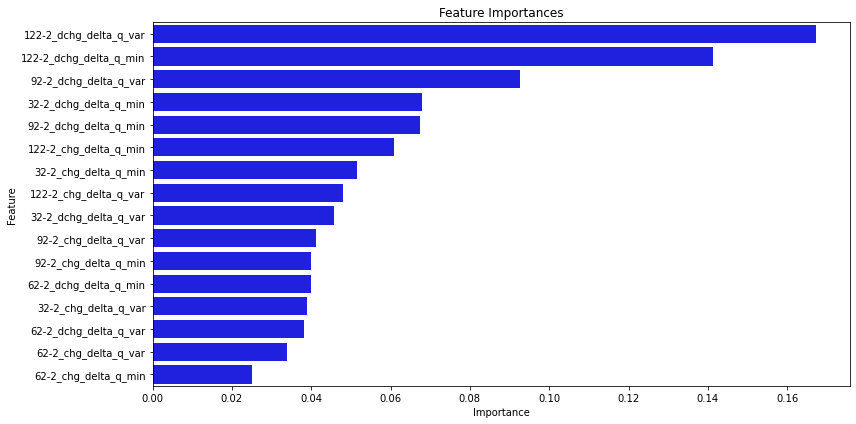

Chg & Dchg DeltaQ(V) Min & Var
Best Parameters: {'alpha': 0.001, 'l1_ratio': 0.5}
Train Mean Score of Best Parameters: 145.3741927660423
Train Standard Deviation Score of Best Parameters: 16.901575698920166
Test R^2 Score: 0.6102792693436472
Test Root Mean Squared Error: 143.33442457516855
Test Mean Percent Error: 12.442203326248073


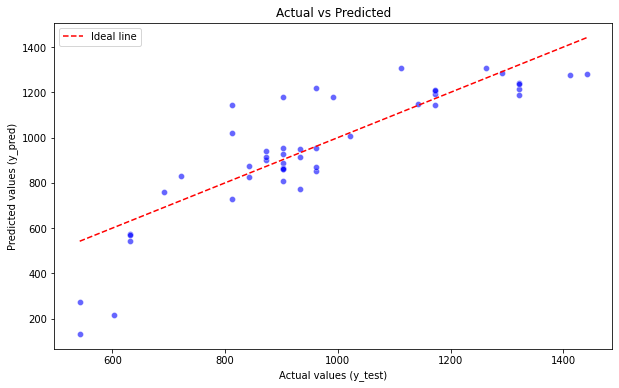

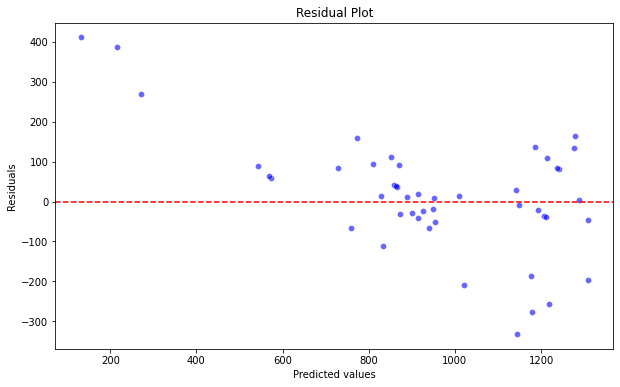

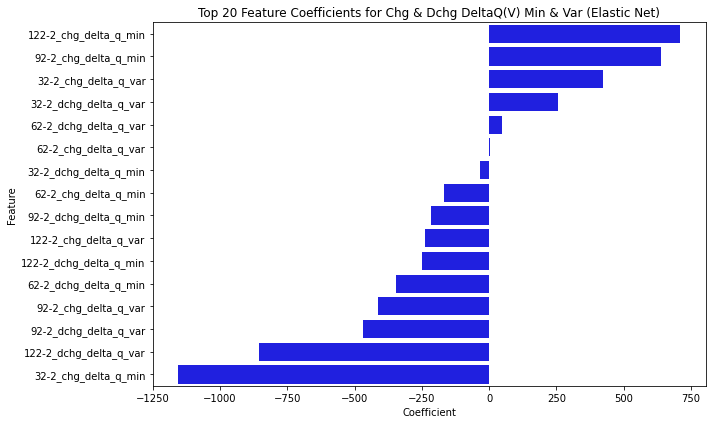

/tmp/ipykernel_1436962/413606256.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  RF_regression_results_df = RF_regression_results_df.append(RF_reg_results_df, ignore_index=True)
/tmp/ipykernel_1436962/413606256.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  EN_regression_results_df = EN_regression_results_df.append(EN_reg_results_df, ignore_index=True)


In [137]:
 # Initialize an empty DataFrame to store the results
RF_regression_results_df = pd.DataFrame(columns=['Features', 'Model', 'Train RMSE Mean [Cycles]', 'Train RMSE Std Dev [Cycles]', 'Test RMSE [Cycles]', 'Test Mean Precent Error [%]'])
EN_regression_results_df = pd.DataFrame(columns=['Features', 'Model', 'Train RMSE Mean [Cycles]', 'Train RMSE Std Dev [Cycles]', 'Test RMSE [Cycles]', 'Test Mean Precent Error [%]'])

for feature_name, feature_combination in features_combinations.items():
    X_train, X_test = feature_combination
   
    # Run the classifier and get the results
    RF_reg_results = run_RF_regressor(X_train, X_test, y_train_reg, y_test_reg, feature_name, group_ids_train)
    EN_reg_results = run_elastic_net_regressor(X_train, X_test, y_train_reg, y_test_reg, feature_name, group_ids_train)
    
    # Convert the results to DataFrames
    RF_reg_results_df = pd.DataFrame([RF_reg_results])
    EN_reg_results_df = pd.DataFrame([EN_reg_results])
    
    # Append the results to the DataFrame
    RF_regression_results_df = RF_regression_results_df.append(RF_reg_results_df, ignore_index=True)
    EN_regression_results_df = EN_regression_results_df.append(EN_reg_results_df, ignore_index=True)

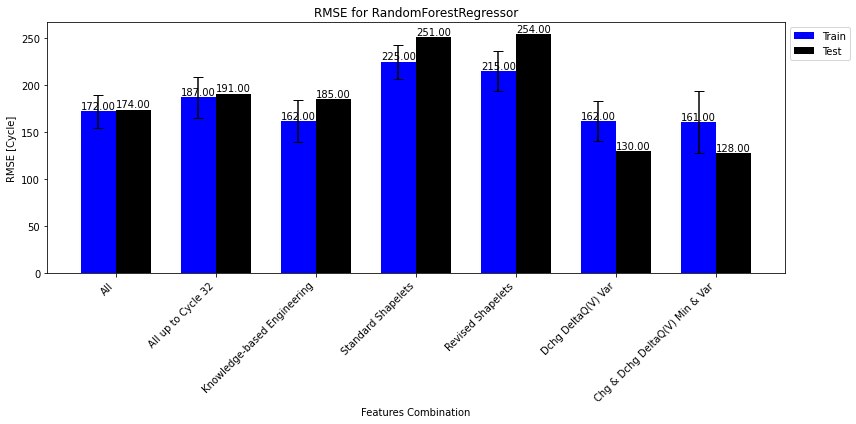

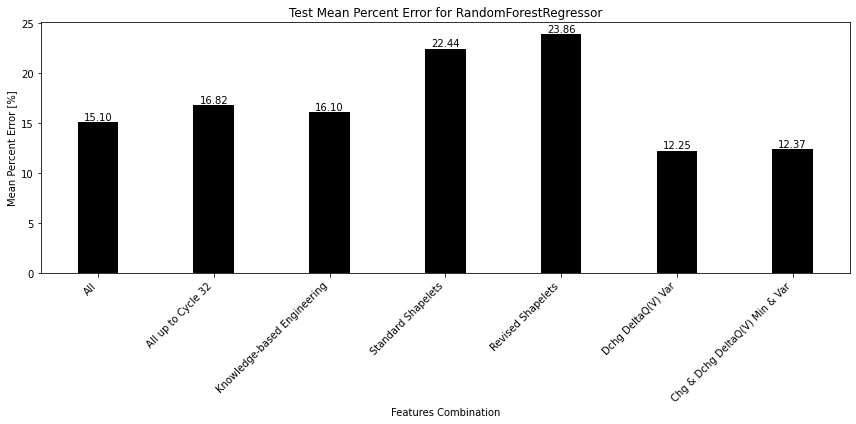

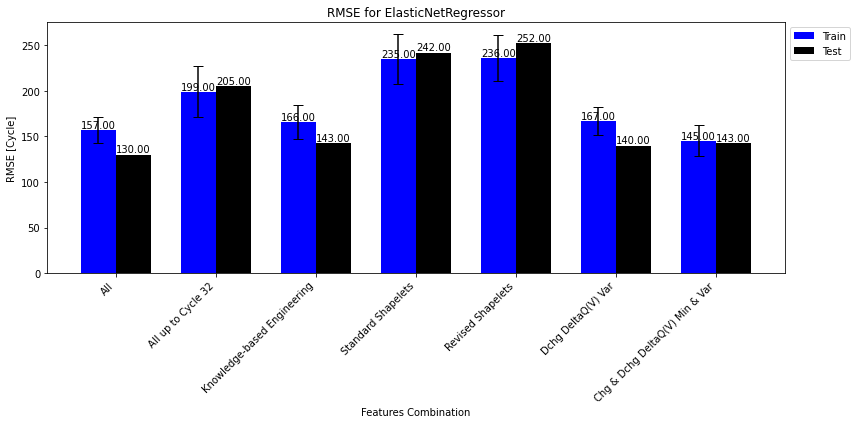

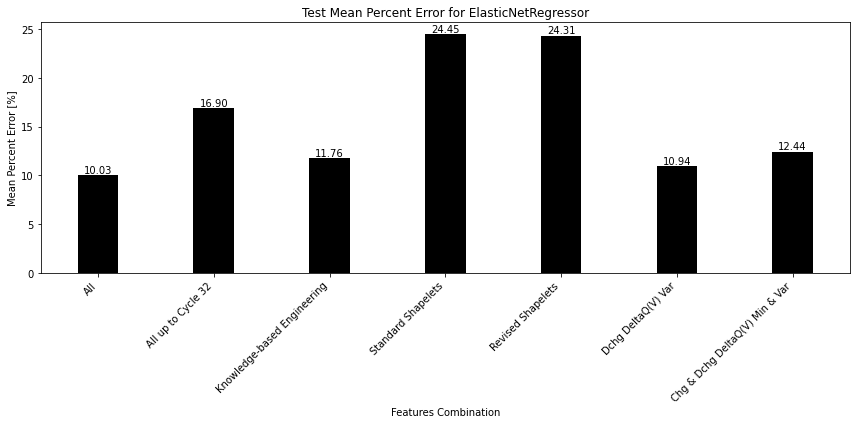

In [138]:
# Paths to save the Excel file and the image
save_path_excel_rf_reg = 'RandomForestRegressor_results.xlsx'
save_path_image_rf_reg = 'RandomForestRegressor_results.png'
save_path_image_mpe_rf = 'RandomForestRegressor_MPE.png'

save_path_excel_en_reg = 'ElasticNetRegressor_results.xlsx'
save_path_image_en_reg = 'ElasticNetRegressor_results.png'
save_path_image_mpe_en = 'ElasticNetRegressor_MPE.png'

# Display the results DataFrame
# print(RF_regression_results_df)
# print(EN_regression_results_df)

# Plot and save for RandomForestClassifier
plot_model_rmse(RF_regression_results_df, 'RandomForestRegressor', save_path_excel_rf_reg, save_path_image_rf_reg)
plot_mean_percent_error(RF_regression_results_df, 'RandomForestRegressor', save_path_image_mpe_rf)

# Plot and save for ElasticNetClassifier
plot_model_rmse(EN_regression_results_df, 'ElasticNetRegressor', save_path_excel_en_reg, save_path_image_en_reg)
plot_mean_percent_error(EN_regression_results_df, 'ElasticNetRegressor', save_path_image_mpe_en)

# END